# Библиотеки

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [2]:
# Фиксируем SEED для воспроизводимости наших экспериментов
RANDOM_SEED = 42
!pip freeze > requirements.txt

In [3]:
import warnings
warnings.filterwarnings('ignore')


# Импорт данных

In [4]:
df_1 = pd.read_excel('X_bp.xlsx',index_col=0)
df_2 = pd.read_excel('X_nup.xlsx',index_col=0)

In [5]:
df_1.head(2)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.0,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.0,23.750000,284.615385,210.0,70.0,3000.0,220.0


In [6]:
df_2.head(2)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0


In [7]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [8]:
df_2.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1040 entries, 0.0 to 1039.0
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   float64
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(3)
memory usage: 32.5 KB


In [9]:
# готовим таблицы к объединению по индексу
columns_1 = df_1.columns.insert(0,'id')
df_1 = df_1.reset_index()
df_1.columns = columns_1

columns_2 = df_2.columns.insert(0,'id')
df_2 = df_2.reset_index()
df_2.columns = columns_2

In [10]:
# объединяем
df = pd.merge(df_1, df_2,how="inner", on='id')
df.set_index('id', inplace=True)

In [11]:
df.sample(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
926.0,2.520207,1913.849905,785.081499,136.906080,22.087454,219.076489,340.839702,73.602043,2729.891656,182.193280,90.0,7.039249,43.926119
861.0,0.875458,2021.354918,844.593735,79.199404,23.112373,251.490126,6.779255,72.098615,2793.115364,143.908879,90.0,4.994143,60.903531
479.0,2.424798,1983.452057,1026.233755,103.222956,18.009823,243.580494,733.269062,71.331364,3305.286922,200.302003,0.0,5.536762,69.819230
569.0,3.560760,1935.832762,1462.306303,104.531155,23.258366,319.567735,640.730223,75.403918,2208.515885,171.223084,90.0,5.935934,62.326305
425.0,3.866805,2002.021851,1115.793713,124.163871,23.593714,272.007970,94.613684,75.215192,2236.869166,217.344269,0.0,5.130975,35.439453


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

Видим, что в полученных после объединения данных пропусков не имеется, всего записей 1023.                   

# EDA

### Статистические показатели по каждому из параметров

In [13]:
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


### Гистограммы распределения и диаграммы ящика с усами

In [14]:
cols = df.columns

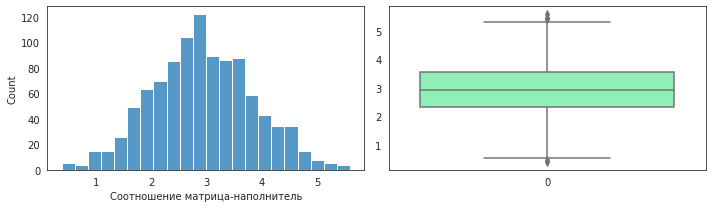

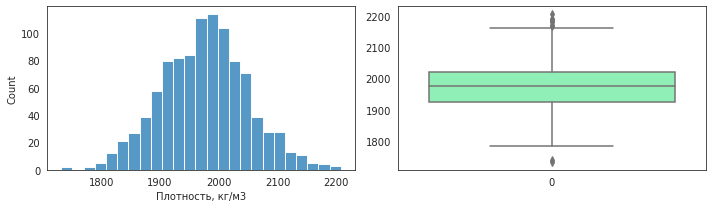

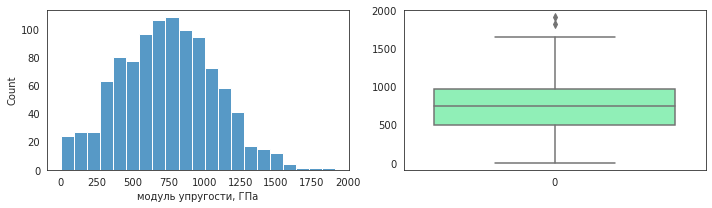

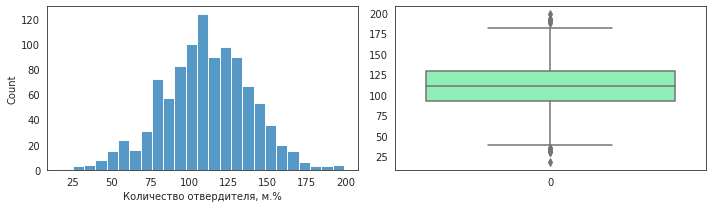

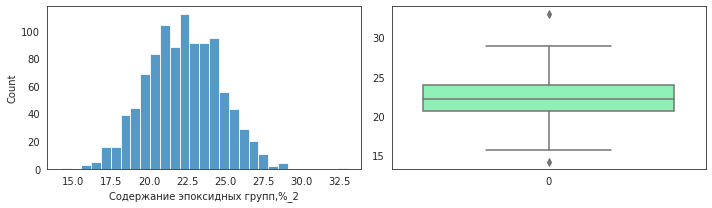

...

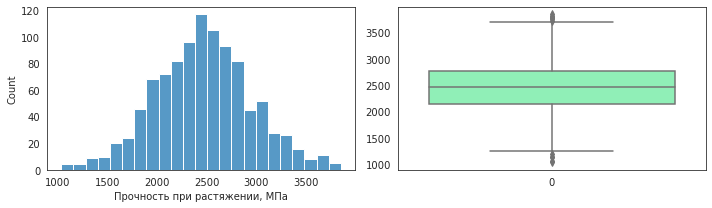

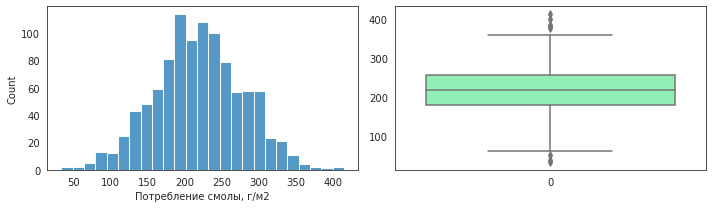

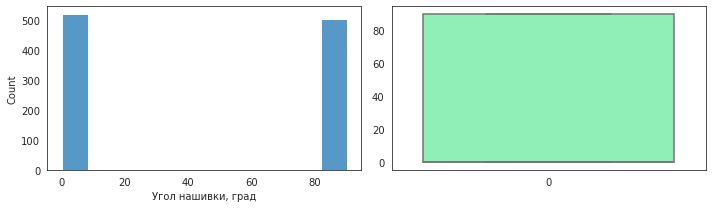

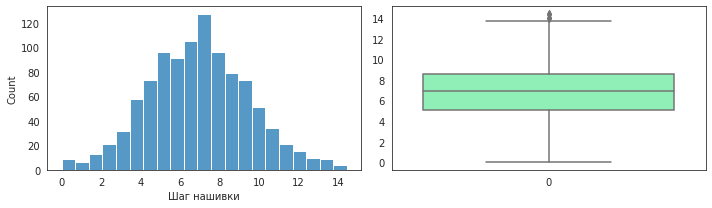

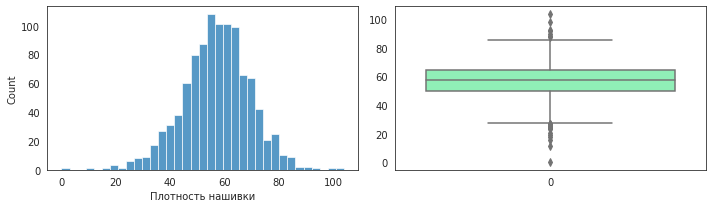

In [15]:
for i in cols:
    f = plt.figure(figsize=(10, 3))
    gs = f.add_gridspec(1, 2)
    with sns.axes_style("white"):
        ax = f.add_subplot(gs[0, 0])
        sns.histplot(df[i], kde = False)#, rug=False, color='b')

    with sns.axes_style("white"):
        ax = f.add_subplot(gs[0, 1])
        sns.boxplot(data=df[i], palette='rainbow')

    f.tight_layout()

Видим, что у всех признаков, кроме "Угол нашивки, град" распределение нормальное или близко к нормальному, а также имеются незначительные выбросы.

In [16]:
df['Угол нашивки, град'].value_counts()

0.0     520
90.0    503
Name: Угол нашивки, град, dtype: int64

Данный признак является бинарным.

In [17]:
# !!! ИЗ ЦЕЛЕВЫХ ТОЖЕ УБИРАЕМ ВЫБРОСЫ
# Уберем бинарный признак и подготовим список признаков, в которых есть выбросы
target_cols = ['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
outliered_cols = cols.drop('Угол нашивки, град')
# for col in target_cols:
#     outliered_cols = outliered_cols.drop(col)

### Попарные графики рассеяния точек

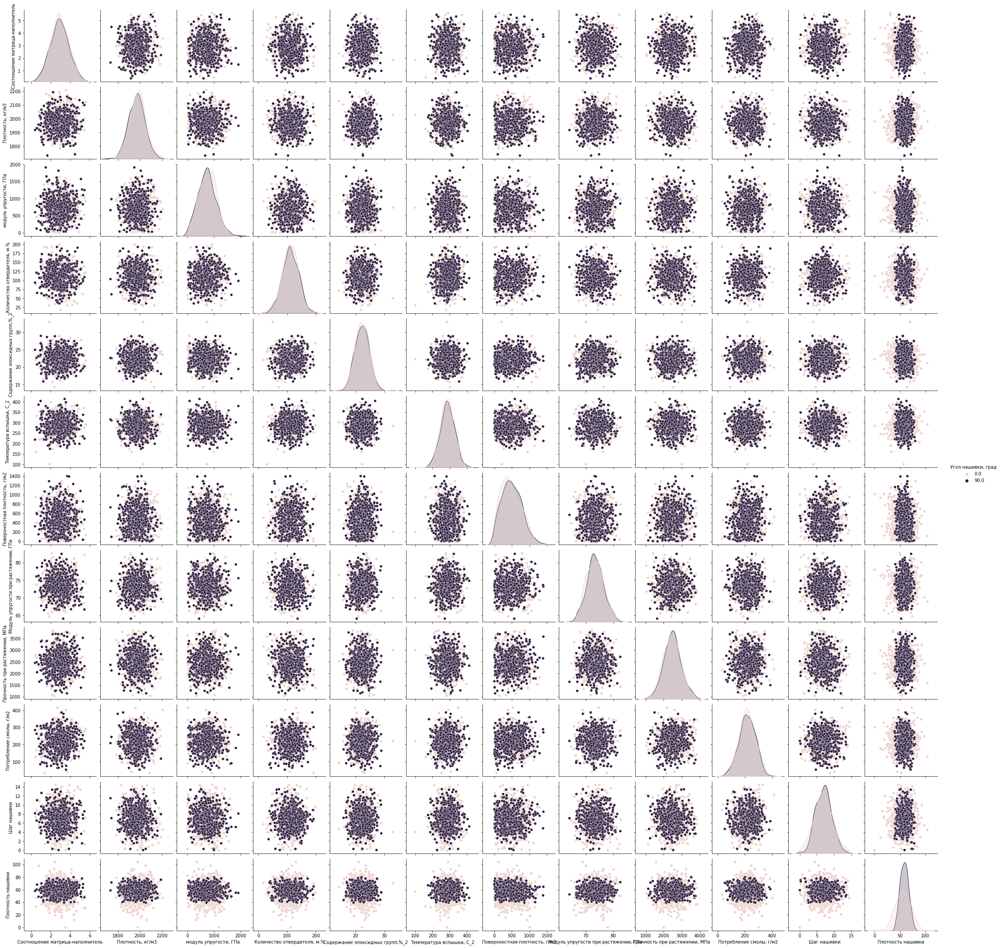

In [18]:
# Нарисуем попарные графики рассеяния с подсветкой угла нашивки
sns.pairplot(df, hue='Угол нашивки, град')

Из диаграммы попарного распределения видим отсутствие зависимостей среди признаков, а также подтверждаются незначительные выбросы. Кроме того можем сказать, что признак Плотность нашивки чувствителен к признаку Угол нашивки, град, а именно при меньшем угле нашивки дисперсия плотности нашивки увеличивается.

### Анализ и исключение выбросов

In [19]:
# Функция для рассчёта границы выбросов и их удаления
def outliers(df:pd.DataFrame, feature:str):
    print('Признак:', feature)
    median = df[feature].median()
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    IQR = Q3 - Q1
    print('\n1й квантиль: {},'.format(Q1),
          '\n3й квантиль: {},'.format(Q3),
          "\nМежквартильный интервал: {}, ".format(IQR),
          "\nГраницы выбросов: [{f}, {l}].".format(f=Q1 - 1.5*IQR, l=Q3 + 1.5*IQR))
    
    # Above Upper bound
    upper = df[feature] >= (Q3+1.5*IQR)
    print('Выше верхней границы:')
    display(df[upper])

    # Below Lower bound
    lower = df[feature] <= (Q1-1.5*IQR)
    print('Ниже нижней границы')
    display(df[lower])
    return df[~upper & ~lower].index # сохраняем индексы за исключением выбросов

In [20]:
# Для каждого признака вычислим выбросы и удалим их из датасета
good_index = set(df.index) # здесь будем собирать индексы без выбросов по всем параметрам
for col in outliered_cols:
    col_ids = set(outliers(df, col)) # индексы по текущему параметру
    good_index = good_index.intersection(col_ids) # объединение множеств

Признак: Соотношение матрица-наполнитель

1й квантиль: 2.3178866441274053, 
3й квантиль: 3.5526598969172998, 
Межквартильный интервал: 1.2347732527898945,  
Границы выбросов: [0.4657267649425636, 5.4048197761021415].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
237.0,5.591742,2121.579070,923.668248,121.713099,21.809294,289.772089,134.349865,74.192008,2203.674811,290.173270,0.0,7.181458,30.882695
284.0,5.425139,2003.272119,524.810110,138.291706,20.793664,370.823575,267.576436,68.492114,1837.316535,226.136105,0.0,4.185605,31.218450
505.0,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0.0,1.280057,50.323463
877.0,5.455566,2099.973071,1249.672556,108.676613,20.171757,223.516610,467.645148,66.657495,2317.268743,219.733228,90.0,8.595968,47.823710


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
378.0,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0.0,7.317168,33.326279
673.0,0.389403,1917.699889,602.093245,93.346585,24.966084,218.303388,325.199965,71.693413,2453.290387,284.389049,90.0,8.160306,58.039018


Признак: Плотность, кг/м3

1й квантиль: 1924.15546684573, 
3й квантиль: 2021.37437454241, 
Межквартильный интервал: 97.21890769667993,  
Границы выбросов: [1778.3271053007102, 2167.20273608743].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
100.0,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0.0,4.512825,46.775469
224.0,1.534731,2182.751822,400.855580,118.766917,24.168973,326.049476,556.740492,78.474257,1773.569546,285.111003,0.0,5.801833,73.541409
251.0,3.759259,2172.246796,97.236317,112.401839,25.605815,281.467572,391.677214,72.838256,2599.779668,237.007233,0.0,9.392177,46.008294
264.0,2.894531,2192.297637,898.658996,127.049451,24.493248,328.174535,260.899791,74.385740,1822.735858,249.479288,0.0,2.841129,76.390449
317.0,2.930757,2184.493200,933.368211,117.801565,23.794065,255.019718,493.908897,72.268947,2617.869224,191.079776,0.0,8.182531,53.264181
499.0,1.813906,2170.342363,909.682529,89.333827,18.825181,270.810351,95.648447,71.933723,3047.474139,238.096456,0.0,1.626690,51.829634
626.0,2.245217,2192.738783,611.766338,108.265862,18.056093,339.313586,391.638637,69.687309,2832.268227,117.178874,90.0,7.955614,75.918566


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
873.0,4.484135,1740.657496,984.287951,61.105569,22.552746,310.232466,98.935192,74.824993,2127.387762,243.620389,90.0,7.094243,71.525700
918.0,1.651444,1731.764635,664.058923,103.299034,22.625733,314.863696,731.002551,71.915252,2368.576114,208.293492,90.0,11.495478,58.843197


Признак: модуль упругости, ГПа

1й квантиль: 500.047451765589, 
3й квантиль: 961.8125264888465, 
Межквартильный интервал: 461.7650747232575,  
Границы выбросов: [-192.6001603192973, 1654.4601385737328].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
592.0,1.487419,1949.031040,1911.536477,98.380762,19.447283,379.172951,426.917622,75.573334,2814.321842,256.522741,90.0,8.100387,54.843521
770.0,2.796648,2007.727318,1815.865170,117.162722,23.688583,300.914088,679.581560,79.518613,3103.000733,179.939702,90.0,5.108723,55.226873


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,


Признак: Количество отвердителя, м.%

1й квантиль: 92.44349744977785, 
3й квантиль: 129.730365711903, 
Межквартильный интервал: 37.286868262125154,  
Границы выбросов: [36.51319505659012, 185.66066810509074].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
94.0,1.620930,2110.566437,124.133740,191.053004,21.590295,280.120468,4.099043,72.680412,1461.448845,171.988605,0.0,7.388167,45.459778
412.0,2.885855,1951.714931,918.042452,198.953207,26.811285,286.748810,962.345527,73.662132,1379.568514,178.357504,0.0,9.582822,55.278331
495.0,2.132552,2033.684615,775.055033,192.851702,20.007524,360.874137,692.366086,70.054191,1950.973300,306.093242,0.0,8.717044,69.800068
503.0,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0.0,8.815040,52.134210
800.0,3.109085,1847.077400,826.699855,188.049898,24.336103,277.894427,694.083948,71.758106,1494.253452,386.903431,90.0,6.412291,60.878525
867.0,4.748316,2082.620963,594.402727,190.318107,22.222827,269.840300,372.333716,76.501452,3197.831498,190.875279,90.0,8.888343,51.811905
958.0,2.633181,1980.680537,339.957349,192.334469,20.624966,332.949267,910.544705,72.031025,3477.625831,301.217753,90.0,6.845225,65.130087


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
208.0,4.706654,1938.949730,1014.173382,35.620904,24.829676,328.864659,379.246075,74.445896,3063.025225,164.547578,0.0,3.906225,50.741725
257.0,3.027269,1959.011062,916.441601,17.740275,21.965568,279.518623,508.912477,74.278829,3165.165801,245.687212,0.0,5.721782,71.172863
448.0,2.435946,1963.974220,741.037038,33.624187,25.259070,278.271284,792.107217,79.878657,2414.230597,196.716930,0.0,5.475548,62.185719
511.0,4.218869,2012.728817,678.842400,32.019222,22.367733,226.523009,79.518438,77.359521,1948.116573,194.988375,0.0,7.148868,57.676338
535.0,3.694056,2132.378269,1261.785969,29.956150,24.382152,302.357365,297.672136,74.515560,3575.590285,308.972215,0.0,4.786794,53.248529
819.0,2.887238,2057.184549,238.828509,35.599697,20.305610,213.988874,338.284487,75.967077,2776.209642,200.705096,90.0,2.419549,55.326406


Признак: Содержание эпоксидных групп,%_2

1й квантиль: 20.60803426690205, 
3й квантиль: 23.9619337641417, 
Межквартильный интервал: 3.3538994972396523,  
Границы выбросов: [15.57718502104257, 28.99278301000118].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
2.0,1.857143,2030.0,738.736842,49.9,33.0,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
298.0,2.385109,2129.059629,589.782966,70.760954,14.254985,302.043927,676.050552,76.472254,2529.945213,92.307158,0.0,4.650262,63.956692


Признак: Температура вспышки, С_2

1й квантиль: 259.066527825323, 
3й квантиль: 313.002105513171, 
Межквартильный интервал: 53.93557768784797,  
Границы выбросов: [178.16316129355107, 393.90547204494294].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
175.0,2.011042,2094.769792,1057.597455,168.911556,21.558425,396.898222,447.184425,72.694298,1548.022724,181.404491,0.0,3.686535,44.369484
649.0,3.547512,1967.434093,741.259184,92.843804,23.553219,397.151291,438.290234,75.303394,2751.998207,196.822228,90.0,4.486241,52.235772
791.0,3.426368,2028.026074,453.458891,105.674852,22.415611,413.273418,586.715020,74.838137,2334.649515,233.293376,90.0,5.256326,46.966045
938.0,0.960288,1910.769529,80.081588,150.647888,26.817201,403.652861,756.286684,75.547761,2650.839969,307.937258,90.0,6.885764,62.784927


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
322.0,2.202033,1905.172266,828.691004,67.342235,19.525485,173.484920,269.230234,71.841083,2761.667212,206.436426,0.0,5.113466,67.063660
378.0,0.463342,1925.610616,992.760436,88.383137,22.147630,160.255843,951.222629,76.210116,2781.540025,127.652751,0.0,7.317168,33.326279
721.0,1.922883,2010.937896,837.613821,110.450712,22.109108,173.973907,585.310794,72.759959,2659.565599,143.805111,90.0,7.768986,67.045308


Признак: Поверхностная плотность, г/м2

1й квантиль: 266.8166453315415, 
3й квантиль: 693.225017143528, 
Межквартильный интервал: 426.4083718119865,  
Границы выбросов: [-372.7959123864383, 1332.8375748615078].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
692.0,3.695486,2014.825483,667.332585,110.860146,21.797640,212.021224,1399.542362,73.194617,3583.506884,270.684615,90.0,8.503453,64.597786
718.0,3.883264,1978.962659,372.566673,94.803958,23.056813,281.289672,1391.032409,73.639983,2649.351334,288.794810,90.0,4.845661,50.952915


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,


Признак: Модуль упругости при растяжении, ГПа

1й квантиль: 71.2450183671113, 
3й квантиль: 75.35661203894679, 
Межквартильный интервал: 4.111593671835493,  
Границы выбросов: [65.07762785935806, 81.52400254670003].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
135.0,2.271032,1862.432065,1428.870308,125.557042,24.023624,317.571591,293.085220,81.594750,2419.520717,220.481828,0.0,0.310815,70.157259
375.0,2.106888,1914.089369,963.748397,58.710809,23.813708,278.612240,793.402805,82.682051,1422.975753,283.239742,0.0,6.776888,49.697311
505.0,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337,0.0,1.280057,50.323463
1000.0,3.109130,2019.939791,855.877168,125.654249,22.788022,323.766318,585.456532,82.525773,2715.953011,251.571333,90.0,4.212257,71.960542


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
52.0,1.846923,1956.087297,622.722758,115.709720,21.043318,236.883672,393.395437,64.696400,2436.273659,188.274123,0.0,6.547993,74.218877
636.0,3.279825,1917.770974,439.231982,136.496126,20.435001,271.303590,569.585247,64.054061,1639.635577,220.688162,90.0,7.073134,52.399576


Признак: Прочность при растяжении, МПа

1й квантиль: 2135.8504482090248, 
3й квантиль: 2767.19311916023, 
Межквартильный интервал: 631.342670951205,  
Границы выбросов: [1188.8364417822172, 3714.2071255870374].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
99.0,3.952834,1931.687894,348.354645,108.403571,22.951690,208.041941,97.545358,71.807955,3725.190760,134.392555,0.0,4.402248,48.959084
106.0,2.334566,2020.976475,1013.513596,109.505135,24.330905,266.258622,719.870002,68.166534,3773.151949,264.835584,0.0,7.363599,69.172337
172.0,3.441706,1839.864649,935.511792,99.079859,20.715839,330.371637,556.153263,76.632138,3791.072810,284.852950,0.0,7.208147,35.768811
185.0,2.152055,1938.282144,1065.625743,148.104233,19.093392,234.856713,865.629036,72.299462,3848.436732,143.123640,0.0,5.783165,36.911051
387.0,3.578323,1988.596676,948.981345,135.707494,22.012106,221.204295,609.350655,71.801782,3817.269484,344.718381,0.0,6.650891,62.726164
695.0,3.694073,2052.863693,607.307517,109.654355,17.638147,267.369398,322.090391,71.446958,3763.445179,110.801517,90.0,3.656530,49.994798


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
262.0,2.344021,2096.712613,352.789412,88.118196,24.747176,282.366448,138.865950,79.161414,1036.856605,191.863993,0.0,4.409139,53.895782
270.0,2.192099,1935.162413,1016.976050,95.568748,26.292664,302.224870,337.500700,71.761063,1071.123751,210.661195,0.0,12.278580,53.714943
318.0,3.739794,2021.454222,806.089944,70.507349,25.003381,278.597026,616.530481,75.682627,1143.210334,169.459749,0.0,1.262310,46.253741
719.0,3.655995,2057.631510,324.704859,93.800024,21.710926,306.242098,23.171395,73.933667,1145.065757,233.719536,90.0,11.946137,61.485847
858.0,3.133253,1987.311373,749.086041,70.682827,22.407309,307.698213,399.313684,73.909383,1188.307418,150.144485,90.0,4.692441,50.858542


Признак: Потребление смолы, г/м2

1й квантиль: 179.6275202311005, 
3й квантиль: 257.48172405689, 
Межквартильный интервал: 77.85420382578951,  
Границы выбросов: [62.84621449241624, 374.2630297955743].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
100.0,3.565855,2207.773481,696.149163,94.187613,23.562885,291.803991,384.629393,68.784473,2596.685251,402.163809,0.0,4.512825,46.775469
119.0,2.967268,2038.728453,1104.753631,137.296385,20.398797,237.000700,430.107822,69.252305,1706.261148,383.663401,0.0,6.232319,77.140355
211.0,2.696183,1959.779639,26.827000,132.031952,19.868797,349.726171,527.229431,74.659159,2188.744473,414.590628,0.0,12.287666,73.044781
593.0,3.307697,1797.648234,807.064161,120.065258,23.882251,305.439343,383.261885,68.901283,2794.677292,378.756879,90.0,4.519954,63.838886
800.0,3.109085,1847.077400,826.699855,188.049898,24.336103,277.894427,694.083948,71.758106,1494.253452,386.903431,90.0,6.412291,60.878525


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
471.0,3.656437,1923.649471,559.380732,109.219575,22.397008,306.957575,452.025051,72.216524,2596.398221,41.048278,0.0,10.081489,45.167995
503.0,1.367585,2088.013591,923.421474,192.705385,23.119301,251.997689,59.939393,77.627654,2149.657181,33.803026,0.0,8.815040,52.134210
787.0,3.564965,1997.294520,859.576828,92.401948,23.257968,342.606754,105.651727,73.043082,2071.988476,53.548916,90.0,4.698996,70.930592


Признак: Шаг нашивки

1й квантиль: 5.080032842905915, 
3й квантиль: 8.586292720359095, 
Межквартильный интервал: 3.5062598774531804,  
Границы выбросов: [-0.17935697327385558, 13.845682536538867].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
114.0,3.153404,2019.552159,1063.742781,146.035949,23.695911,295.731698,822.311634,70.648753,2700.665341,194.238670,0.0,14.051383,74.469002
392.0,2.496519,2064.644261,933.835041,106.898372,22.272400,348.049052,950.685384,74.886839,2694.586007,330.728529,0.0,14.440522,47.713362
446.0,4.770073,1931.131457,516.692589,101.364383,21.538328,301.310480,168.376964,70.910513,2357.739620,198.668197,0.0,14.033215,52.004279
529.0,3.916135,1830.332164,471.506958,133.312208,19.918813,209.999731,241.219283,73.519831,2826.723248,304.184250,0.0,14.376451,46.452598


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,


Признак: Плотность нашивки

1й квантиль: 49.7992121625034, 
3й квантиль: 64.9449611433396, 
Межквартильный интервал: 15.145748980836196,  
Границы выбросов: [27.08058869124911, 87.66358461459389].
Выше верхней границы:


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
117.0,4.136691,1944.518365,589.646853,102.349135,19.580547,247.744983,371.247656,80.075363,2588.981282,346.276191,0.0,7.190538,92.042139
140.0,0.790499,2054.123810,876.794802,116.889391,23.564969,353.561943,643.647660,70.080210,2424.148613,247.193190,0.0,5.506840,98.202603
165.0,2.997574,2097.741722,1107.894781,128.597723,24.659623,262.616232,405.607114,74.569259,2049.320685,173.456799,0.0,5.665134,88.072490
193.0,2.348185,1929.677180,422.524663,104.737519,23.645353,305.799316,554.507496,76.436218,3238.218206,273.174370,0.0,9.992951,92.963492
464.0,2.440166,1980.132394,357.938256,130.541848,21.177094,290.618547,119.756192,68.900703,1577.288189,129.038238,0.0,4.447498,103.988901
465.0,2.870544,2087.293217,257.935595,80.430240,23.476372,205.286821,500.887933,73.015274,2759.752788,230.792998,0.0,5.897057,88.807647
508.0,1.874389,1925.336382,1081.656687,97.142289,21.631286,333.364064,702.726766,76.102634,2749.472482,239.843941,0.0,2.860466,89.876616


Ниже нижней границы


,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
id,,,,,,,,,,,,,
19.0,3.532338,1980.000000,1183.000000,111.860000,22.267857,284.615385,1010.000000,78.000000,2000.000000,300.000000,0.0,0.000000,0.000000
41.0,2.465205,1936.099137,1056.554985,71.294058,24.523381,271.975678,129.077163,66.420794,2868.586527,227.022557,0.0,7.401543,19.250533
74.0,3.126661,1985.376327,1039.385968,122.027950,22.687765,247.090686,202.395246,67.648061,1780.631386,198.685795,0.0,8.489060,23.898196
233.0,4.371095,1976.344005,364.793754,79.244807,23.466818,270.299680,775.305859,76.270802,2259.100944,178.018403,0.0,12.011870,20.571633
279.0,4.434429,2061.918771,328.876626,81.071393,23.213218,244.874100,934.780246,76.238258,2995.952606,178.066150,0.0,2.788476,11.740126
309.0,4.643415,1945.845330,454.765954,84.666648,26.301389,288.021292,265.344838,79.096112,2590.898115,188.892470,0.0,9.397396,25.682856
348.0,1.882909,1905.942096,730.830981,117.729758,23.805123,288.606370,377.545634,68.606157,2773.604435,267.865431,0.0,5.523969,23.143401
369.0,3.607138,1931.763858,652.103313,103.133201,24.476396,276.450352,810.697829,69.622224,1950.165065,202.786361,0.0,8.664552,27.019374
383.0,2.709714,1963.169297,766.471349,135.144779,24.693930,222.276036,376.967176,73.677834,1892.581263,269.239867,0.0,10.545706,26.647154


In [21]:
len(good_index)

936

In [22]:
df_new = df.loc[good_index].copy()

### Корреляции признаков с целевыми переменными

<AxesSubplot:>

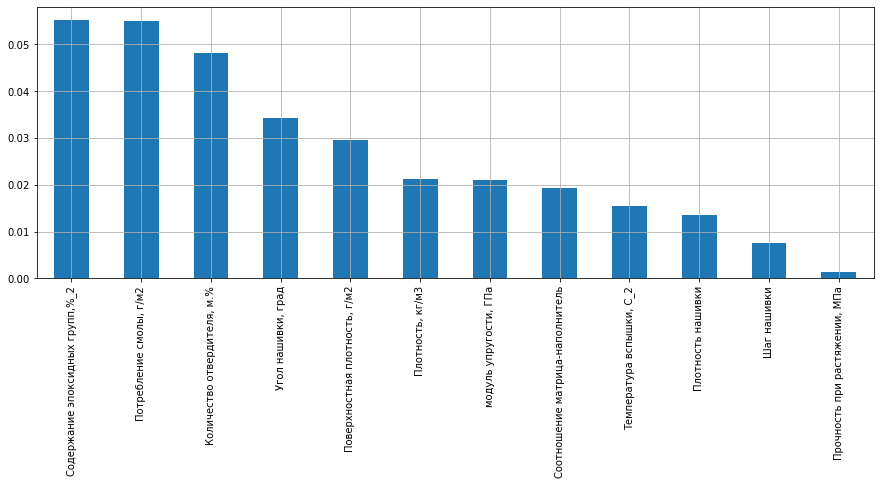

In [23]:
# Корреляция с целевым параметром Модуль упругости при растяжении
corr_resilience = df_new.corrwith(df['Модуль упругости при растяжении, ГПа']).abs().sort_values(ascending=False)
corr_resilience[1:].plot.bar(figsize = (15, 5), grid = True)

<AxesSubplot:>

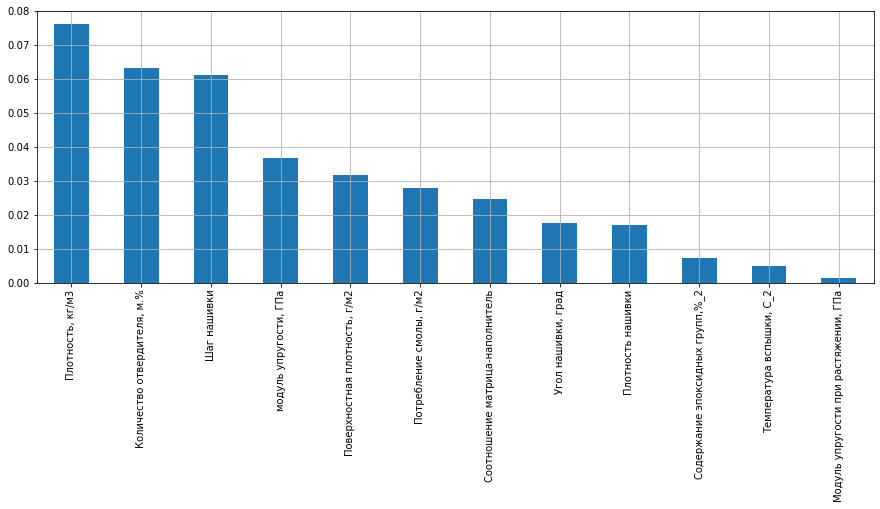

In [24]:
# Корреляция с целевым параметром Прочность при растяжении, МПа
corr_strength = df_new.corrwith(df['Прочность при растяжении, МПа']).abs().sort_values(ascending=False)
corr_strength[1:].plot.bar(figsize = (15, 5), grid = True)

<AxesSubplot:>

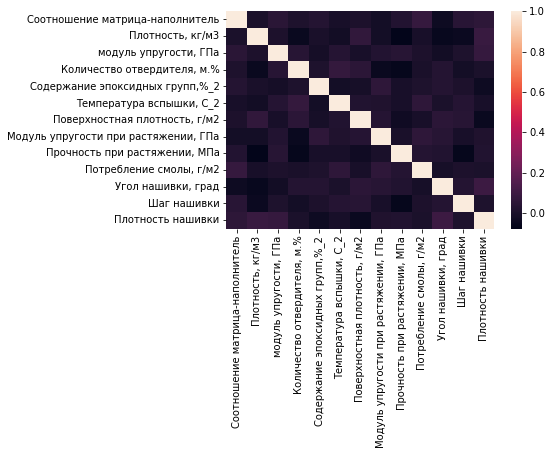

In [25]:
df_num = df_new
sns.heatmap(df_new.corr())#, annot = True)

## Train Test Split

In [26]:
# Из train выделяем данные на валидацию 
df_train, df_test = train_test_split(df_new, test_size=0.3, random_state=RANDOM_SEED)
df_new.shape, df_train.shape, df_test.shape

((936, 13), (655, 13), (281, 13))

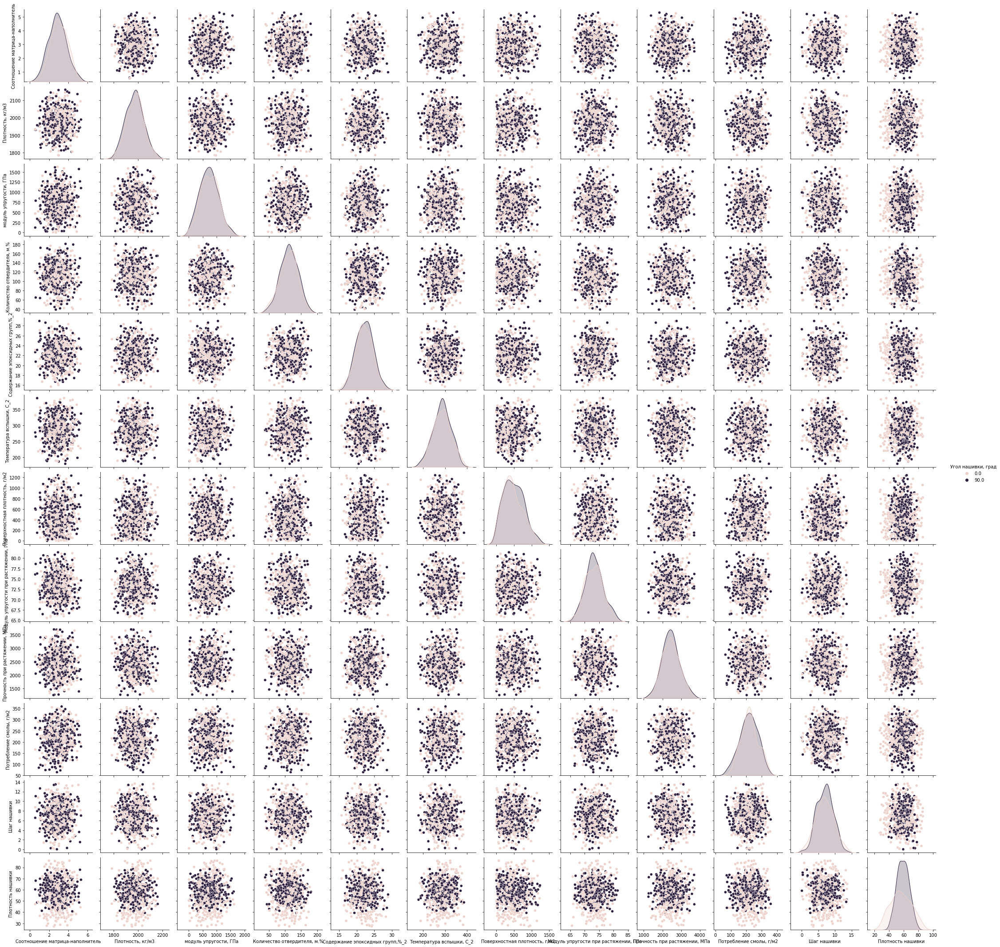

In [27]:
# Посмотрим на графики рассеяния трейна до нормализации
sns.pairplot(df_train, hue='Угол нашивки, град')

## Нормализация

In [28]:
from sklearn.preprocessing import MinMaxScaler

Поскольку в задании предлагается с помощью разных методов машинного обучения выполнить прогноз для следующих признаков:                          
- Модуль упругости при растяжении, ГПа, 
- Прочность при растяжении, МПа, 
- Соотношение матрица-наполнитель,                                       

то данные признаки исключим из нормализации и проведем по ним масштабирование.

In [29]:
cols_to_norm = df_new.columns
for col in target_cols:
    cols_to_norm = cols_to_norm.drop(col)

In [30]:
scaler = MinMaxScaler()
df_scaled = scaler.fit(df_train[cols_to_norm]) # fit по части train
df_scaled_train = df_scaled.transform(df_train[cols_to_norm])
df_scaled_test = df_scaled.transform(df_test[cols_to_norm])
df_scaled_train = pd.DataFrame(df_scaled_train, columns = cols_to_norm)
df_scaled_test = pd.DataFrame(df_scaled_test, columns = cols_to_norm)

In [31]:
# Сделаем индексы в train и test порядковыми числами для приведения в соответствие с нормированными df
df_train.index = range(len(df_train))
df_test.index = range(len(df_test))

In [32]:
# К нормированным датафреймам приклеиваем столбцы с таргетами
df_scaled_train = pd.concat([df_scaled_train, df_train[target_cols]], axis=1)
df_scaled_test = pd.concat([df_scaled_test, df_test[target_cols]], axis=1)

In [33]:
target_max_vol = {} # запоминаем максимальные значения в словарь
for col in target_cols:
    target_max_vol[col] = df_scaled_train[col].max()
    print('Максимальное значение по столбцу ', col, ' = ', df_scaled_train[col].max())

Максимальное значение по столбцу  Соотношение матрица-наполнитель  =  5.3141436851035
Максимальное значение по столбцу  Модуль упругости при растяжении, ГПа  =  81.4171259444738
Максимальное значение по столбцу  Прочность при растяжении, МПа  =  3705.67252336168


In [34]:
# масштабируем таргеты
for col, max_vol in target_max_vol.items():
    df_scaled_train[col] = df_scaled_train[col]/max_vol
    df_scaled_test[col] = df_scaled_test[col]/max_vol

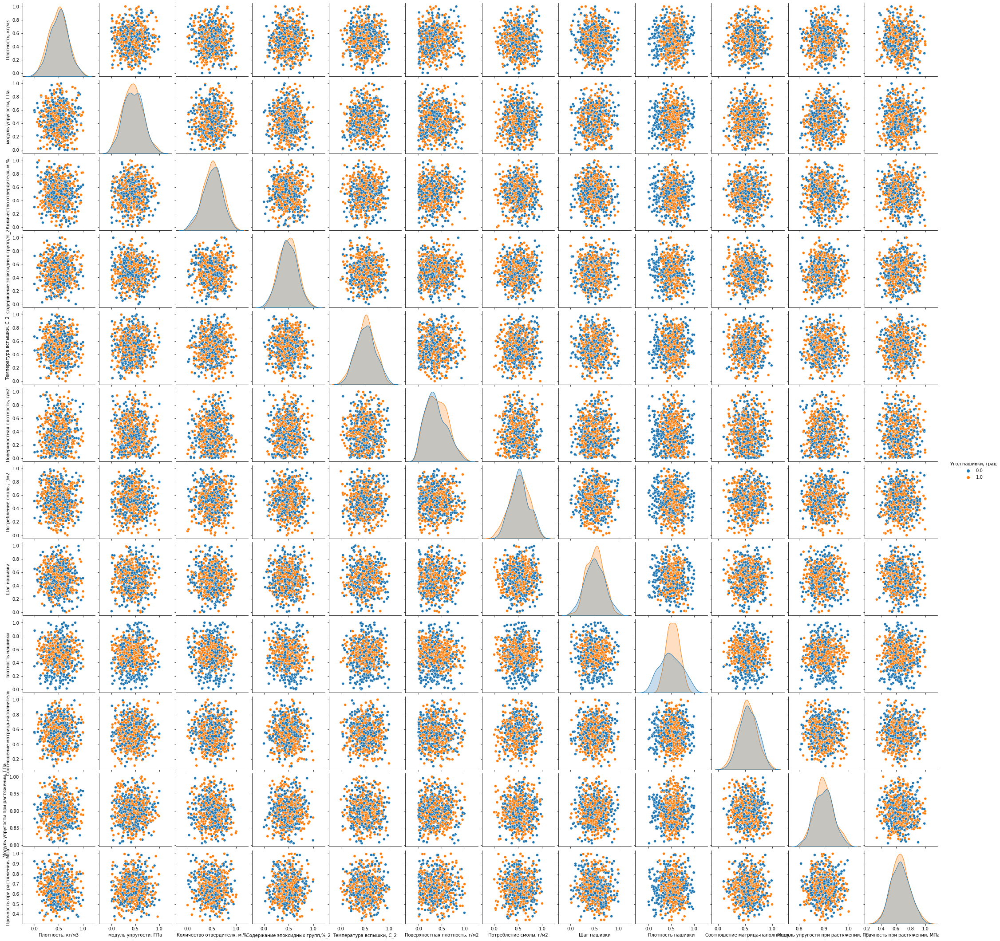

In [35]:
# Графики рассеяния трейна после нормализации
sns.pairplot(df_scaled_train, hue='Угол нашивки, град')

In [36]:
df_scaled_train.describe()

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"
count,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000,655.000000
mean,0.499855,0.448510,0.513334,0.488322,0.513724,0.383833,0.524528,0.519084,0.505399,0.514290,0.552499,0.899527,0.659563
std,0.189224,0.201150,0.192003,0.180386,0.195568,0.226180,0.195873,0.500018,0.189632,0.193938,0.169805,0.037717,0.126017
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.103006,0.805154,0.337427
25%,0.360724,0.303536,0.381763,0.364999,0.378556,0.212833,0.392745,0.000000,0.364441,0.389709,0.436429,0.873727,0.567134
50%,0.506115,0.444242,0.516289,0.486570,0.517354,0.358469,0.527493,1.000000,0.511261,0.511904,0.549416,0.898302,0.657718
75%,0.618897,0.585997,0.644797,0.618034,0.646501,0.555098,0.654629,1.000000,0.639672,0.644876,0.670122,0.923851,0.740345
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [37]:
df_scaled_test.describe()

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"
count,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000,281.000000
mean,0.512936,0.462299,0.493850,0.497964,0.521501,0.403351,0.508707,0.494662,0.504484,0.512579,0.545995,0.902319,0.680564
std,0.185751,0.204702,0.184593,0.181306,0.178785,0.226555,0.197325,0.500864,0.171599,0.185483,0.164524,0.036322,0.122134
min,0.046399,0.001170,0.033618,0.014011,0.068008,0.000860,-0.002847,0.000000,0.039232,0.025269,0.155625,0.813358,0.360913
25%,0.385881,0.326428,0.370958,0.374410,0.401968,0.226089,0.381265,0.000000,0.391235,0.390484,0.440495,0.877144,0.593290
50%,0.520423,0.462012,0.490077,0.491174,0.513874,0.389264,0.495062,0.000000,0.503375,0.523070,0.541644,0.901816,0.686309
75%,0.630592,0.601485,0.629551,0.633548,0.645243,0.568503,0.645198,1.000000,0.606274,0.624644,0.651201,0.927465,0.753921
max,1.002163,1.013174,1.005589,0.991991,0.998209,1.042705,0.992781,1.000000,1.005759,0.980055,0.996556,0.997029,0.995561


## Метрика

In [38]:
metrics_elasticity = pd.DataFrame(columns=['feature', 'model', 'MSE', 'MAE', 'MAPE', 'R2'])
metrics_strength = pd.DataFrame(columns=['feature', 'model', 'MSE', 'MAE', 'MAPE', 'R2'])
metrics_filler_matrix = pd.DataFrame(columns=['feature', 'model', 'MSE', 'MAE', 'MAPE', 'R2'])

def metrics(target, model, y_true, y_pred):
    global metrics_elasticity
    global metrics_strength
    global metrics_filler_matrix
    MSE = mean_squared_error(y_true, y_pred)
    MAE = mean_absolute_error(y_true, y_pred)
    MAPE = np.mean(np.abs((y_pred-y_true)/y_true))
    R2 = r2_score(y_true, y_pred)
    if target == 'elasticity':
        metrics_elasticity = metrics_elasticity.append({
            'feature': 'elasticity',
            'model': model,
            'MSE': round(MSE, 2),
            'MAE': round(MAE, 2),
            'MAPE': round(MAPE, 2), 
            'R2': round(R2, 2) 
        }, ignore_index=True)
        return metrics_elasticity
    if target == 'strength':
        metrics_strength = metrics_strength.append({
            'feature': 'strength',
            'model': model,
            'MSE': round(MSE, 2),
            'MAE': round(MAE, 2),
            'MAPE': round(MAPE, 2), 
            'R2': round(R2, 2) 
        }, ignore_index=True)
        return metrics_strength
    if target == 'filler_matrix':
        metrics_filler_matrix = metrics_filler_matrix.append({
            'feature': 'filler_matrix',
            'model': model,
            'MSE': round(MSE, 2),
            'MAE': round(MAE, 2),
            'MAPE': round(MAPE, 2), 
            'R2': round(R2, 2) 
        }, ignore_index=True)
        return metrics_filler_matrix

In [39]:
# по заданию отделяем таргеты для части ml от фичей
ml_targets = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
X_train = df_scaled_train.drop(ml_targets, axis = 1)
y_train = df_scaled_train[ml_targets].values            # наши таргеты

X_test = df_scaled_test.drop(ml_targets, axis = 1)
y_test = df_scaled_test[ml_targets].values            # наши таргеты

In [40]:
df_scaled_train

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа"
0,0.858606,0.436595,0.156821,0.876092,0.431124,0.097718,0.935369,0.0,0.332927,0.872912,0.614873,0.995531,0.933822
1,0.532788,0.382890,0.647944,0.623437,0.327025,0.223144,0.212010,1.0,0.856820,0.450655,0.462212,0.898302,0.580415
2,0.511299,0.386628,0.687896,0.703749,0.490912,0.476836,0.574415,1.0,0.289536,0.269573,0.479508,0.903495,0.818670
3,0.544913,0.249696,0.000000,0.281764,0.512788,0.064362,0.061315,1.0,0.632543,0.746264,0.506664,0.925018,0.488942
4,0.488416,0.688084,0.715396,0.403005,0.276604,0.791937,0.390962,1.0,0.351997,0.509573,0.729169,0.894693,0.708133
...,...,...,...,...,...,...,...,...,...,...,...,...,...
650,0.593688,0.423824,0.576072,0.632524,0.405216,0.240995,0.333953,0.0,0.428167,0.550694,0.747648,0.880410,0.591732
651,0.304918,0.631537,0.393275,0.115867,0.387595,0.244669,0.393188,0.0,0.361653,0.476473,0.481260,0.890002,0.624149
652,0.189222,0.663004,0.378386,0.694251,0.396582,0.357517,0.554511,1.0,0.416311,0.422657,0.435303,0.923174,0.795798
653,0.698062,0.294025,0.741220,0.528655,0.386197,0.103130,0.302126,0.0,0.366651,0.343176,0.620658,0.898086,0.900698


# ML

In [41]:
def param_searcher(estimator, X_train, y_train, param_grid, cv=3, verbose = 2):
    grid_search = GridSearchCV(estimator = estimator, param_grid = param_grid, 
                          cv = cv, n_jobs = -1, verbose = verbose)
    grid_search.fit(X_train, y_train)
    return grid_search.best_estimator_

### 1. RandomForestRegressor

In [42]:
from sklearn.ensemble import RandomForestRegressor 
from pprint import pprint
import pickle

In [43]:
# # Загрузка сохраненной модели
# model_rf = pickle.load(open('model_rf', 'rb'))

In [44]:
rf = RandomForestRegressor(random_state = RANDOM_SEED)
param_grid_rf = {
    'bootstrap': [True],
    'max_depth': [60, 70, 80, 90],
    'max_features': [2, 3, 'log2', 'sqrt'],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [300, 400]
}

# Ищем параметры
model_rf = param_searcher(rf, X_train, y_train, param_grid_rf)
print(model_rf)

Fitting 3 folds for each of 288 candidates, totalling 864 fits
RandomForestRegressor(max_depth=60, max_features=2, min_samples_leaf=5,
                      min_samples_split=8, n_estimators=300, random_state=42)


In [45]:
# Обучим модель на данных 
model_rf.fit(X_train, y_train)

pickle.dump(model_rf, open('model_rf', 'wb')) #Saving the model

y_rf = model_rf.predict(X_test)

In [46]:
# Возвращаем масштаб таргетам
y_test_unscaled = y_test.copy()
y_test_unscaled[:, 0] = y_test_unscaled[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_rf[:, 0] = y_rf[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_test_unscaled[:, 1] = y_test_unscaled[:, 1]*target_max_vol['Прочность при растяжении, МПа']
y_rf[:, 1] = y_rf[:, 1]*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
display(metrics('elasticity', 'RandomForestRegressor', y_test_unscaled[:, 0], y_rf[:, 0]))
metrics('strength', 'RandomForestRegressor', y_test_unscaled[:, 1], y_rf[:, 1])

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.7,2.39,0.03,0.0


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04


### 2. Регрессия Lasso

In [47]:
from sklearn.linear_model import MultiTaskLassoCV

In [48]:
Lasso = MultiTaskLassoCV(normalize=True, random_state = RANDOM_SEED)

param_grid_Lasso = {
    'eps': [1e-3, 1e-2, 1e-4],
    'n_alphas': [80, 90, 100],
    'tol': [1e-4, 1e-5]
}

# Ищем параметры
model_Lasso = param_searcher(Lasso, X_train, y_train, param_grid_Lasso)
print(model_Lasso)
model_Lasso.fit(X_train, y_train)

Fitting 3 folds for each of 18 candidates, totalling 54 fits
MultiTaskLassoCV(n_alphas=80, normalize=True, random_state=42)


MultiTaskLassoCV(n_alphas=80, normalize=True, random_state=42)

In [49]:
pickle.dump(model_Lasso, open('model_Lasso', 'wb')) #Saving the model

y_pred_lasso = model_Lasso.predict(X_test)

# Возвращаем масштаб таргетам
y_pred_lasso[:, 0] = y_pred_lasso[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_pred_lasso[:, 1] = y_pred_lasso[:, 1]*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
display(metrics('elasticity', 'MultiTaskLassoCV', y_test_unscaled[:, 0], y_pred_lasso[:, 0]))
metrics('strength', 'MultiTaskLassoCV', y_test_unscaled[:, 1], y_pred_lasso[:, 1])

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.7,2.39,0.03,0.0
1,elasticity,MultiTaskLassoCV,8.77,2.4,0.03,-0.01


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.7,0.15,-0.03


### 3. CatBoostRegressor

In [50]:
from catboost import CatBoostRegressor

In [51]:
# # Загрузка сохраненной модели
# cat = pickle.load(open('catboost_model', 'rb'))

In [52]:
cat = CatBoostRegressor(od_wait=500, 
                        loss_function='MultiRMSE', 
                        random_state=RANDOM_SEED)
grid = {'learning_rate': [0.03, 0.1],
        'depth': [4, 6, 10],
        'l2_leaf_reg': [1, 3, 5, 7, 9]}

# у catboost свой поиск по сетке
grid_search = cat.grid_search(grid, X=X_train, y=y_train)#, search_by_train_test_split = False)

0:	learn: 1.0905022	test: 1.0913393	best: 1.0913393 (0)	total: 140ms	remaining: 2m 19s
1:	learn: 1.0591650	test: 1.0600222	best: 1.0600222 (1)	total: 141ms	remaining: 1m 10s
2:	learn: 1.0284286	test: 1.0294489	best: 1.0294489 (2)	total: 142ms	remaining: 47.1s
3:	learn: 0.9987448	test: 0.9998371	best: 0.9998371 (3)	total: 143ms	remaining: 35.5s
4:	learn: 0.9697584	test: 0.9710515	best: 0.9710515 (4)	total: 144ms	remaining: 28.6s
5:	learn: 0.9418533	test: 0.9430994	best: 0.9430994 (5)	total: 145ms	remaining: 23.9s
6:	learn: 0.9144695	test: 0.9159515	best: 0.9159515 (6)	total: 145ms	remaining: 20.6s
7:	learn: 0.8883528	test: 0.8900450	best: 0.8900450 (7)	total: 146ms	remaining: 18.1s
8:	learn: 0.8629419	test: 0.8647663	best: 0.8647663 (8)	total: 147ms	remaining: 16.2s
9:	learn: 0.8381913	test: 0.8401108	best: 0.8401108 (9)	total: 148ms	remaining: 14.6s
10:	learn: 0.8141435	test: 0.8160173	best: 0.8160173 (10)	total: 149ms	remaining: 13.4s
11:	learn: 0.7908011	test: 0.7927395	best: 0.79273

207:	learn: 0.1116419	test: 0.1385076	best: 0.1379225 (161)	total: 297ms	remaining: 1.13s
208:	learn: 0.1115445	test: 0.1385262	best: 0.1379225 (161)	total: 298ms	remaining: 1.13s
209:	learn: 0.1114731	test: 0.1385252	best: 0.1379225 (161)	total: 298ms	remaining: 1.12s
210:	learn: 0.1114077	test: 0.1385404	best: 0.1379225 (161)	total: 299ms	remaining: 1.12s
211:	learn: 0.1112927	test: 0.1386216	best: 0.1379225 (161)	total: 300ms	remaining: 1.11s
212:	learn: 0.1112166	test: 0.1385904	best: 0.1379225 (161)	total: 301ms	remaining: 1.11s
213:	learn: 0.1111448	test: 0.1386128	best: 0.1379225 (161)	total: 302ms	remaining: 1.11s
214:	learn: 0.1110327	test: 0.1386851	best: 0.1379225 (161)	total: 303ms	remaining: 1.1s
215:	learn: 0.1109764	test: 0.1386555	best: 0.1379225 (161)	total: 303ms	remaining: 1.1s
216:	learn: 0.1108367	test: 0.1387348	best: 0.1379225 (161)	total: 304ms	remaining: 1.1s
217:	learn: 0.1107743	test: 0.1387123	best: 0.1379225 (161)	total: 305ms	remaining: 1.09s
218:	learn: 0

422:	learn: 0.0928122	test: 0.1416695	best: 0.1379225 (161)	total: 463ms	remaining: 631ms
423:	learn: 0.0927481	test: 0.1417099	best: 0.1379225 (161)	total: 464ms	remaining: 630ms
424:	learn: 0.0926710	test: 0.1417395	best: 0.1379225 (161)	total: 465ms	remaining: 629ms
425:	learn: 0.0925839	test: 0.1418102	best: 0.1379225 (161)	total: 466ms	remaining: 627ms
426:	learn: 0.0925447	test: 0.1417957	best: 0.1379225 (161)	total: 466ms	remaining: 626ms
427:	learn: 0.0924495	test: 0.1417929	best: 0.1379225 (161)	total: 467ms	remaining: 624ms
428:	learn: 0.0923849	test: 0.1418112	best: 0.1379225 (161)	total: 468ms	remaining: 623ms
429:	learn: 0.0923329	test: 0.1418384	best: 0.1379225 (161)	total: 469ms	remaining: 621ms
430:	learn: 0.0922962	test: 0.1418474	best: 0.1379225 (161)	total: 470ms	remaining: 620ms
431:	learn: 0.0922523	test: 0.1418329	best: 0.1379225 (161)	total: 470ms	remaining: 618ms
432:	learn: 0.0921751	test: 0.1418043	best: 0.1379225 (161)	total: 471ms	remaining: 617ms
433:	learn

637:	learn: 0.0791157	test: 0.1434757	best: 0.1379225 (161)	total: 629ms	remaining: 357ms
638:	learn: 0.0790463	test: 0.1434045	best: 0.1379225 (161)	total: 630ms	remaining: 356ms
639:	learn: 0.0790078	test: 0.1433964	best: 0.1379225 (161)	total: 631ms	remaining: 355ms
640:	learn: 0.0789561	test: 0.1433791	best: 0.1379225 (161)	total: 632ms	remaining: 354ms
641:	learn: 0.0788805	test: 0.1433782	best: 0.1379225 (161)	total: 632ms	remaining: 353ms
642:	learn: 0.0788191	test: 0.1434083	best: 0.1379225 (161)	total: 633ms	remaining: 352ms
643:	learn: 0.0787663	test: 0.1433938	best: 0.1379225 (161)	total: 634ms	remaining: 350ms
644:	learn: 0.0787265	test: 0.1433407	best: 0.1379225 (161)	total: 635ms	remaining: 349ms
645:	learn: 0.0786835	test: 0.1433650	best: 0.1379225 (161)	total: 636ms	remaining: 348ms
646:	learn: 0.0785980	test: 0.1433775	best: 0.1379225 (161)	total: 636ms	remaining: 347ms
647:	learn: 0.0785510	test: 0.1434172	best: 0.1379225 (161)	total: 637ms	remaining: 346ms
648:	learn

175:	learn: 0.0815850	test: 0.1423156	best: 0.1381675 (81)	total: 131ms	remaining: 612ms
176:	learn: 0.0814378	test: 0.1423348	best: 0.1381675 (81)	total: 131ms	remaining: 611ms
177:	learn: 0.0812150	test: 0.1422870	best: 0.1381675 (81)	total: 132ms	remaining: 610ms
178:	learn: 0.0810295	test: 0.1422785	best: 0.1381675 (81)	total: 133ms	remaining: 610ms
179:	learn: 0.0807689	test: 0.1421130	best: 0.1381675 (81)	total: 134ms	remaining: 609ms
180:	learn: 0.0806378	test: 0.1420669	best: 0.1381675 (81)	total: 134ms	remaining: 608ms
181:	learn: 0.0803842	test: 0.1420645	best: 0.1381675 (81)	total: 135ms	remaining: 607ms
182:	learn: 0.0801465	test: 0.1420382	best: 0.1381675 (81)	total: 136ms	remaining: 606ms
183:	learn: 0.0799291	test: 0.1419307	best: 0.1381675 (81)	total: 136ms	remaining: 605ms
184:	learn: 0.0797308	test: 0.1420185	best: 0.1381675 (81)	total: 137ms	remaining: 605ms
185:	learn: 0.0796271	test: 0.1420964	best: 0.1381675 (81)	total: 138ms	remaining: 604ms
186:	learn: 0.0793859

399:	learn: 0.0487759	test: 0.1447395	best: 0.1381675 (81)	total: 293ms	remaining: 440ms
400:	learn: 0.0486387	test: 0.1447306	best: 0.1381675 (81)	total: 294ms	remaining: 439ms
401:	learn: 0.0485762	test: 0.1447978	best: 0.1381675 (81)	total: 295ms	remaining: 439ms
402:	learn: 0.0484837	test: 0.1447613	best: 0.1381675 (81)	total: 297ms	remaining: 439ms
403:	learn: 0.0483934	test: 0.1447194	best: 0.1381675 (81)	total: 297ms	remaining: 439ms
404:	learn: 0.0483346	test: 0.1447754	best: 0.1381675 (81)	total: 298ms	remaining: 438ms
405:	learn: 0.0482354	test: 0.1447476	best: 0.1381675 (81)	total: 299ms	remaining: 438ms
406:	learn: 0.0481315	test: 0.1447482	best: 0.1381675 (81)	total: 300ms	remaining: 438ms
407:	learn: 0.0480337	test: 0.1447623	best: 0.1381675 (81)	total: 301ms	remaining: 437ms
408:	learn: 0.0479076	test: 0.1447989	best: 0.1381675 (81)	total: 302ms	remaining: 436ms
409:	learn: 0.0477906	test: 0.1447142	best: 0.1381675 (81)	total: 303ms	remaining: 436ms
410:	learn: 0.0477096

30:	learn: 0.4769026	test: 0.4826478	best: 0.4826478 (30)	total: 22.3ms	remaining: 698ms
31:	learn: 0.4645684	test: 0.4703182	best: 0.4703182 (31)	total: 23.3ms	remaining: 706ms
32:	learn: 0.4523116	test: 0.4580787	best: 0.4580787 (32)	total: 24.1ms	remaining: 707ms
33:	learn: 0.4407300	test: 0.4466306	best: 0.4466306 (33)	total: 25.4ms	remaining: 721ms
34:	learn: 0.4291752	test: 0.4352164	best: 0.4352164 (34)	total: 26.1ms	remaining: 721ms
35:	learn: 0.4181770	test: 0.4243842	best: 0.4243842 (35)	total: 27.2ms	remaining: 728ms
36:	learn: 0.4075095	test: 0.4138457	best: 0.4138457 (36)	total: 28.1ms	remaining: 731ms
37:	learn: 0.3969707	test: 0.4034184	best: 0.4034184 (37)	total: 29ms	remaining: 733ms
38:	learn: 0.3867241	test: 0.3932864	best: 0.3932864 (38)	total: 29.8ms	remaining: 734ms
39:	learn: 0.3770161	test: 0.3837334	best: 0.3837334 (39)	total: 30.5ms	remaining: 731ms
40:	learn: 0.3676094	test: 0.3745342	best: 0.3745342 (40)	total: 31.4ms	remaining: 735ms
41:	learn: 0.3584364	te

247:	learn: 0.1112165	test: 0.1411530	best: 0.1401152 (176)	total: 187ms	remaining: 568ms
248:	learn: 0.1111144	test: 0.1411988	best: 0.1401152 (176)	total: 188ms	remaining: 567ms
249:	learn: 0.1110018	test: 0.1411791	best: 0.1401152 (176)	total: 189ms	remaining: 566ms
250:	learn: 0.1109113	test: 0.1411481	best: 0.1401152 (176)	total: 190ms	remaining: 567ms
251:	learn: 0.1108106	test: 0.1411305	best: 0.1401152 (176)	total: 191ms	remaining: 567ms
252:	learn: 0.1107092	test: 0.1410370	best: 0.1401152 (176)	total: 192ms	remaining: 566ms
253:	learn: 0.1106872	test: 0.1410420	best: 0.1401152 (176)	total: 193ms	remaining: 566ms
254:	learn: 0.1105975	test: 0.1411422	best: 0.1401152 (176)	total: 193ms	remaining: 565ms
255:	learn: 0.1104702	test: 0.1411815	best: 0.1401152 (176)	total: 194ms	remaining: 564ms
256:	learn: 0.1104093	test: 0.1411902	best: 0.1401152 (176)	total: 195ms	remaining: 563ms
257:	learn: 0.1103315	test: 0.1411754	best: 0.1401152 (176)	total: 196ms	remaining: 563ms
258:	learn

462:	learn: 0.0945171	test: 0.1428121	best: 0.1401152 (176)	total: 350ms	remaining: 406ms
463:	learn: 0.0944699	test: 0.1428143	best: 0.1401152 (176)	total: 351ms	remaining: 406ms
464:	learn: 0.0944084	test: 0.1428322	best: 0.1401152 (176)	total: 352ms	remaining: 405ms
465:	learn: 0.0943503	test: 0.1428444	best: 0.1401152 (176)	total: 353ms	remaining: 404ms
466:	learn: 0.0942940	test: 0.1428706	best: 0.1401152 (176)	total: 354ms	remaining: 404ms
467:	learn: 0.0942651	test: 0.1428483	best: 0.1401152 (176)	total: 355ms	remaining: 403ms
468:	learn: 0.0942054	test: 0.1428982	best: 0.1401152 (176)	total: 355ms	remaining: 402ms
469:	learn: 0.0941841	test: 0.1428838	best: 0.1401152 (176)	total: 356ms	remaining: 402ms
470:	learn: 0.0941235	test: 0.1428997	best: 0.1401152 (176)	total: 357ms	remaining: 401ms
471:	learn: 0.0940982	test: 0.1428955	best: 0.1401152 (176)	total: 358ms	remaining: 401ms
472:	learn: 0.0940484	test: 0.1429157	best: 0.1401152 (176)	total: 359ms	remaining: 400ms
473:	learn

6:	learn: 0.5710453	test: 0.5743553	best: 0.5743553 (6)	total: 5.13ms	remaining: 728ms
7:	learn: 0.5212144	test: 0.5254488	best: 0.5254488 (7)	total: 5.85ms	remaining: 725ms
8:	learn: 0.4757680	test: 0.4804462	best: 0.4804462 (8)	total: 6.98ms	remaining: 768ms
9:	learn: 0.4345627	test: 0.4396759	best: 0.4396759 (9)	total: 7.87ms	remaining: 779ms
10:	learn: 0.3972024	test: 0.4022783	best: 0.4022783 (10)	total: 8.98ms	remaining: 808ms
11:	learn: 0.3636587	test: 0.3690305	best: 0.3690305 (11)	total: 9.91ms	remaining: 816ms
12:	learn: 0.3336076	test: 0.3397732	best: 0.3397732 (12)	total: 10.7ms	remaining: 814ms
13:	learn: 0.3068554	test: 0.3139699	best: 0.3139699 (13)	total: 11.6ms	remaining: 817ms
14:	learn: 0.2827473	test: 0.2907656	best: 0.2907656 (14)	total: 12.4ms	remaining: 813ms
15:	learn: 0.2618074	test: 0.2702485	best: 0.2702485 (15)	total: 13.2ms	remaining: 814ms
16:	learn: 0.2431125	test: 0.2520774	best: 0.2520774 (16)	total: 14.1ms	remaining: 813ms
17:	learn: 0.2265592	test: 0.

225:	learn: 0.0790851	test: 0.1445615	best: 0.1401131 (92)	total: 167ms	remaining: 572ms
226:	learn: 0.0789076	test: 0.1448435	best: 0.1401131 (92)	total: 168ms	remaining: 571ms
227:	learn: 0.0786684	test: 0.1448456	best: 0.1401131 (92)	total: 168ms	remaining: 570ms
228:	learn: 0.0784760	test: 0.1449634	best: 0.1401131 (92)	total: 169ms	remaining: 569ms
229:	learn: 0.0783159	test: 0.1449144	best: 0.1401131 (92)	total: 170ms	remaining: 569ms
230:	learn: 0.0779950	test: 0.1450069	best: 0.1401131 (92)	total: 171ms	remaining: 568ms
231:	learn: 0.0778406	test: 0.1451065	best: 0.1401131 (92)	total: 171ms	remaining: 567ms
232:	learn: 0.0776730	test: 0.1452089	best: 0.1401131 (92)	total: 172ms	remaining: 567ms
233:	learn: 0.0774637	test: 0.1454239	best: 0.1401131 (92)	total: 173ms	remaining: 566ms
234:	learn: 0.0772283	test: 0.1454094	best: 0.1401131 (92)	total: 174ms	remaining: 565ms
235:	learn: 0.0771710	test: 0.1454162	best: 0.1401131 (92)	total: 174ms	remaining: 564ms
236:	learn: 0.0770488

445:	learn: 0.0531883	test: 0.1468910	best: 0.1401131 (92)	total: 328ms	remaining: 408ms
446:	learn: 0.0530007	test: 0.1468349	best: 0.1401131 (92)	total: 329ms	remaining: 407ms
447:	learn: 0.0529305	test: 0.1468654	best: 0.1401131 (92)	total: 330ms	remaining: 407ms
448:	learn: 0.0527805	test: 0.1469879	best: 0.1401131 (92)	total: 331ms	remaining: 406ms
449:	learn: 0.0526879	test: 0.1469433	best: 0.1401131 (92)	total: 331ms	remaining: 405ms
450:	learn: 0.0526319	test: 0.1470032	best: 0.1401131 (92)	total: 332ms	remaining: 405ms
451:	learn: 0.0525929	test: 0.1470696	best: 0.1401131 (92)	total: 333ms	remaining: 404ms
452:	learn: 0.0525420	test: 0.1470892	best: 0.1401131 (92)	total: 334ms	remaining: 403ms
453:	learn: 0.0523551	test: 0.1472112	best: 0.1401131 (92)	total: 335ms	remaining: 403ms
454:	learn: 0.0523208	test: 0.1472017	best: 0.1401131 (92)	total: 336ms	remaining: 402ms
455:	learn: 0.0521605	test: 0.1473092	best: 0.1401131 (92)	total: 337ms	remaining: 402ms
456:	learn: 0.0521043

65:	learn: 0.2200829	test: 0.2308210	best: 0.2308210 (65)	total: 46.5ms	remaining: 658ms
66:	learn: 0.2160566	test: 0.2271072	best: 0.2271072 (66)	total: 47.2ms	remaining: 658ms
67:	learn: 0.2121648	test: 0.2234006	best: 0.2234006 (67)	total: 48ms	remaining: 658ms
68:	learn: 0.2084389	test: 0.2198638	best: 0.2198638 (68)	total: 48.7ms	remaining: 658ms
69:	learn: 0.2049547	test: 0.2165049	best: 0.2165049 (69)	total: 49.5ms	remaining: 657ms
70:	learn: 0.2015270	test: 0.2131431	best: 0.2131431 (70)	total: 50.2ms	remaining: 657ms
71:	learn: 0.1982993	test: 0.2101206	best: 0.2101206 (71)	total: 50.9ms	remaining: 656ms
72:	learn: 0.1951093	test: 0.2070311	best: 0.2070311 (72)	total: 51.5ms	remaining: 654ms
73:	learn: 0.1920675	test: 0.2040946	best: 0.2040946 (73)	total: 52.3ms	remaining: 654ms
74:	learn: 0.1891128	test: 0.2012529	best: 0.2012529 (74)	total: 52.9ms	remaining: 653ms
75:	learn: 0.1863273	test: 0.1986548	best: 0.1986548 (75)	total: 53.7ms	remaining: 653ms
76:	learn: 0.1836334	te

286:	learn: 0.1100121	test: 0.1419548	best: 0.1412321 (186)	total: 209ms	remaining: 520ms
287:	learn: 0.1099745	test: 0.1419537	best: 0.1412321 (186)	total: 210ms	remaining: 519ms
288:	learn: 0.1099427	test: 0.1419467	best: 0.1412321 (186)	total: 211ms	remaining: 519ms
289:	learn: 0.1098560	test: 0.1420044	best: 0.1412321 (186)	total: 212ms	remaining: 519ms
290:	learn: 0.1098107	test: 0.1420178	best: 0.1412321 (186)	total: 213ms	remaining: 518ms
291:	learn: 0.1097470	test: 0.1420030	best: 0.1412321 (186)	total: 214ms	remaining: 518ms
292:	learn: 0.1096401	test: 0.1420243	best: 0.1412321 (186)	total: 214ms	remaining: 517ms
293:	learn: 0.1095398	test: 0.1419658	best: 0.1412321 (186)	total: 215ms	remaining: 516ms
294:	learn: 0.1094576	test: 0.1419436	best: 0.1412321 (186)	total: 216ms	remaining: 515ms
295:	learn: 0.1093496	test: 0.1419156	best: 0.1412321 (186)	total: 216ms	remaining: 514ms
296:	learn: 0.1092876	test: 0.1419488	best: 0.1412321 (186)	total: 217ms	remaining: 513ms
297:	learn

505:	learn: 0.0952968	test: 0.1435547	best: 0.1412321 (186)	total: 372ms	remaining: 363ms
506:	learn: 0.0952489	test: 0.1435369	best: 0.1412321 (186)	total: 373ms	remaining: 362ms
507:	learn: 0.0951833	test: 0.1435555	best: 0.1412321 (186)	total: 374ms	remaining: 362ms
508:	learn: 0.0951435	test: 0.1435540	best: 0.1412321 (186)	total: 375ms	remaining: 361ms
509:	learn: 0.0950900	test: 0.1435430	best: 0.1412321 (186)	total: 375ms	remaining: 361ms
510:	learn: 0.0950323	test: 0.1435790	best: 0.1412321 (186)	total: 376ms	remaining: 360ms
511:	learn: 0.0949869	test: 0.1435892	best: 0.1412321 (186)	total: 377ms	remaining: 359ms
512:	learn: 0.0949595	test: 0.1435846	best: 0.1412321 (186)	total: 378ms	remaining: 358ms
513:	learn: 0.0949036	test: 0.1435653	best: 0.1412321 (186)	total: 378ms	remaining: 358ms
514:	learn: 0.0948125	test: 0.1435794	best: 0.1412321 (186)	total: 379ms	remaining: 357ms
515:	learn: 0.0946928	test: 0.1436338	best: 0.1412321 (186)	total: 380ms	remaining: 356ms
516:	learn

34:	learn: 0.1315758	test: 0.1492501	best: 0.1492501 (34)	total: 24.4ms	remaining: 674ms
35:	learn: 0.1303833	test: 0.1480910	best: 0.1480910 (35)	total: 25.2ms	remaining: 675ms
36:	learn: 0.1293778	test: 0.1472178	best: 0.1472178 (36)	total: 26ms	remaining: 677ms
37:	learn: 0.1285150	test: 0.1464512	best: 0.1464512 (37)	total: 26.8ms	remaining: 679ms
38:	learn: 0.1276541	test: 0.1456586	best: 0.1456586 (38)	total: 27.7ms	remaining: 682ms
39:	learn: 0.1269125	test: 0.1450224	best: 0.1450224 (39)	total: 28.3ms	remaining: 679ms
40:	learn: 0.1261064	test: 0.1445906	best: 0.1445906 (40)	total: 29ms	remaining: 677ms
41:	learn: 0.1255243	test: 0.1441920	best: 0.1441920 (41)	total: 29.7ms	remaining: 678ms
42:	learn: 0.1250849	test: 0.1438399	best: 0.1438399 (42)	total: 30.4ms	remaining: 676ms
43:	learn: 0.1246779	test: 0.1436520	best: 0.1436520 (43)	total: 31.1ms	remaining: 677ms
44:	learn: 0.1242031	test: 0.1435098	best: 0.1435098 (44)	total: 31.9ms	remaining: 677ms
45:	learn: 0.1238099	test

255:	learn: 0.0772252	test: 0.1458783	best: 0.1415048 (92)	total: 185ms	remaining: 538ms
256:	learn: 0.0770765	test: 0.1458853	best: 0.1415048 (92)	total: 186ms	remaining: 538ms
257:	learn: 0.0769932	test: 0.1459020	best: 0.1415048 (92)	total: 187ms	remaining: 538ms
258:	learn: 0.0769366	test: 0.1459034	best: 0.1415048 (92)	total: 188ms	remaining: 537ms
259:	learn: 0.0768432	test: 0.1459648	best: 0.1415048 (92)	total: 188ms	remaining: 536ms
260:	learn: 0.0767664	test: 0.1458819	best: 0.1415048 (92)	total: 189ms	remaining: 536ms
261:	learn: 0.0765883	test: 0.1459900	best: 0.1415048 (92)	total: 190ms	remaining: 535ms
262:	learn: 0.0765127	test: 0.1460210	best: 0.1415048 (92)	total: 191ms	remaining: 535ms
263:	learn: 0.0763867	test: 0.1460241	best: 0.1415048 (92)	total: 192ms	remaining: 534ms
264:	learn: 0.0762607	test: 0.1460895	best: 0.1415048 (92)	total: 193ms	remaining: 534ms
265:	learn: 0.0761026	test: 0.1462778	best: 0.1415048 (92)	total: 193ms	remaining: 534ms
266:	learn: 0.0759801

473:	learn: 0.0541041	test: 0.1483899	best: 0.1415048 (92)	total: 349ms	remaining: 387ms
474:	learn: 0.0540205	test: 0.1484219	best: 0.1415048 (92)	total: 349ms	remaining: 386ms
475:	learn: 0.0539334	test: 0.1484270	best: 0.1415048 (92)	total: 350ms	remaining: 385ms
476:	learn: 0.0539002	test: 0.1484060	best: 0.1415048 (92)	total: 351ms	remaining: 385ms
477:	learn: 0.0538039	test: 0.1484082	best: 0.1415048 (92)	total: 352ms	remaining: 384ms
478:	learn: 0.0536973	test: 0.1485080	best: 0.1415048 (92)	total: 352ms	remaining: 383ms
479:	learn: 0.0536160	test: 0.1483820	best: 0.1415048 (92)	total: 353ms	remaining: 382ms
480:	learn: 0.0535178	test: 0.1484469	best: 0.1415048 (92)	total: 354ms	remaining: 382ms
481:	learn: 0.0534577	test: 0.1484473	best: 0.1415048 (92)	total: 355ms	remaining: 381ms
482:	learn: 0.0533679	test: 0.1485103	best: 0.1415048 (92)	total: 355ms	remaining: 380ms
483:	learn: 0.0533208	test: 0.1484681	best: 0.1415048 (92)	total: 356ms	remaining: 380ms
484:	learn: 0.0532296

100:	learn: 0.1470772	test: 0.1626237	best: 0.1626237 (100)	total: 70.8ms	remaining: 630ms
101:	learn: 0.1460206	test: 0.1616580	best: 0.1616580 (101)	total: 71.5ms	remaining: 629ms
102:	learn: 0.1450553	test: 0.1608405	best: 0.1608405 (102)	total: 72.3ms	remaining: 630ms
103:	learn: 0.1440799	test: 0.1599392	best: 0.1599392 (103)	total: 73.2ms	remaining: 631ms
104:	learn: 0.1432175	test: 0.1591413	best: 0.1591413 (104)	total: 74ms	remaining: 631ms
105:	learn: 0.1423126	test: 0.1582709	best: 0.1582709 (105)	total: 74.6ms	remaining: 630ms
106:	learn: 0.1414274	test: 0.1574756	best: 0.1574756 (106)	total: 75.4ms	remaining: 629ms
107:	learn: 0.1406471	test: 0.1567092	best: 0.1567092 (107)	total: 76.1ms	remaining: 628ms
108:	learn: 0.1398947	test: 0.1560163	best: 0.1560163 (108)	total: 76.8ms	remaining: 628ms
109:	learn: 0.1391370	test: 0.1553679	best: 0.1553679 (109)	total: 77.5ms	remaining: 627ms
110:	learn: 0.1384574	test: 0.1547309	best: 0.1547309 (110)	total: 78.2ms	remaining: 626ms
1

318:	learn: 0.1096525	test: 0.1422552	best: 0.1417691 (199)	total: 233ms	remaining: 498ms
319:	learn: 0.1095735	test: 0.1422426	best: 0.1417691 (199)	total: 234ms	remaining: 497ms
320:	learn: 0.1094449	test: 0.1422688	best: 0.1417691 (199)	total: 235ms	remaining: 496ms
321:	learn: 0.1093916	test: 0.1423105	best: 0.1417691 (199)	total: 235ms	remaining: 496ms
322:	learn: 0.1093245	test: 0.1424055	best: 0.1417691 (199)	total: 236ms	remaining: 494ms
323:	learn: 0.1092574	test: 0.1424562	best: 0.1417691 (199)	total: 237ms	remaining: 494ms
324:	learn: 0.1091630	test: 0.1423915	best: 0.1417691 (199)	total: 237ms	remaining: 493ms
325:	learn: 0.1091014	test: 0.1424082	best: 0.1417691 (199)	total: 238ms	remaining: 492ms
326:	learn: 0.1089962	test: 0.1424163	best: 0.1417691 (199)	total: 239ms	remaining: 491ms
327:	learn: 0.1089138	test: 0.1423856	best: 0.1417691 (199)	total: 239ms	remaining: 490ms
328:	learn: 0.1088497	test: 0.1423932	best: 0.1417691 (199)	total: 240ms	remaining: 490ms
329:	learn

541:	learn: 0.0957206	test: 0.1428072	best: 0.1417691 (199)	total: 396ms	remaining: 335ms
542:	learn: 0.0956965	test: 0.1428185	best: 0.1417691 (199)	total: 397ms	remaining: 334ms
543:	learn: 0.0955866	test: 0.1427818	best: 0.1417691 (199)	total: 398ms	remaining: 333ms
544:	learn: 0.0955328	test: 0.1427871	best: 0.1417691 (199)	total: 398ms	remaining: 332ms
545:	learn: 0.0955075	test: 0.1427935	best: 0.1417691 (199)	total: 399ms	remaining: 332ms
546:	learn: 0.0954531	test: 0.1427997	best: 0.1417691 (199)	total: 400ms	remaining: 331ms
547:	learn: 0.0954078	test: 0.1427950	best: 0.1417691 (199)	total: 400ms	remaining: 330ms
548:	learn: 0.0953639	test: 0.1428204	best: 0.1417691 (199)	total: 401ms	remaining: 330ms
549:	learn: 0.0953034	test: 0.1428151	best: 0.1417691 (199)	total: 402ms	remaining: 329ms
550:	learn: 0.0952582	test: 0.1428594	best: 0.1417691 (199)	total: 403ms	remaining: 328ms
551:	learn: 0.0951927	test: 0.1428822	best: 0.1417691 (199)	total: 403ms	remaining: 327ms
552:	learn

56:	learn: 0.1213940	test: 0.1452547	best: 0.1449194 (53)	total: 39.8ms	remaining: 658ms
57:	learn: 0.1212594	test: 0.1452197	best: 0.1449194 (53)	total: 40.5ms	remaining: 658ms
58:	learn: 0.1209598	test: 0.1453152	best: 0.1449194 (53)	total: 41.4ms	remaining: 660ms
59:	learn: 0.1207257	test: 0.1453217	best: 0.1449194 (53)	total: 42.2ms	remaining: 661ms
60:	learn: 0.1204863	test: 0.1453482	best: 0.1449194 (53)	total: 42.9ms	remaining: 660ms
61:	learn: 0.1202735	test: 0.1451853	best: 0.1449194 (53)	total: 43.6ms	remaining: 660ms
62:	learn: 0.1200789	test: 0.1450863	best: 0.1449194 (53)	total: 44.4ms	remaining: 660ms
63:	learn: 0.1196915	test: 0.1450256	best: 0.1449194 (53)	total: 45ms	remaining: 658ms
64:	learn: 0.1193938	test: 0.1447273	best: 0.1447273 (64)	total: 45.8ms	remaining: 659ms
65:	learn: 0.1188484	test: 0.1448358	best: 0.1447273 (64)	total: 46.5ms	remaining: 659ms
66:	learn: 0.1185952	test: 0.1450459	best: 0.1447273 (64)	total: 47.3ms	remaining: 658ms
67:	learn: 0.1183478	te

275:	learn: 0.0787264	test: 0.1454949	best: 0.1434008 (185)	total: 202ms	remaining: 531ms
276:	learn: 0.0786179	test: 0.1454434	best: 0.1434008 (185)	total: 203ms	remaining: 530ms
277:	learn: 0.0785424	test: 0.1455178	best: 0.1434008 (185)	total: 204ms	remaining: 529ms
278:	learn: 0.0783806	test: 0.1455068	best: 0.1434008 (185)	total: 206ms	remaining: 531ms
279:	learn: 0.0782436	test: 0.1455392	best: 0.1434008 (185)	total: 206ms	remaining: 530ms
280:	learn: 0.0780661	test: 0.1455181	best: 0.1434008 (185)	total: 207ms	remaining: 530ms
281:	learn: 0.0779066	test: 0.1455070	best: 0.1434008 (185)	total: 208ms	remaining: 529ms
282:	learn: 0.0777917	test: 0.1455829	best: 0.1434008 (185)	total: 208ms	remaining: 528ms
283:	learn: 0.0776462	test: 0.1455184	best: 0.1434008 (185)	total: 209ms	remaining: 528ms
284:	learn: 0.0775325	test: 0.1454654	best: 0.1434008 (185)	total: 210ms	remaining: 527ms
285:	learn: 0.0774394	test: 0.1454690	best: 0.1434008 (185)	total: 211ms	remaining: 526ms
286:	learn

491:	learn: 0.0569292	test: 0.1471753	best: 0.1434008 (185)	total: 366ms	remaining: 378ms
492:	learn: 0.0568520	test: 0.1471442	best: 0.1434008 (185)	total: 367ms	remaining: 377ms
493:	learn: 0.0567639	test: 0.1472262	best: 0.1434008 (185)	total: 367ms	remaining: 376ms
494:	learn: 0.0566606	test: 0.1472329	best: 0.1434008 (185)	total: 368ms	remaining: 376ms
495:	learn: 0.0565779	test: 0.1471561	best: 0.1434008 (185)	total: 369ms	remaining: 375ms
496:	learn: 0.0565006	test: 0.1471503	best: 0.1434008 (185)	total: 370ms	remaining: 374ms
497:	learn: 0.0564112	test: 0.1471354	best: 0.1434008 (185)	total: 370ms	remaining: 373ms
498:	learn: 0.0563388	test: 0.1471264	best: 0.1434008 (185)	total: 371ms	remaining: 373ms
499:	learn: 0.0562498	test: 0.1472066	best: 0.1434008 (185)	total: 372ms	remaining: 372ms
500:	learn: 0.0561957	test: 0.1471614	best: 0.1434008 (185)	total: 373ms	remaining: 371ms
501:	learn: 0.0561177	test: 0.1471424	best: 0.1434008 (185)	total: 374ms	remaining: 371ms
502:	learn

11:	learn: 0.8255158	test: 0.8283410	best: 0.8283410 (11)	total: 8.86ms	remaining: 729ms
12:	learn: 0.8042641	test: 0.8074769	best: 0.8074769 (12)	total: 9.55ms	remaining: 725ms
13:	learn: 0.7840370	test: 0.7878590	best: 0.7878590 (13)	total: 10.6ms	remaining: 744ms
14:	learn: 0.7634689	test: 0.7678331	best: 0.7678331 (14)	total: 11.1ms	remaining: 732ms
15:	learn: 0.7443054	test: 0.7488968	best: 0.7488968 (15)	total: 11.9ms	remaining: 734ms
16:	learn: 0.7254778	test: 0.7304272	best: 0.7304272 (16)	total: 12.8ms	remaining: 737ms
17:	learn: 0.7067644	test: 0.7122266	best: 0.7122266 (17)	total: 13.8ms	remaining: 750ms
18:	learn: 0.6898817	test: 0.6951300	best: 0.6951300 (18)	total: 14.6ms	remaining: 755ms
19:	learn: 0.6733945	test: 0.6789420	best: 0.6789420 (19)	total: 15.3ms	remaining: 752ms
20:	learn: 0.6567529	test: 0.6625566	best: 0.6625566 (20)	total: 16.1ms	remaining: 752ms
21:	learn: 0.6416277	test: 0.6477732	best: 0.6477732 (21)	total: 17ms	remaining: 757ms
22:	learn: 0.6268459	te

229:	learn: 0.1181485	test: 0.1432217	best: 0.1431325 (199)	total: 174ms	remaining: 582ms
230:	learn: 0.1180735	test: 0.1432407	best: 0.1431325 (199)	total: 175ms	remaining: 581ms
231:	learn: 0.1179268	test: 0.1432579	best: 0.1431325 (199)	total: 175ms	remaining: 581ms
232:	learn: 0.1178697	test: 0.1432094	best: 0.1431325 (199)	total: 176ms	remaining: 580ms
233:	learn: 0.1177896	test: 0.1432272	best: 0.1431325 (199)	total: 177ms	remaining: 579ms
234:	learn: 0.1176742	test: 0.1432344	best: 0.1431325 (199)	total: 178ms	remaining: 579ms
235:	learn: 0.1175548	test: 0.1432608	best: 0.1431325 (199)	total: 179ms	remaining: 578ms
236:	learn: 0.1174989	test: 0.1432617	best: 0.1431325 (199)	total: 179ms	remaining: 577ms
237:	learn: 0.1174372	test: 0.1432635	best: 0.1431325 (199)	total: 180ms	remaining: 577ms
238:	learn: 0.1173847	test: 0.1432226	best: 0.1431325 (199)	total: 181ms	remaining: 576ms
239:	learn: 0.1173375	test: 0.1432172	best: 0.1431325 (199)	total: 182ms	remaining: 575ms
240:	learn

448:	learn: 0.1028794	test: 0.1428155	best: 0.1426661 (390)	total: 335ms	remaining: 411ms
449:	learn: 0.1028534	test: 0.1428112	best: 0.1426661 (390)	total: 336ms	remaining: 410ms
450:	learn: 0.1027888	test: 0.1428457	best: 0.1426661 (390)	total: 337ms	remaining: 410ms
451:	learn: 0.1027338	test: 0.1428489	best: 0.1426661 (390)	total: 337ms	remaining: 409ms
452:	learn: 0.1026795	test: 0.1428498	best: 0.1426661 (390)	total: 338ms	remaining: 408ms
453:	learn: 0.1026438	test: 0.1428612	best: 0.1426661 (390)	total: 339ms	remaining: 408ms
454:	learn: 0.1026029	test: 0.1428753	best: 0.1426661 (390)	total: 340ms	remaining: 407ms
455:	learn: 0.1025367	test: 0.1428591	best: 0.1426661 (390)	total: 340ms	remaining: 406ms
456:	learn: 0.1024791	test: 0.1428686	best: 0.1426661 (390)	total: 341ms	remaining: 405ms
457:	learn: 0.1024470	test: 0.1428618	best: 0.1426661 (390)	total: 342ms	remaining: 404ms
458:	learn: 0.1023986	test: 0.1428535	best: 0.1426661 (390)	total: 342ms	remaining: 403ms
459:	learn

670:	learn: 0.0914723	test: 0.1437559	best: 0.1426661 (390)	total: 496ms	remaining: 243ms
671:	learn: 0.0914158	test: 0.1437604	best: 0.1426661 (390)	total: 497ms	remaining: 243ms
672:	learn: 0.0913787	test: 0.1437860	best: 0.1426661 (390)	total: 498ms	remaining: 242ms
673:	learn: 0.0913485	test: 0.1437587	best: 0.1426661 (390)	total: 498ms	remaining: 241ms
674:	learn: 0.0913030	test: 0.1437624	best: 0.1426661 (390)	total: 499ms	remaining: 240ms
675:	learn: 0.0912560	test: 0.1437706	best: 0.1426661 (390)	total: 500ms	remaining: 240ms
676:	learn: 0.0912329	test: 0.1437525	best: 0.1426661 (390)	total: 500ms	remaining: 239ms
677:	learn: 0.0911956	test: 0.1437553	best: 0.1426661 (390)	total: 501ms	remaining: 238ms
678:	learn: 0.0911367	test: 0.1437272	best: 0.1426661 (390)	total: 502ms	remaining: 237ms
679:	learn: 0.0911105	test: 0.1437165	best: 0.1426661 (390)	total: 502ms	remaining: 236ms
680:	learn: 0.0911012	test: 0.1437095	best: 0.1426661 (390)	total: 503ms	remaining: 236ms
681:	learn

890:	learn: 0.0821925	test: 0.1446606	best: 0.1426661 (390)	total: 659ms	remaining: 80.6ms
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1426661136
bestIteration = 390

8:	loss: 0.1426661	best: 0.1379225 (0)	total: 5.42s	remaining: 12.7s
0:	learn: 1.0267783	test: 1.0271736	best: 1.0271736 (0)	total: 775us	remaining: 774ms
1:	learn: 0.9438120	test: 0.9438326	best: 0.9438326 (1)	total: 1.57ms	remaining: 785ms
2:	learn: 0.8616198	test: 0.8632669	best: 0.8632669 (2)	total: 2.29ms	remaining: 761ms
3:	learn: 0.7915680	test: 0.7937513	best: 0.7937513 (3)	total: 3.03ms	remaining: 756ms
4:	learn: 0.7218473	test: 0.7253321	best: 0.7253321 (4)	total: 3.79ms	remaining: 754ms
5:	learn: 0.6620068	test: 0.6651096	best: 0.6651096 (5)	total: 4.43ms	remaining: 735ms
6:	learn: 0.6036034	test: 0.6075194	best: 0.6075194 (6)	total: 5.5ms	remaining: 781ms
7:	learn: 0.5571996	test: 0.5625117	best: 0.5625117 (7)	total: 6.54ms	remaining: 811ms
8:	learn: 0.5132308	test: 0.5189809	best: 0.5

214:	learn: 0.0899953	test: 0.1459938	best: 0.1449218 (152)	total: 160ms	remaining: 583ms
215:	learn: 0.0898200	test: 0.1460356	best: 0.1449218 (152)	total: 160ms	remaining: 582ms
216:	learn: 0.0895887	test: 0.1458800	best: 0.1449218 (152)	total: 161ms	remaining: 582ms
217:	learn: 0.0894917	test: 0.1459187	best: 0.1449218 (152)	total: 162ms	remaining: 582ms
218:	learn: 0.0893567	test: 0.1459074	best: 0.1449218 (152)	total: 163ms	remaining: 580ms
219:	learn: 0.0891601	test: 0.1459165	best: 0.1449218 (152)	total: 163ms	remaining: 580ms
220:	learn: 0.0890348	test: 0.1458752	best: 0.1449218 (152)	total: 164ms	remaining: 579ms
221:	learn: 0.0888006	test: 0.1457563	best: 0.1449218 (152)	total: 165ms	remaining: 578ms
222:	learn: 0.0885880	test: 0.1457170	best: 0.1449218 (152)	total: 166ms	remaining: 577ms
223:	learn: 0.0884730	test: 0.1456709	best: 0.1449218 (152)	total: 166ms	remaining: 577ms
224:	learn: 0.0883530	test: 0.1456045	best: 0.1449218 (152)	total: 167ms	remaining: 575ms
225:	learn

433:	learn: 0.0651995	test: 0.1477504	best: 0.1449218 (152)	total: 321ms	remaining: 418ms
434:	learn: 0.0650513	test: 0.1478041	best: 0.1449218 (152)	total: 321ms	remaining: 418ms
435:	learn: 0.0649891	test: 0.1478191	best: 0.1449218 (152)	total: 322ms	remaining: 417ms
436:	learn: 0.0648838	test: 0.1479007	best: 0.1449218 (152)	total: 323ms	remaining: 416ms
437:	learn: 0.0648257	test: 0.1479486	best: 0.1449218 (152)	total: 324ms	remaining: 416ms
438:	learn: 0.0647459	test: 0.1479786	best: 0.1449218 (152)	total: 325ms	remaining: 415ms
439:	learn: 0.0646701	test: 0.1479553	best: 0.1449218 (152)	total: 326ms	remaining: 415ms
440:	learn: 0.0646358	test: 0.1479427	best: 0.1449218 (152)	total: 326ms	remaining: 414ms
441:	learn: 0.0645358	test: 0.1479562	best: 0.1449218 (152)	total: 327ms	remaining: 413ms
442:	learn: 0.0644289	test: 0.1480574	best: 0.1449218 (152)	total: 328ms	remaining: 412ms
443:	learn: 0.0643064	test: 0.1480854	best: 0.1449218 (152)	total: 329ms	remaining: 412ms
444:	learn

Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1449217812
bestIteration = 152

9:	loss: 0.1449218	best: 0.1379225 (0)	total: 5.98s	remaining: 12s
0:	learn: 1.0911716	test: 1.0918730	best: 1.0918730 (0)	total: 2.16ms	remaining: 2.16s
1:	learn: 1.0606746	test: 1.0616011	best: 1.0616011 (1)	total: 4.09ms	remaining: 2.04s
2:	learn: 1.0308274	test: 1.0326528	best: 1.0326528 (2)	total: 6ms	remaining: 2s
3:	learn: 1.0021785	test: 1.0048766	best: 1.0048766 (3)	total: 8.13ms	remaining: 2.02s
4:	learn: 0.9739004	test: 0.9767758	best: 0.9767758 (4)	total: 10.1ms	remaining: 2s
5:	learn: 0.9473007	test: 0.9503846	best: 0.9503846 (5)	total: 12.9ms	remaining: 2.13s
6:	learn: 0.9215797	test: 0.9247694	best: 0.9247694 (6)	total: 14.9ms	remaining: 2.11s
7:	learn: 0.8965535	test: 0.8997587	best: 0.8997587 (7)	total: 16.8ms	remaining: 2.08s
8:	learn: 0.8713698	test: 0.8751563	best: 0.8751563 (8)	total: 18.8ms	remaining: 2.07s
9:	learn: 0.8467769	test: 0.8503108	best: 0.8503108 (9)	to

103:	learn: 0.1240029	test: 0.1582399	best: 0.1582399 (103)	total: 178ms	remaining: 1.54s
104:	learn: 0.1232348	test: 0.1575011	best: 0.1575011 (104)	total: 179ms	remaining: 1.52s
105:	learn: 0.1222548	test: 0.1567717	best: 0.1567717 (105)	total: 180ms	remaining: 1.52s
106:	learn: 0.1214326	test: 0.1561130	best: 0.1561130 (106)	total: 182ms	remaining: 1.52s
107:	learn: 0.1206166	test: 0.1555032	best: 0.1555032 (107)	total: 184ms	remaining: 1.52s
108:	learn: 0.1198171	test: 0.1549114	best: 0.1549114 (108)	total: 185ms	remaining: 1.51s
109:	learn: 0.1191088	test: 0.1543720	best: 0.1543720 (109)	total: 187ms	remaining: 1.51s
110:	learn: 0.1184215	test: 0.1538939	best: 0.1538939 (110)	total: 189ms	remaining: 1.51s
111:	learn: 0.1177945	test: 0.1534707	best: 0.1534707 (111)	total: 191ms	remaining: 1.51s
112:	learn: 0.1171104	test: 0.1529785	best: 0.1529785 (112)	total: 192ms	remaining: 1.51s
113:	learn: 0.1164626	test: 0.1526023	best: 0.1526023 (113)	total: 194ms	remaining: 1.51s
114:	learn

213:	learn: 0.0895655	test: 0.1449578	best: 0.1446080 (198)	total: 355ms	remaining: 1.3s
214:	learn: 0.0894021	test: 0.1449698	best: 0.1446080 (198)	total: 357ms	remaining: 1.3s
215:	learn: 0.0892437	test: 0.1449758	best: 0.1446080 (198)	total: 359ms	remaining: 1.3s
216:	learn: 0.0890396	test: 0.1449707	best: 0.1446080 (198)	total: 360ms	remaining: 1.3s
217:	learn: 0.0889224	test: 0.1449574	best: 0.1446080 (198)	total: 362ms	remaining: 1.3s
218:	learn: 0.0887519	test: 0.1449091	best: 0.1446080 (198)	total: 364ms	remaining: 1.3s
219:	learn: 0.0885843	test: 0.1449032	best: 0.1446080 (198)	total: 365ms	remaining: 1.29s
220:	learn: 0.0883716	test: 0.1449959	best: 0.1446080 (198)	total: 367ms	remaining: 1.29s
221:	learn: 0.0881885	test: 0.1450573	best: 0.1446080 (198)	total: 369ms	remaining: 1.29s
222:	learn: 0.0880008	test: 0.1450896	best: 0.1446080 (198)	total: 371ms	remaining: 1.29s
223:	learn: 0.0877967	test: 0.1450297	best: 0.1446080 (198)	total: 372ms	remaining: 1.29s
224:	learn: 0.08

323:	learn: 0.0725206	test: 0.1469181	best: 0.1446080 (198)	total: 533ms	remaining: 1.11s
324:	learn: 0.0724056	test: 0.1469121	best: 0.1446080 (198)	total: 535ms	remaining: 1.11s
325:	learn: 0.0722187	test: 0.1469724	best: 0.1446080 (198)	total: 536ms	remaining: 1.11s
326:	learn: 0.0720145	test: 0.1469343	best: 0.1446080 (198)	total: 538ms	remaining: 1.11s
327:	learn: 0.0718528	test: 0.1469216	best: 0.1446080 (198)	total: 540ms	remaining: 1.1s
328:	learn: 0.0717116	test: 0.1469704	best: 0.1446080 (198)	total: 541ms	remaining: 1.1s
329:	learn: 0.0716401	test: 0.1469566	best: 0.1446080 (198)	total: 543ms	remaining: 1.1s
330:	learn: 0.0714658	test: 0.1468575	best: 0.1446080 (198)	total: 544ms	remaining: 1.1s
331:	learn: 0.0713506	test: 0.1467912	best: 0.1446080 (198)	total: 546ms	remaining: 1.1s
332:	learn: 0.0711707	test: 0.1467737	best: 0.1446080 (198)	total: 547ms	remaining: 1.1s
333:	learn: 0.0710389	test: 0.1467386	best: 0.1446080 (198)	total: 549ms	remaining: 1.09s
334:	learn: 0.07

428:	learn: 0.0591158	test: 0.1466346	best: 0.1446080 (198)	total: 710ms	remaining: 945ms
429:	learn: 0.0590228	test: 0.1465872	best: 0.1446080 (198)	total: 712ms	remaining: 944ms
430:	learn: 0.0589080	test: 0.1465859	best: 0.1446080 (198)	total: 714ms	remaining: 942ms
431:	learn: 0.0587320	test: 0.1466013	best: 0.1446080 (198)	total: 715ms	remaining: 940ms
432:	learn: 0.0586402	test: 0.1465440	best: 0.1446080 (198)	total: 717ms	remaining: 939ms
433:	learn: 0.0585751	test: 0.1465709	best: 0.1446080 (198)	total: 718ms	remaining: 937ms
434:	learn: 0.0584378	test: 0.1465041	best: 0.1446080 (198)	total: 720ms	remaining: 936ms
435:	learn: 0.0583513	test: 0.1465311	best: 0.1446080 (198)	total: 722ms	remaining: 934ms
436:	learn: 0.0582684	test: 0.1465278	best: 0.1446080 (198)	total: 723ms	remaining: 932ms
437:	learn: 0.0581461	test: 0.1465352	best: 0.1446080 (198)	total: 725ms	remaining: 930ms
438:	learn: 0.0580453	test: 0.1465423	best: 0.1446080 (198)	total: 727ms	remaining: 929ms
439:	learn

534:	learn: 0.0484731	test: 0.1473162	best: 0.1446080 (198)	total: 889ms	remaining: 773ms
535:	learn: 0.0483669	test: 0.1473437	best: 0.1446080 (198)	total: 891ms	remaining: 771ms
536:	learn: 0.0483117	test: 0.1473174	best: 0.1446080 (198)	total: 893ms	remaining: 770ms
537:	learn: 0.0482046	test: 0.1473053	best: 0.1446080 (198)	total: 894ms	remaining: 768ms
538:	learn: 0.0481213	test: 0.1472926	best: 0.1446080 (198)	total: 896ms	remaining: 766ms
539:	learn: 0.0480646	test: 0.1472883	best: 0.1446080 (198)	total: 898ms	remaining: 765ms
540:	learn: 0.0479731	test: 0.1473112	best: 0.1446080 (198)	total: 899ms	remaining: 763ms
541:	learn: 0.0478761	test: 0.1473411	best: 0.1446080 (198)	total: 901ms	remaining: 761ms
542:	learn: 0.0478115	test: 0.1473270	best: 0.1446080 (198)	total: 902ms	remaining: 760ms
543:	learn: 0.0477446	test: 0.1473415	best: 0.1446080 (198)	total: 904ms	remaining: 758ms
544:	learn: 0.0476374	test: 0.1474126	best: 0.1446080 (198)	total: 906ms	remaining: 756ms
545:	learn

643:	learn: 0.0396527	test: 0.1473500	best: 0.1446080 (198)	total: 1.07s	remaining: 591ms
644:	learn: 0.0395933	test: 0.1473853	best: 0.1446080 (198)	total: 1.07s	remaining: 590ms
645:	learn: 0.0395002	test: 0.1473749	best: 0.1446080 (198)	total: 1.07s	remaining: 588ms
646:	learn: 0.0394395	test: 0.1473848	best: 0.1446080 (198)	total: 1.07s	remaining: 586ms
647:	learn: 0.0393908	test: 0.1474124	best: 0.1446080 (198)	total: 1.08s	remaining: 585ms
648:	learn: 0.0393438	test: 0.1474287	best: 0.1446080 (198)	total: 1.08s	remaining: 583ms
649:	learn: 0.0392427	test: 0.1474224	best: 0.1446080 (198)	total: 1.08s	remaining: 582ms
650:	learn: 0.0391621	test: 0.1474373	best: 0.1446080 (198)	total: 1.08s	remaining: 580ms
651:	learn: 0.0391247	test: 0.1474559	best: 0.1446080 (198)	total: 1.08s	remaining: 578ms
652:	learn: 0.0390805	test: 0.1474810	best: 0.1446080 (198)	total: 1.08s	remaining: 576ms
653:	learn: 0.0390023	test: 0.1474573	best: 0.1446080 (198)	total: 1.09s	remaining: 575ms
654:	learn

50:	learn: 0.0990918	test: 0.1483758	best: 0.1483758 (50)	total: 80.5ms	remaining: 1.5s
51:	learn: 0.0982192	test: 0.1482321	best: 0.1482321 (51)	total: 82.3ms	remaining: 1.5s
52:	learn: 0.0975574	test: 0.1485093	best: 0.1482321 (51)	total: 84.2ms	remaining: 1.5s
53:	learn: 0.0968036	test: 0.1487413	best: 0.1482321 (51)	total: 85.7ms	remaining: 1.5s
54:	learn: 0.0959120	test: 0.1488357	best: 0.1482321 (51)	total: 87.4ms	remaining: 1.5s
55:	learn: 0.0950972	test: 0.1489118	best: 0.1482321 (51)	total: 89.1ms	remaining: 1.5s
56:	learn: 0.0944026	test: 0.1492707	best: 0.1482321 (51)	total: 90.7ms	remaining: 1.5s
57:	learn: 0.0938426	test: 0.1492086	best: 0.1482321 (51)	total: 93.2ms	remaining: 1.51s
58:	learn: 0.0927549	test: 0.1492390	best: 0.1482321 (51)	total: 94.8ms	remaining: 1.51s
59:	learn: 0.0922926	test: 0.1492497	best: 0.1482321 (51)	total: 96.9ms	remaining: 1.52s
60:	learn: 0.0918038	test: 0.1491488	best: 0.1482321 (51)	total: 98.6ms	remaining: 1.52s
61:	learn: 0.0912139	test: 0

157:	learn: 0.0498077	test: 0.1522793	best: 0.1482321 (51)	total: 259ms	remaining: 1.38s
158:	learn: 0.0494019	test: 0.1522677	best: 0.1482321 (51)	total: 261ms	remaining: 1.38s
159:	learn: 0.0489783	test: 0.1522706	best: 0.1482321 (51)	total: 262ms	remaining: 1.38s
160:	learn: 0.0486337	test: 0.1521640	best: 0.1482321 (51)	total: 264ms	remaining: 1.38s
161:	learn: 0.0482191	test: 0.1521471	best: 0.1482321 (51)	total: 266ms	remaining: 1.37s
162:	learn: 0.0479943	test: 0.1519678	best: 0.1482321 (51)	total: 267ms	remaining: 1.37s
163:	learn: 0.0477310	test: 0.1519082	best: 0.1482321 (51)	total: 269ms	remaining: 1.37s
164:	learn: 0.0474356	test: 0.1519558	best: 0.1482321 (51)	total: 271ms	remaining: 1.37s
165:	learn: 0.0472895	test: 0.1518510	best: 0.1482321 (51)	total: 272ms	remaining: 1.37s
166:	learn: 0.0471559	test: 0.1518189	best: 0.1482321 (51)	total: 274ms	remaining: 1.36s
167:	learn: 0.0468710	test: 0.1518578	best: 0.1482321 (51)	total: 276ms	remaining: 1.37s
168:	learn: 0.0466045

263:	learn: 0.0276895	test: 0.1528416	best: 0.1482321 (51)	total: 437ms	remaining: 1.22s
264:	learn: 0.0275534	test: 0.1528806	best: 0.1482321 (51)	total: 438ms	remaining: 1.22s
265:	learn: 0.0274182	test: 0.1527454	best: 0.1482321 (51)	total: 440ms	remaining: 1.21s
266:	learn: 0.0272877	test: 0.1526788	best: 0.1482321 (51)	total: 442ms	remaining: 1.21s
267:	learn: 0.0271547	test: 0.1526562	best: 0.1482321 (51)	total: 443ms	remaining: 1.21s
268:	learn: 0.0270993	test: 0.1527305	best: 0.1482321 (51)	total: 445ms	remaining: 1.21s
269:	learn: 0.0269609	test: 0.1527037	best: 0.1482321 (51)	total: 446ms	remaining: 1.21s
270:	learn: 0.0268700	test: 0.1526215	best: 0.1482321 (51)	total: 448ms	remaining: 1.21s
271:	learn: 0.0266962	test: 0.1525836	best: 0.1482321 (51)	total: 450ms	remaining: 1.2s
272:	learn: 0.0265053	test: 0.1526067	best: 0.1482321 (51)	total: 452ms	remaining: 1.2s
273:	learn: 0.0263418	test: 0.1526519	best: 0.1482321 (51)	total: 453ms	remaining: 1.2s
274:	learn: 0.0262010	te

363:	learn: 0.0164467	test: 0.1532153	best: 0.1482321 (51)	total: 615ms	remaining: 1.07s
364:	learn: 0.0163926	test: 0.1532348	best: 0.1482321 (51)	total: 616ms	remaining: 1.07s
365:	learn: 0.0163117	test: 0.1532583	best: 0.1482321 (51)	total: 618ms	remaining: 1.07s
366:	learn: 0.0162436	test: 0.1532650	best: 0.1482321 (51)	total: 620ms	remaining: 1.07s
367:	learn: 0.0161972	test: 0.1532573	best: 0.1482321 (51)	total: 622ms	remaining: 1.07s
368:	learn: 0.0161437	test: 0.1532332	best: 0.1482321 (51)	total: 623ms	remaining: 1.06s
369:	learn: 0.0160180	test: 0.1532118	best: 0.1482321 (51)	total: 625ms	remaining: 1.06s
370:	learn: 0.0159065	test: 0.1532751	best: 0.1482321 (51)	total: 626ms	remaining: 1.06s
371:	learn: 0.0158196	test: 0.1532725	best: 0.1482321 (51)	total: 628ms	remaining: 1.06s
372:	learn: 0.0157047	test: 0.1532804	best: 0.1482321 (51)	total: 630ms	remaining: 1.06s
373:	learn: 0.0156517	test: 0.1532845	best: 0.1482321 (51)	total: 632ms	remaining: 1.06s
374:	learn: 0.0155405

464:	learn: 0.0099405	test: 0.1533232	best: 0.1482321 (51)	total: 794ms	remaining: 913ms
465:	learn: 0.0098616	test: 0.1533087	best: 0.1482321 (51)	total: 796ms	remaining: 912ms
466:	learn: 0.0098218	test: 0.1533045	best: 0.1482321 (51)	total: 797ms	remaining: 910ms
467:	learn: 0.0097669	test: 0.1533119	best: 0.1482321 (51)	total: 799ms	remaining: 909ms
468:	learn: 0.0097187	test: 0.1533095	best: 0.1482321 (51)	total: 801ms	remaining: 907ms
469:	learn: 0.0096890	test: 0.1533037	best: 0.1482321 (51)	total: 803ms	remaining: 905ms
470:	learn: 0.0096382	test: 0.1532921	best: 0.1482321 (51)	total: 804ms	remaining: 904ms
471:	learn: 0.0096131	test: 0.1532878	best: 0.1482321 (51)	total: 806ms	remaining: 902ms
472:	learn: 0.0095643	test: 0.1533031	best: 0.1482321 (51)	total: 808ms	remaining: 900ms
473:	learn: 0.0095264	test: 0.1533133	best: 0.1482321 (51)	total: 810ms	remaining: 898ms
474:	learn: 0.0094743	test: 0.1533145	best: 0.1482321 (51)	total: 811ms	remaining: 897ms
475:	learn: 0.0093934

10:	learn: 0.8438284	test: 0.8482648	best: 0.8482648 (10)	total: 18.7ms	remaining: 1.68s
11:	learn: 0.8221305	test: 0.8266944	best: 0.8266944 (11)	total: 20.4ms	remaining: 1.68s
12:	learn: 0.8018160	test: 0.8072083	best: 0.8072083 (12)	total: 22.3ms	remaining: 1.69s
13:	learn: 0.7811308	test: 0.7867614	best: 0.7867614 (13)	total: 24ms	remaining: 1.69s
14:	learn: 0.7610712	test: 0.7675445	best: 0.7675445 (14)	total: 25.6ms	remaining: 1.68s
15:	learn: 0.7427230	test: 0.7507052	best: 0.7507052 (15)	total: 27.3ms	remaining: 1.68s
16:	learn: 0.7230966	test: 0.7312246	best: 0.7312246 (16)	total: 29ms	remaining: 1.68s
17:	learn: 0.7046991	test: 0.7130636	best: 0.7130636 (17)	total: 30.7ms	remaining: 1.68s
18:	learn: 0.6871912	test: 0.6954025	best: 0.6954025 (18)	total: 32.5ms	remaining: 1.68s
19:	learn: 0.6707017	test: 0.6793997	best: 0.6793997 (19)	total: 34.3ms	remaining: 1.68s
20:	learn: 0.6547479	test: 0.6633222	best: 0.6633222 (20)	total: 36ms	remaining: 1.68s
21:	learn: 0.6379595	test: 

112:	learn: 0.1297506	test: 0.1629909	best: 0.1629909 (112)	total: 197ms	remaining: 1.54s
113:	learn: 0.1289792	test: 0.1622965	best: 0.1622965 (113)	total: 198ms	remaining: 1.54s
114:	learn: 0.1281979	test: 0.1617015	best: 0.1617015 (114)	total: 200ms	remaining: 1.54s
115:	learn: 0.1275033	test: 0.1610384	best: 0.1610384 (115)	total: 201ms	remaining: 1.53s
116:	learn: 0.1268322	test: 0.1604656	best: 0.1604656 (116)	total: 203ms	remaining: 1.53s
117:	learn: 0.1261685	test: 0.1599122	best: 0.1599122 (117)	total: 205ms	remaining: 1.53s
118:	learn: 0.1255624	test: 0.1593489	best: 0.1593489 (118)	total: 206ms	remaining: 1.52s
119:	learn: 0.1249511	test: 0.1588117	best: 0.1588117 (119)	total: 208ms	remaining: 1.52s
120:	learn: 0.1243108	test: 0.1583402	best: 0.1583402 (120)	total: 210ms	remaining: 1.52s
121:	learn: 0.1237288	test: 0.1578605	best: 0.1578605 (121)	total: 211ms	remaining: 1.52s
122:	learn: 0.1231208	test: 0.1574349	best: 0.1574349 (122)	total: 213ms	remaining: 1.52s
123:	learn

211:	learn: 0.0998473	test: 0.1476642	best: 0.1476636 (210)	total: 375ms	remaining: 1.39s
212:	learn: 0.0997340	test: 0.1475857	best: 0.1475857 (212)	total: 377ms	remaining: 1.39s
213:	learn: 0.0995051	test: 0.1476053	best: 0.1475857 (212)	total: 378ms	remaining: 1.39s
214:	learn: 0.0992845	test: 0.1476241	best: 0.1475857 (212)	total: 381ms	remaining: 1.39s
215:	learn: 0.0991332	test: 0.1476184	best: 0.1475857 (212)	total: 382ms	remaining: 1.39s
216:	learn: 0.0989452	test: 0.1475842	best: 0.1475842 (216)	total: 384ms	remaining: 1.39s
217:	learn: 0.0988346	test: 0.1475803	best: 0.1475803 (217)	total: 386ms	remaining: 1.38s
218:	learn: 0.0986587	test: 0.1476262	best: 0.1475803 (217)	total: 388ms	remaining: 1.38s
219:	learn: 0.0984694	test: 0.1476039	best: 0.1475803 (217)	total: 390ms	remaining: 1.38s
220:	learn: 0.0983100	test: 0.1476026	best: 0.1475803 (217)	total: 392ms	remaining: 1.38s
221:	learn: 0.0981461	test: 0.1476355	best: 0.1475803 (217)	total: 394ms	remaining: 1.38s
222:	learn

308:	learn: 0.0857410	test: 0.1476850	best: 0.1472592 (236)	total: 554ms	remaining: 1.24s
309:	learn: 0.0856465	test: 0.1477190	best: 0.1472592 (236)	total: 556ms	remaining: 1.24s
310:	learn: 0.0855210	test: 0.1477699	best: 0.1472592 (236)	total: 557ms	remaining: 1.23s
311:	learn: 0.0853782	test: 0.1478083	best: 0.1472592 (236)	total: 559ms	remaining: 1.23s
312:	learn: 0.0852255	test: 0.1478608	best: 0.1472592 (236)	total: 561ms	remaining: 1.23s
313:	learn: 0.0851225	test: 0.1478634	best: 0.1472592 (236)	total: 563ms	remaining: 1.23s
314:	learn: 0.0848934	test: 0.1478868	best: 0.1472592 (236)	total: 565ms	remaining: 1.23s
315:	learn: 0.0846969	test: 0.1478591	best: 0.1472592 (236)	total: 567ms	remaining: 1.23s
316:	learn: 0.0845555	test: 0.1479040	best: 0.1472592 (236)	total: 568ms	remaining: 1.22s
317:	learn: 0.0844471	test: 0.1478979	best: 0.1472592 (236)	total: 571ms	remaining: 1.22s
318:	learn: 0.0843094	test: 0.1478688	best: 0.1472592 (236)	total: 572ms	remaining: 1.22s
319:	learn

407:	learn: 0.0729786	test: 0.1482755	best: 0.1472592 (236)	total: 733ms	remaining: 1.06s
408:	learn: 0.0728931	test: 0.1483334	best: 0.1472592 (236)	total: 735ms	remaining: 1.06s
409:	learn: 0.0728002	test: 0.1483114	best: 0.1472592 (236)	total: 737ms	remaining: 1.06s
410:	learn: 0.0726703	test: 0.1482790	best: 0.1472592 (236)	total: 739ms	remaining: 1.06s
411:	learn: 0.0725992	test: 0.1482905	best: 0.1472592 (236)	total: 741ms	remaining: 1.06s
412:	learn: 0.0725004	test: 0.1482847	best: 0.1472592 (236)	total: 742ms	remaining: 1.05s
413:	learn: 0.0723531	test: 0.1482956	best: 0.1472592 (236)	total: 744ms	remaining: 1.05s
414:	learn: 0.0722247	test: 0.1483009	best: 0.1472592 (236)	total: 746ms	remaining: 1.05s
415:	learn: 0.0720921	test: 0.1482979	best: 0.1472592 (236)	total: 747ms	remaining: 1.05s
416:	learn: 0.0719946	test: 0.1483010	best: 0.1472592 (236)	total: 749ms	remaining: 1.05s
417:	learn: 0.0718913	test: 0.1483127	best: 0.1472592 (236)	total: 751ms	remaining: 1.04s
418:	learn

505:	learn: 0.0628571	test: 0.1485053	best: 0.1472592 (236)	total: 910ms	remaining: 888ms
506:	learn: 0.0627309	test: 0.1486079	best: 0.1472592 (236)	total: 911ms	remaining: 886ms
507:	learn: 0.0626730	test: 0.1486222	best: 0.1472592 (236)	total: 913ms	remaining: 885ms
508:	learn: 0.0626025	test: 0.1485739	best: 0.1472592 (236)	total: 915ms	remaining: 883ms
509:	learn: 0.0625252	test: 0.1486210	best: 0.1472592 (236)	total: 917ms	remaining: 881ms
510:	learn: 0.0624405	test: 0.1486434	best: 0.1472592 (236)	total: 918ms	remaining: 879ms
511:	learn: 0.0623340	test: 0.1486419	best: 0.1472592 (236)	total: 920ms	remaining: 877ms
512:	learn: 0.0622228	test: 0.1486157	best: 0.1472592 (236)	total: 922ms	remaining: 875ms
513:	learn: 0.0621645	test: 0.1486034	best: 0.1472592 (236)	total: 923ms	remaining: 873ms
514:	learn: 0.0621277	test: 0.1485980	best: 0.1472592 (236)	total: 925ms	remaining: 871ms
515:	learn: 0.0620381	test: 0.1486320	best: 0.1472592 (236)	total: 927ms	remaining: 869ms
516:	learn

606:	learn: 0.0543092	test: 0.1488651	best: 0.1472592 (236)	total: 1.09s	remaining: 705ms
607:	learn: 0.0542414	test: 0.1489067	best: 0.1472592 (236)	total: 1.09s	remaining: 704ms
608:	learn: 0.0541667	test: 0.1489348	best: 0.1472592 (236)	total: 1.09s	remaining: 702ms
609:	learn: 0.0540956	test: 0.1489523	best: 0.1472592 (236)	total: 1.09s	remaining: 700ms
610:	learn: 0.0540350	test: 0.1489633	best: 0.1472592 (236)	total: 1.1s	remaining: 698ms
611:	learn: 0.0539532	test: 0.1489909	best: 0.1472592 (236)	total: 1.1s	remaining: 696ms
612:	learn: 0.0538386	test: 0.1489647	best: 0.1472592 (236)	total: 1.1s	remaining: 694ms
613:	learn: 0.0537586	test: 0.1489602	best: 0.1472592 (236)	total: 1.1s	remaining: 693ms
614:	learn: 0.0536955	test: 0.1489783	best: 0.1472592 (236)	total: 1.1s	remaining: 691ms
615:	learn: 0.0536052	test: 0.1489523	best: 0.1472592 (236)	total: 1.1s	remaining: 689ms
616:	learn: 0.0535132	test: 0.1489538	best: 0.1472592 (236)	total: 1.11s	remaining: 687ms
617:	learn: 0.05

706:	learn: 0.0475857	test: 0.1492009	best: 0.1472592 (236)	total: 1.27s	remaining: 525ms
707:	learn: 0.0475047	test: 0.1492007	best: 0.1472592 (236)	total: 1.27s	remaining: 523ms
708:	learn: 0.0473744	test: 0.1491815	best: 0.1472592 (236)	total: 1.27s	remaining: 522ms
709:	learn: 0.0473312	test: 0.1491674	best: 0.1472592 (236)	total: 1.27s	remaining: 520ms
710:	learn: 0.0473046	test: 0.1491716	best: 0.1472592 (236)	total: 1.27s	remaining: 518ms
711:	learn: 0.0472052	test: 0.1492137	best: 0.1472592 (236)	total: 1.27s	remaining: 516ms
712:	learn: 0.0471345	test: 0.1492438	best: 0.1472592 (236)	total: 1.28s	remaining: 514ms
713:	learn: 0.0470671	test: 0.1492651	best: 0.1472592 (236)	total: 1.28s	remaining: 513ms
714:	learn: 0.0470183	test: 0.1492462	best: 0.1472592 (236)	total: 1.28s	remaining: 511ms
715:	learn: 0.0469623	test: 0.1492748	best: 0.1472592 (236)	total: 1.28s	remaining: 509ms
716:	learn: 0.0469370	test: 0.1492456	best: 0.1472592 (236)	total: 1.28s	remaining: 507ms
717:	learn

67:	learn: 0.0996976	test: 0.1541334	best: 0.1538832 (63)	total: 122ms	remaining: 1.67s
68:	learn: 0.0991679	test: 0.1539800	best: 0.1538832 (63)	total: 124ms	remaining: 1.67s
69:	learn: 0.0987067	test: 0.1538837	best: 0.1538832 (63)	total: 126ms	remaining: 1.67s
70:	learn: 0.0980731	test: 0.1539097	best: 0.1538832 (63)	total: 127ms	remaining: 1.67s
71:	learn: 0.0973765	test: 0.1540877	best: 0.1538832 (63)	total: 129ms	remaining: 1.66s
72:	learn: 0.0969575	test: 0.1540249	best: 0.1538832 (63)	total: 131ms	remaining: 1.66s
73:	learn: 0.0964400	test: 0.1539705	best: 0.1538832 (63)	total: 132ms	remaining: 1.66s
74:	learn: 0.0956878	test: 0.1540754	best: 0.1538832 (63)	total: 134ms	remaining: 1.65s
75:	learn: 0.0953240	test: 0.1541512	best: 0.1538832 (63)	total: 136ms	remaining: 1.65s
76:	learn: 0.0948779	test: 0.1543418	best: 0.1538832 (63)	total: 138ms	remaining: 1.65s
77:	learn: 0.0943909	test: 0.1544028	best: 0.1538832 (63)	total: 139ms	remaining: 1.65s
78:	learn: 0.0940120	test: 0.154

167:	learn: 0.0595791	test: 0.1571029	best: 0.1538832 (63)	total: 300ms	remaining: 1.49s
168:	learn: 0.0593658	test: 0.1570977	best: 0.1538832 (63)	total: 302ms	remaining: 1.49s
169:	learn: 0.0590941	test: 0.1571738	best: 0.1538832 (63)	total: 304ms	remaining: 1.48s
170:	learn: 0.0589348	test: 0.1571088	best: 0.1538832 (63)	total: 306ms	remaining: 1.48s
171:	learn: 0.0587029	test: 0.1572153	best: 0.1538832 (63)	total: 307ms	remaining: 1.48s
172:	learn: 0.0584671	test: 0.1571423	best: 0.1538832 (63)	total: 309ms	remaining: 1.48s
173:	learn: 0.0580226	test: 0.1570619	best: 0.1538832 (63)	total: 311ms	remaining: 1.47s
174:	learn: 0.0577625	test: 0.1570440	best: 0.1538832 (63)	total: 312ms	remaining: 1.47s
175:	learn: 0.0573918	test: 0.1571502	best: 0.1538832 (63)	total: 314ms	remaining: 1.47s
176:	learn: 0.0572276	test: 0.1571762	best: 0.1538832 (63)	total: 316ms	remaining: 1.47s
177:	learn: 0.0569243	test: 0.1572780	best: 0.1538832 (63)	total: 318ms	remaining: 1.47s
178:	learn: 0.0565817

268:	learn: 0.0386978	test: 0.1571458	best: 0.1538832 (63)	total: 479ms	remaining: 1.3s
269:	learn: 0.0385560	test: 0.1571730	best: 0.1538832 (63)	total: 481ms	remaining: 1.3s
270:	learn: 0.0384304	test: 0.1571156	best: 0.1538832 (63)	total: 483ms	remaining: 1.3s
271:	learn: 0.0383045	test: 0.1570581	best: 0.1538832 (63)	total: 485ms	remaining: 1.3s
272:	learn: 0.0381786	test: 0.1569689	best: 0.1538832 (63)	total: 486ms	remaining: 1.29s
273:	learn: 0.0379837	test: 0.1570063	best: 0.1538832 (63)	total: 488ms	remaining: 1.29s
274:	learn: 0.0378225	test: 0.1570552	best: 0.1538832 (63)	total: 490ms	remaining: 1.29s
275:	learn: 0.0376297	test: 0.1570832	best: 0.1538832 (63)	total: 492ms	remaining: 1.29s
276:	learn: 0.0373673	test: 0.1569987	best: 0.1538832 (63)	total: 493ms	remaining: 1.29s
277:	learn: 0.0372538	test: 0.1570023	best: 0.1538832 (63)	total: 495ms	remaining: 1.29s
278:	learn: 0.0370839	test: 0.1570120	best: 0.1538832 (63)	total: 498ms	remaining: 1.29s
279:	learn: 0.0368002	tes

368:	learn: 0.0258528	test: 0.1573218	best: 0.1538832 (63)	total: 657ms	remaining: 1.12s
369:	learn: 0.0257521	test: 0.1572968	best: 0.1538832 (63)	total: 658ms	remaining: 1.12s
370:	learn: 0.0256066	test: 0.1573504	best: 0.1538832 (63)	total: 660ms	remaining: 1.12s
371:	learn: 0.0254908	test: 0.1574260	best: 0.1538832 (63)	total: 662ms	remaining: 1.12s
372:	learn: 0.0253778	test: 0.1574783	best: 0.1538832 (63)	total: 664ms	remaining: 1.11s
373:	learn: 0.0252862	test: 0.1575085	best: 0.1538832 (63)	total: 665ms	remaining: 1.11s
374:	learn: 0.0251795	test: 0.1574579	best: 0.1538832 (63)	total: 667ms	remaining: 1.11s
375:	learn: 0.0251111	test: 0.1574533	best: 0.1538832 (63)	total: 669ms	remaining: 1.11s
376:	learn: 0.0249798	test: 0.1573830	best: 0.1538832 (63)	total: 671ms	remaining: 1.11s
377:	learn: 0.0249153	test: 0.1574163	best: 0.1538832 (63)	total: 672ms	remaining: 1.11s
378:	learn: 0.0248633	test: 0.1574059	best: 0.1538832 (63)	total: 674ms	remaining: 1.1s
379:	learn: 0.0247434	

469:	learn: 0.0172062	test: 0.1573355	best: 0.1538832 (63)	total: 834ms	remaining: 941ms
470:	learn: 0.0171381	test: 0.1573405	best: 0.1538832 (63)	total: 836ms	remaining: 939ms
471:	learn: 0.0170726	test: 0.1573113	best: 0.1538832 (63)	total: 838ms	remaining: 937ms
472:	learn: 0.0170226	test: 0.1573258	best: 0.1538832 (63)	total: 840ms	remaining: 936ms
473:	learn: 0.0169490	test: 0.1573420	best: 0.1538832 (63)	total: 841ms	remaining: 934ms
474:	learn: 0.0169156	test: 0.1573361	best: 0.1538832 (63)	total: 843ms	remaining: 932ms
475:	learn: 0.0168754	test: 0.1572890	best: 0.1538832 (63)	total: 845ms	remaining: 930ms
476:	learn: 0.0168099	test: 0.1572643	best: 0.1538832 (63)	total: 847ms	remaining: 928ms
477:	learn: 0.0167650	test: 0.1572783	best: 0.1538832 (63)	total: 848ms	remaining: 926ms
478:	learn: 0.0166997	test: 0.1572661	best: 0.1538832 (63)	total: 850ms	remaining: 924ms
479:	learn: 0.0166291	test: 0.1572641	best: 0.1538832 (63)	total: 852ms	remaining: 923ms
480:	learn: 0.0165343

2:	learn: 1.0429790	test: 1.0440505	best: 1.0440505 (2)	total: 5.65ms	remaining: 1.88s
3:	learn: 1.0183449	test: 1.0205307	best: 1.0205307 (3)	total: 7.55ms	remaining: 1.88s
4:	learn: 0.9939093	test: 0.9960846	best: 0.9960846 (4)	total: 9.41ms	remaining: 1.87s
5:	learn: 0.9720936	test: 0.9744751	best: 0.9744751 (5)	total: 11.3ms	remaining: 1.87s
6:	learn: 0.9500645	test: 0.9527550	best: 0.9527550 (6)	total: 13.1ms	remaining: 1.86s
7:	learn: 0.9290439	test: 0.9312694	best: 0.9312694 (7)	total: 14.7ms	remaining: 1.82s
8:	learn: 0.9049163	test: 0.9079088	best: 0.9079088 (8)	total: 16.5ms	remaining: 1.81s
9:	learn: 0.8816503	test: 0.8841769	best: 0.8841769 (9)	total: 18.2ms	remaining: 1.8s
10:	learn: 0.8595371	test: 0.8627383	best: 0.8627383 (10)	total: 20ms	remaining: 1.8s
11:	learn: 0.8387738	test: 0.8421814	best: 0.8421814 (11)	total: 21.8ms	remaining: 1.79s
12:	learn: 0.8195959	test: 0.8239839	best: 0.8239839 (12)	total: 23.5ms	remaining: 1.79s
13:	learn: 0.7996537	test: 0.8042235	best

107:	learn: 0.1448920	test: 0.1744205	best: 0.1744205 (107)	total: 184ms	remaining: 1.52s
108:	learn: 0.1437713	test: 0.1737398	best: 0.1737398 (108)	total: 186ms	remaining: 1.52s
109:	learn: 0.1426172	test: 0.1726905	best: 0.1726905 (109)	total: 188ms	remaining: 1.52s
110:	learn: 0.1415211	test: 0.1716892	best: 0.1716892 (110)	total: 190ms	remaining: 1.52s
111:	learn: 0.1404547	test: 0.1708778	best: 0.1708778 (111)	total: 191ms	remaining: 1.51s
112:	learn: 0.1395266	test: 0.1702028	best: 0.1702028 (112)	total: 193ms	remaining: 1.51s
113:	learn: 0.1386118	test: 0.1693488	best: 0.1693488 (113)	total: 195ms	remaining: 1.51s
114:	learn: 0.1376862	test: 0.1686574	best: 0.1686574 (114)	total: 196ms	remaining: 1.51s
115:	learn: 0.1368225	test: 0.1680230	best: 0.1680230 (115)	total: 198ms	remaining: 1.51s
116:	learn: 0.1359584	test: 0.1672335	best: 0.1672335 (116)	total: 199ms	remaining: 1.5s
117:	learn: 0.1351563	test: 0.1665259	best: 0.1665259 (117)	total: 201ms	remaining: 1.5s
118:	learn: 

209:	learn: 0.1062717	test: 0.1505542	best: 0.1504614 (199)	total: 361ms	remaining: 1.36s
210:	learn: 0.1061275	test: 0.1504608	best: 0.1504608 (210)	total: 363ms	remaining: 1.36s
211:	learn: 0.1059422	test: 0.1504263	best: 0.1504263 (211)	total: 365ms	remaining: 1.36s
212:	learn: 0.1057181	test: 0.1504739	best: 0.1504263 (211)	total: 367ms	remaining: 1.35s
213:	learn: 0.1055528	test: 0.1505078	best: 0.1504263 (211)	total: 369ms	remaining: 1.35s
214:	learn: 0.1053616	test: 0.1505253	best: 0.1504263 (211)	total: 370ms	remaining: 1.35s
215:	learn: 0.1052085	test: 0.1505271	best: 0.1504263 (211)	total: 372ms	remaining: 1.35s
216:	learn: 0.1050314	test: 0.1505662	best: 0.1504263 (211)	total: 374ms	remaining: 1.35s
217:	learn: 0.1048667	test: 0.1505637	best: 0.1504263 (211)	total: 376ms	remaining: 1.35s
218:	learn: 0.1046666	test: 0.1505086	best: 0.1504263 (211)	total: 377ms	remaining: 1.34s
219:	learn: 0.1044991	test: 0.1504704	best: 0.1504263 (211)	total: 379ms	remaining: 1.34s
220:	learn

309:	learn: 0.0920856	test: 0.1496586	best: 0.1493560 (280)	total: 540ms	remaining: 1.2s
310:	learn: 0.0919611	test: 0.1496702	best: 0.1493560 (280)	total: 542ms	remaining: 1.2s
311:	learn: 0.0918201	test: 0.1496928	best: 0.1493560 (280)	total: 544ms	remaining: 1.2s
312:	learn: 0.0916484	test: 0.1497114	best: 0.1493560 (280)	total: 546ms	remaining: 1.2s
313:	learn: 0.0915266	test: 0.1497187	best: 0.1493560 (280)	total: 548ms	remaining: 1.2s
314:	learn: 0.0913063	test: 0.1497306	best: 0.1493560 (280)	total: 549ms	remaining: 1.19s
315:	learn: 0.0912242	test: 0.1497071	best: 0.1493560 (280)	total: 551ms	remaining: 1.19s
316:	learn: 0.0911233	test: 0.1497384	best: 0.1493560 (280)	total: 553ms	remaining: 1.19s
317:	learn: 0.0909530	test: 0.1496338	best: 0.1493560 (280)	total: 554ms	remaining: 1.19s
318:	learn: 0.0907995	test: 0.1495483	best: 0.1493560 (280)	total: 556ms	remaining: 1.19s
319:	learn: 0.0906736	test: 0.1495116	best: 0.1493560 (280)	total: 558ms	remaining: 1.18s
320:	learn: 0.0

411:	learn: 0.0795225	test: 0.1490004	best: 0.1488876 (365)	total: 719ms	remaining: 1.03s
412:	learn: 0.0794278	test: 0.1490024	best: 0.1488876 (365)	total: 721ms	remaining: 1.02s
413:	learn: 0.0792827	test: 0.1490257	best: 0.1488876 (365)	total: 723ms	remaining: 1.02s
414:	learn: 0.0791768	test: 0.1490869	best: 0.1488876 (365)	total: 725ms	remaining: 1.02s
415:	learn: 0.0790331	test: 0.1491175	best: 0.1488876 (365)	total: 727ms	remaining: 1.02s
416:	learn: 0.0789910	test: 0.1491113	best: 0.1488876 (365)	total: 728ms	remaining: 1.02s
417:	learn: 0.0788820	test: 0.1491188	best: 0.1488876 (365)	total: 730ms	remaining: 1.02s
418:	learn: 0.0788183	test: 0.1491331	best: 0.1488876 (365)	total: 732ms	remaining: 1.01s
419:	learn: 0.0787360	test: 0.1490514	best: 0.1488876 (365)	total: 733ms	remaining: 1.01s
420:	learn: 0.0785810	test: 0.1490502	best: 0.1488876 (365)	total: 735ms	remaining: 1.01s
421:	learn: 0.0784576	test: 0.1490515	best: 0.1488876 (365)	total: 737ms	remaining: 1.01s
422:	learn

511:	learn: 0.0697335	test: 0.1489096	best: 0.1486744 (493)	total: 898ms	remaining: 856ms
512:	learn: 0.0696347	test: 0.1488848	best: 0.1486744 (493)	total: 900ms	remaining: 854ms
513:	learn: 0.0695879	test: 0.1488717	best: 0.1486744 (493)	total: 902ms	remaining: 853ms
514:	learn: 0.0695369	test: 0.1488544	best: 0.1486744 (493)	total: 904ms	remaining: 851ms
515:	learn: 0.0694455	test: 0.1488305	best: 0.1486744 (493)	total: 905ms	remaining: 849ms
516:	learn: 0.0692952	test: 0.1488179	best: 0.1486744 (493)	total: 907ms	remaining: 847ms
517:	learn: 0.0692068	test: 0.1488452	best: 0.1486744 (493)	total: 909ms	remaining: 846ms
518:	learn: 0.0690842	test: 0.1488022	best: 0.1486744 (493)	total: 911ms	remaining: 844ms
519:	learn: 0.0690098	test: 0.1488220	best: 0.1486744 (493)	total: 913ms	remaining: 842ms
520:	learn: 0.0688754	test: 0.1488180	best: 0.1486744 (493)	total: 915ms	remaining: 841ms
521:	learn: 0.0688025	test: 0.1488503	best: 0.1486744 (493)	total: 917ms	remaining: 839ms
522:	learn

698:	learn: 0.0557132	test: 0.1492911	best: 0.1486744 (493)	total: 1.25s	remaining: 539ms
699:	learn: 0.0556728	test: 0.1492575	best: 0.1486744 (493)	total: 1.25s	remaining: 538ms
700:	learn: 0.0556200	test: 0.1492737	best: 0.1486744 (493)	total: 1.25s	remaining: 536ms
701:	learn: 0.0555972	test: 0.1492572	best: 0.1486744 (493)	total: 1.26s	remaining: 534ms
702:	learn: 0.0555439	test: 0.1492288	best: 0.1486744 (493)	total: 1.26s	remaining: 532ms
703:	learn: 0.0554989	test: 0.1492198	best: 0.1486744 (493)	total: 1.26s	remaining: 530ms
704:	learn: 0.0553869	test: 0.1492335	best: 0.1486744 (493)	total: 1.26s	remaining: 529ms
705:	learn: 0.0553563	test: 0.1492095	best: 0.1486744 (493)	total: 1.26s	remaining: 527ms
706:	learn: 0.0552790	test: 0.1492492	best: 0.1486744 (493)	total: 1.27s	remaining: 525ms
707:	learn: 0.0552133	test: 0.1492356	best: 0.1486744 (493)	total: 1.27s	remaining: 523ms
708:	learn: 0.0551430	test: 0.1492458	best: 0.1486744 (493)	total: 1.27s	remaining: 521ms
709:	learn

798:	learn: 0.0496207	test: 0.1493351	best: 0.1486744 (493)	total: 1.43s	remaining: 360ms
799:	learn: 0.0496032	test: 0.1493317	best: 0.1486744 (493)	total: 1.43s	remaining: 358ms
800:	learn: 0.0495471	test: 0.1493448	best: 0.1486744 (493)	total: 1.43s	remaining: 356ms
801:	learn: 0.0494875	test: 0.1493468	best: 0.1486744 (493)	total: 1.44s	remaining: 355ms
802:	learn: 0.0494204	test: 0.1493622	best: 0.1486744 (493)	total: 1.44s	remaining: 353ms
803:	learn: 0.0493571	test: 0.1493572	best: 0.1486744 (493)	total: 1.44s	remaining: 351ms
804:	learn: 0.0492743	test: 0.1493690	best: 0.1486744 (493)	total: 1.44s	remaining: 349ms
805:	learn: 0.0492421	test: 0.1493819	best: 0.1486744 (493)	total: 1.44s	remaining: 347ms
806:	learn: 0.0491780	test: 0.1493958	best: 0.1486744 (493)	total: 1.44s	remaining: 345ms
807:	learn: 0.0490980	test: 0.1493913	best: 0.1486744 (493)	total: 1.45s	remaining: 344ms
808:	learn: 0.0490649	test: 0.1494062	best: 0.1486744 (493)	total: 1.45s	remaining: 342ms
809:	learn

899:	learn: 0.0441442	test: 0.1497175	best: 0.1486744 (493)	total: 1.61s	remaining: 179ms
900:	learn: 0.0440961	test: 0.1497472	best: 0.1486744 (493)	total: 1.61s	remaining: 177ms
901:	learn: 0.0440627	test: 0.1497516	best: 0.1486744 (493)	total: 1.61s	remaining: 175ms
902:	learn: 0.0440153	test: 0.1497768	best: 0.1486744 (493)	total: 1.61s	remaining: 174ms
903:	learn: 0.0439509	test: 0.1497997	best: 0.1486744 (493)	total: 1.62s	remaining: 172ms
904:	learn: 0.0439280	test: 0.1497991	best: 0.1486744 (493)	total: 1.62s	remaining: 170ms
905:	learn: 0.0438824	test: 0.1497950	best: 0.1486744 (493)	total: 1.62s	remaining: 168ms
906:	learn: 0.0438697	test: 0.1497784	best: 0.1486744 (493)	total: 1.62s	remaining: 166ms
907:	learn: 0.0438514	test: 0.1497823	best: 0.1486744 (493)	total: 1.62s	remaining: 165ms
908:	learn: 0.0437825	test: 0.1498056	best: 0.1486744 (493)	total: 1.63s	remaining: 163ms
909:	learn: 0.0437337	test: 0.1498001	best: 0.1486744 (493)	total: 1.63s	remaining: 161ms
910:	learn

4:	learn: 0.7404499	test: 0.7453703	best: 0.7453703 (4)	total: 9.47ms	remaining: 1.89s
5:	learn: 0.6871511	test: 0.6927918	best: 0.6927918 (5)	total: 11.5ms	remaining: 1.91s
6:	learn: 0.6362872	test: 0.6429662	best: 0.6429662 (6)	total: 13.4ms	remaining: 1.9s
7:	learn: 0.5908233	test: 0.5965933	best: 0.5965933 (7)	total: 15.4ms	remaining: 1.91s
8:	learn: 0.5414153	test: 0.5491959	best: 0.5491959 (8)	total: 17.5ms	remaining: 1.93s
9:	learn: 0.4970863	test: 0.5043047	best: 0.5043047 (9)	total: 19.3ms	remaining: 1.91s
10:	learn: 0.4577360	test: 0.4666331	best: 0.4666331 (10)	total: 21ms	remaining: 1.89s
11:	learn: 0.4234459	test: 0.4330621	best: 0.4330621 (11)	total: 23.4ms	remaining: 1.92s
12:	learn: 0.3937872	test: 0.4054111	best: 0.4054111 (12)	total: 25ms	remaining: 1.9s
13:	learn: 0.3648485	test: 0.3773513	best: 0.3773513 (13)	total: 27ms	remaining: 1.9s
14:	learn: 0.3387810	test: 0.3533058	best: 0.3533058 (14)	total: 29.4ms	remaining: 1.93s
15:	learn: 0.3170777	test: 0.3343407	best:

99:	learn: 0.0920300	test: 0.1554831	best: 0.1548474 (80)	total: 187ms	remaining: 1.68s
100:	learn: 0.0914160	test: 0.1552720	best: 0.1548474 (80)	total: 189ms	remaining: 1.68s
101:	learn: 0.0910955	test: 0.1552229	best: 0.1548474 (80)	total: 191ms	remaining: 1.68s
102:	learn: 0.0908327	test: 0.1552636	best: 0.1548474 (80)	total: 192ms	remaining: 1.68s
103:	learn: 0.0901413	test: 0.1553143	best: 0.1548474 (80)	total: 194ms	remaining: 1.67s
104:	learn: 0.0897087	test: 0.1551391	best: 0.1548474 (80)	total: 196ms	remaining: 1.67s
105:	learn: 0.0891768	test: 0.1551325	best: 0.1548474 (80)	total: 198ms	remaining: 1.67s
106:	learn: 0.0888375	test: 0.1552528	best: 0.1548474 (80)	total: 200ms	remaining: 1.67s
107:	learn: 0.0885153	test: 0.1551682	best: 0.1548474 (80)	total: 202ms	remaining: 1.67s
108:	learn: 0.0882939	test: 0.1553247	best: 0.1548474 (80)	total: 204ms	remaining: 1.67s
109:	learn: 0.0878152	test: 0.1554634	best: 0.1548474 (80)	total: 206ms	remaining: 1.66s
110:	learn: 0.0874613	

196:	learn: 0.0605974	test: 0.1571270	best: 0.1548474 (80)	total: 364ms	remaining: 1.48s
197:	learn: 0.0603493	test: 0.1571622	best: 0.1548474 (80)	total: 366ms	remaining: 1.48s
198:	learn: 0.0602572	test: 0.1572140	best: 0.1548474 (80)	total: 368ms	remaining: 1.48s
199:	learn: 0.0599670	test: 0.1572388	best: 0.1548474 (80)	total: 370ms	remaining: 1.48s
200:	learn: 0.0598724	test: 0.1572752	best: 0.1548474 (80)	total: 372ms	remaining: 1.48s
201:	learn: 0.0597341	test: 0.1572708	best: 0.1548474 (80)	total: 374ms	remaining: 1.48s
202:	learn: 0.0594872	test: 0.1571775	best: 0.1548474 (80)	total: 376ms	remaining: 1.48s
203:	learn: 0.0592913	test: 0.1570688	best: 0.1548474 (80)	total: 378ms	remaining: 1.47s
204:	learn: 0.0590228	test: 0.1570675	best: 0.1548474 (80)	total: 380ms	remaining: 1.47s
205:	learn: 0.0587268	test: 0.1571226	best: 0.1548474 (80)	total: 382ms	remaining: 1.47s
206:	learn: 0.0585489	test: 0.1571096	best: 0.1548474 (80)	total: 384ms	remaining: 1.47s
207:	learn: 0.0583989

295:	learn: 0.0422868	test: 0.1575444	best: 0.1548474 (80)	total: 545ms	remaining: 1.29s
296:	learn: 0.0421270	test: 0.1574500	best: 0.1548474 (80)	total: 547ms	remaining: 1.29s
297:	learn: 0.0418472	test: 0.1574332	best: 0.1548474 (80)	total: 549ms	remaining: 1.29s
298:	learn: 0.0416936	test: 0.1574381	best: 0.1548474 (80)	total: 552ms	remaining: 1.29s
299:	learn: 0.0416073	test: 0.1574239	best: 0.1548474 (80)	total: 554ms	remaining: 1.29s
300:	learn: 0.0415428	test: 0.1574035	best: 0.1548474 (80)	total: 556ms	remaining: 1.29s
301:	learn: 0.0414296	test: 0.1574573	best: 0.1548474 (80)	total: 557ms	remaining: 1.29s
302:	learn: 0.0412686	test: 0.1575008	best: 0.1548474 (80)	total: 559ms	remaining: 1.29s
303:	learn: 0.0411424	test: 0.1575022	best: 0.1548474 (80)	total: 561ms	remaining: 1.28s
304:	learn: 0.0410161	test: 0.1574960	best: 0.1548474 (80)	total: 563ms	remaining: 1.28s
305:	learn: 0.0409147	test: 0.1575152	best: 0.1548474 (80)	total: 564ms	remaining: 1.28s
306:	learn: 0.0407763

390:	learn: 0.0303111	test: 0.1580472	best: 0.1548474 (80)	total: 722ms	remaining: 1.12s
391:	learn: 0.0301683	test: 0.1581022	best: 0.1548474 (80)	total: 724ms	remaining: 1.12s
392:	learn: 0.0300263	test: 0.1580768	best: 0.1548474 (80)	total: 726ms	remaining: 1.12s
393:	learn: 0.0299681	test: 0.1581072	best: 0.1548474 (80)	total: 729ms	remaining: 1.12s
394:	learn: 0.0298907	test: 0.1581455	best: 0.1548474 (80)	total: 731ms	remaining: 1.12s
395:	learn: 0.0298369	test: 0.1581526	best: 0.1548474 (80)	total: 734ms	remaining: 1.12s
396:	learn: 0.0297428	test: 0.1581021	best: 0.1548474 (80)	total: 736ms	remaining: 1.12s
397:	learn: 0.0296456	test: 0.1581116	best: 0.1548474 (80)	total: 739ms	remaining: 1.12s
398:	learn: 0.0295913	test: 0.1581387	best: 0.1548474 (80)	total: 741ms	remaining: 1.12s
399:	learn: 0.0295178	test: 0.1581258	best: 0.1548474 (80)	total: 744ms	remaining: 1.12s
400:	learn: 0.0293906	test: 0.1580861	best: 0.1548474 (80)	total: 746ms	remaining: 1.11s
401:	learn: 0.0293079

577:	learn: 0.0163605	test: 0.1580964	best: 0.1548474 (80)	total: 1.08s	remaining: 786ms
578:	learn: 0.0163044	test: 0.1580406	best: 0.1548474 (80)	total: 1.08s	remaining: 784ms
579:	learn: 0.0162179	test: 0.1580692	best: 0.1548474 (80)	total: 1.08s	remaining: 782ms
580:	learn: 0.0161616	test: 0.1580840	best: 0.1548474 (80)	total: 1.08s	remaining: 780ms
Stopped by overfitting detector  (500 iterations wait)

bestTest = 0.1548474173
bestIteration = 80

15:	loss: 0.1548474	best: 0.1379225 (0)	total: 13.7s	remaining: 12s
0:	learn: 1.0959394	test: 1.0962267	best: 1.0962267 (0)	total: 2.23ms	remaining: 2.22s
1:	learn: 1.0718423	test: 1.0719679	best: 1.0719679 (1)	total: 3.9ms	remaining: 1.95s
2:	learn: 1.0474413	test: 1.0482906	best: 1.0482906 (2)	total: 5.58ms	remaining: 1.85s
3:	learn: 1.0242372	test: 1.0262203	best: 1.0262203 (3)	total: 7.23ms	remaining: 1.8s
4:	learn: 1.0010618	test: 1.0030494	best: 1.0030494 (4)	total: 8.85ms	remaining: 1.76s
5:	learn: 0.9808503	test: 0.9830618	best: 0

96:	learn: 0.1723856	test: 0.1990166	best: 0.1990166 (96)	total: 170ms	remaining: 1.58s
97:	learn: 0.1705662	test: 0.1973613	best: 0.1973613 (97)	total: 173ms	remaining: 1.59s
98:	learn: 0.1687714	test: 0.1958184	best: 0.1958184 (98)	total: 174ms	remaining: 1.58s
99:	learn: 0.1669094	test: 0.1941052	best: 0.1941052 (99)	total: 176ms	remaining: 1.58s
100:	learn: 0.1653452	test: 0.1927557	best: 0.1927557 (100)	total: 178ms	remaining: 1.58s
101:	learn: 0.1637469	test: 0.1912462	best: 0.1912462 (101)	total: 180ms	remaining: 1.58s
102:	learn: 0.1619820	test: 0.1896146	best: 0.1896146 (102)	total: 181ms	remaining: 1.58s
103:	learn: 0.1606307	test: 0.1884764	best: 0.1884764 (103)	total: 183ms	remaining: 1.58s
104:	learn: 0.1591387	test: 0.1871357	best: 0.1871357 (104)	total: 185ms	remaining: 1.58s
105:	learn: 0.1576654	test: 0.1858286	best: 0.1858286 (105)	total: 187ms	remaining: 1.57s
106:	learn: 0.1563730	test: 0.1846731	best: 0.1846731 (106)	total: 189ms	remaining: 1.57s
107:	learn: 0.1551

195:	learn: 0.1138914	test: 0.1538799	best: 0.1538799 (195)	total: 349ms	remaining: 1.43s
196:	learn: 0.1136809	test: 0.1538059	best: 0.1538059 (196)	total: 350ms	remaining: 1.43s
197:	learn: 0.1135055	test: 0.1537927	best: 0.1537927 (197)	total: 352ms	remaining: 1.43s
198:	learn: 0.1133456	test: 0.1537346	best: 0.1537346 (198)	total: 354ms	remaining: 1.42s
199:	learn: 0.1132193	test: 0.1536850	best: 0.1536850 (199)	total: 356ms	remaining: 1.42s
200:	learn: 0.1130355	test: 0.1537021	best: 0.1536850 (199)	total: 357ms	remaining: 1.42s
201:	learn: 0.1128061	test: 0.1537124	best: 0.1536850 (199)	total: 359ms	remaining: 1.42s
202:	learn: 0.1126025	test: 0.1537195	best: 0.1536850 (199)	total: 361ms	remaining: 1.42s
203:	learn: 0.1124485	test: 0.1536634	best: 0.1536634 (203)	total: 363ms	remaining: 1.42s
204:	learn: 0.1122599	test: 0.1536152	best: 0.1536152 (204)	total: 365ms	remaining: 1.41s
205:	learn: 0.1120552	test: 0.1536026	best: 0.1536026 (205)	total: 366ms	remaining: 1.41s
206:	learn

291:	learn: 0.0990539	test: 0.1514788	best: 0.1513693 (285)	total: 525ms	remaining: 1.27s
292:	learn: 0.0989147	test: 0.1514533	best: 0.1513693 (285)	total: 527ms	remaining: 1.27s
293:	learn: 0.0987914	test: 0.1514320	best: 0.1513693 (285)	total: 529ms	remaining: 1.27s
294:	learn: 0.0987272	test: 0.1514482	best: 0.1513693 (285)	total: 531ms	remaining: 1.27s
295:	learn: 0.0986022	test: 0.1514477	best: 0.1513693 (285)	total: 533ms	remaining: 1.27s
296:	learn: 0.0984617	test: 0.1514268	best: 0.1513693 (285)	total: 535ms	remaining: 1.27s
297:	learn: 0.0983288	test: 0.1514320	best: 0.1513693 (285)	total: 537ms	remaining: 1.26s
298:	learn: 0.0981855	test: 0.1514326	best: 0.1513693 (285)	total: 538ms	remaining: 1.26s
299:	learn: 0.0979879	test: 0.1514065	best: 0.1513693 (285)	total: 540ms	remaining: 1.26s
300:	learn: 0.0979052	test: 0.1514699	best: 0.1513693 (285)	total: 542ms	remaining: 1.26s
301:	learn: 0.0977613	test: 0.1514502	best: 0.1513693 (285)	total: 543ms	remaining: 1.25s
302:	learn

392:	learn: 0.0864174	test: 0.1507083	best: 0.1506923 (384)	total: 704ms	remaining: 1.09s
393:	learn: 0.0862426	test: 0.1507126	best: 0.1506923 (384)	total: 707ms	remaining: 1.09s
394:	learn: 0.0861190	test: 0.1507462	best: 0.1506923 (384)	total: 709ms	remaining: 1.09s
395:	learn: 0.0859756	test: 0.1507231	best: 0.1506923 (384)	total: 711ms	remaining: 1.08s
396:	learn: 0.0858509	test: 0.1507656	best: 0.1506923 (384)	total: 714ms	remaining: 1.08s
397:	learn: 0.0857701	test: 0.1507521	best: 0.1506923 (384)	total: 716ms	remaining: 1.08s
398:	learn: 0.0857121	test: 0.1507429	best: 0.1506923 (384)	total: 719ms	remaining: 1.08s
399:	learn: 0.0856447	test: 0.1507349	best: 0.1506923 (384)	total: 720ms	remaining: 1.08s
400:	learn: 0.0855799	test: 0.1507227	best: 0.1506923 (384)	total: 722ms	remaining: 1.08s
401:	learn: 0.0855148	test: 0.1506762	best: 0.1506762 (401)	total: 725ms	remaining: 1.08s
402:	learn: 0.0854609	test: 0.1506740	best: 0.1506740 (402)	total: 727ms	remaining: 1.08s
403:	learn

539:	learn: 0.0725438	test: 0.1505183	best: 0.1501786 (488)	total: 1.06s	remaining: 901ms
540:	learn: 0.0724816	test: 0.1505368	best: 0.1501786 (488)	total: 1.06s	remaining: 900ms
541:	learn: 0.0724119	test: 0.1505136	best: 0.1501786 (488)	total: 1.06s	remaining: 898ms
542:	learn: 0.0723685	test: 0.1505366	best: 0.1501786 (488)	total: 1.06s	remaining: 896ms
543:	learn: 0.0722812	test: 0.1505469	best: 0.1501786 (488)	total: 1.06s	remaining: 893ms
544:	learn: 0.0722128	test: 0.1505288	best: 0.1501786 (488)	total: 1.07s	remaining: 891ms
545:	learn: 0.0721069	test: 0.1505455	best: 0.1501786 (488)	total: 1.07s	remaining: 889ms
546:	learn: 0.0720109	test: 0.1505356	best: 0.1501786 (488)	total: 1.07s	remaining: 887ms
547:	learn: 0.0719397	test: 0.1505193	best: 0.1501786 (488)	total: 1.07s	remaining: 885ms
548:	learn: 0.0718613	test: 0.1505465	best: 0.1501786 (488)	total: 1.07s	remaining: 883ms
549:	learn: 0.0717601	test: 0.1505008	best: 0.1501786 (488)	total: 1.08s	remaining: 881ms
550:	learn

639:	learn: 0.0648123	test: 0.1504827	best: 0.1501786 (488)	total: 1.24s	remaining: 696ms
640:	learn: 0.0647647	test: 0.1504767	best: 0.1501786 (488)	total: 1.24s	remaining: 694ms
641:	learn: 0.0647021	test: 0.1505004	best: 0.1501786 (488)	total: 1.24s	remaining: 692ms
642:	learn: 0.0646771	test: 0.1505071	best: 0.1501786 (488)	total: 1.24s	remaining: 690ms
643:	learn: 0.0646206	test: 0.1505194	best: 0.1501786 (488)	total: 1.24s	remaining: 688ms
644:	learn: 0.0645559	test: 0.1505241	best: 0.1501786 (488)	total: 1.25s	remaining: 686ms
645:	learn: 0.0644793	test: 0.1505771	best: 0.1501786 (488)	total: 1.25s	remaining: 683ms
646:	learn: 0.0644424	test: 0.1505885	best: 0.1501786 (488)	total: 1.25s	remaining: 681ms
647:	learn: 0.0643958	test: 0.1505876	best: 0.1501786 (488)	total: 1.25s	remaining: 679ms
648:	learn: 0.0643523	test: 0.1505959	best: 0.1501786 (488)	total: 1.25s	remaining: 677ms
649:	learn: 0.0642813	test: 0.1505950	best: 0.1501786 (488)	total: 1.25s	remaining: 675ms
650:	learn

739:	learn: 0.0582569	test: 0.1507726	best: 0.1501786 (488)	total: 1.41s	remaining: 497ms
740:	learn: 0.0581839	test: 0.1507433	best: 0.1501786 (488)	total: 1.42s	remaining: 495ms
741:	learn: 0.0581036	test: 0.1507503	best: 0.1501786 (488)	total: 1.42s	remaining: 493ms
742:	learn: 0.0580371	test: 0.1507986	best: 0.1501786 (488)	total: 1.42s	remaining: 491ms
743:	learn: 0.0579664	test: 0.1507786	best: 0.1501786 (488)	total: 1.42s	remaining: 489ms
744:	learn: 0.0579071	test: 0.1508101	best: 0.1501786 (488)	total: 1.42s	remaining: 487ms
745:	learn: 0.0578336	test: 0.1508326	best: 0.1501786 (488)	total: 1.43s	remaining: 485ms
746:	learn: 0.0577561	test: 0.1507713	best: 0.1501786 (488)	total: 1.43s	remaining: 483ms
747:	learn: 0.0576869	test: 0.1507205	best: 0.1501786 (488)	total: 1.43s	remaining: 481ms
748:	learn: 0.0576544	test: 0.1506962	best: 0.1501786 (488)	total: 1.43s	remaining: 479ms
749:	learn: 0.0576021	test: 0.1507021	best: 0.1501786 (488)	total: 1.43s	remaining: 477ms
750:	learn

841:	learn: 0.0527375	test: 0.1510787	best: 0.1501786 (488)	total: 1.59s	remaining: 299ms
842:	learn: 0.0526858	test: 0.1511015	best: 0.1501786 (488)	total: 1.59s	remaining: 297ms
843:	learn: 0.0526460	test: 0.1510894	best: 0.1501786 (488)	total: 1.6s	remaining: 295ms
844:	learn: 0.0526017	test: 0.1510916	best: 0.1501786 (488)	total: 1.6s	remaining: 293ms
845:	learn: 0.0525795	test: 0.1510851	best: 0.1501786 (488)	total: 1.6s	remaining: 291ms
846:	learn: 0.0525129	test: 0.1510855	best: 0.1501786 (488)	total: 1.6s	remaining: 289ms
847:	learn: 0.0524601	test: 0.1510982	best: 0.1501786 (488)	total: 1.6s	remaining: 287ms
848:	learn: 0.0523903	test: 0.1511044	best: 0.1501786 (488)	total: 1.6s	remaining: 285ms
849:	learn: 0.0523402	test: 0.1510967	best: 0.1501786 (488)	total: 1.61s	remaining: 284ms
850:	learn: 0.0522813	test: 0.1511015	best: 0.1501786 (488)	total: 1.61s	remaining: 282ms
851:	learn: 0.0522199	test: 0.1511105	best: 0.1501786 (488)	total: 1.61s	remaining: 280ms
852:	learn: 0.05

942:	learn: 0.0477393	test: 0.1511157	best: 0.1501786 (488)	total: 1.77s	remaining: 107ms
943:	learn: 0.0476724	test: 0.1510801	best: 0.1501786 (488)	total: 1.77s	remaining: 105ms
944:	learn: 0.0475959	test: 0.1510859	best: 0.1501786 (488)	total: 1.77s	remaining: 103ms
945:	learn: 0.0475554	test: 0.1510917	best: 0.1501786 (488)	total: 1.78s	remaining: 101ms
946:	learn: 0.0474804	test: 0.1510722	best: 0.1501786 (488)	total: 1.78s	remaining: 99.5ms
947:	learn: 0.0474336	test: 0.1510726	best: 0.1501786 (488)	total: 1.78s	remaining: 97.6ms
948:	learn: 0.0473447	test: 0.1510963	best: 0.1501786 (488)	total: 1.78s	remaining: 95.7ms
949:	learn: 0.0473132	test: 0.1511045	best: 0.1501786 (488)	total: 1.78s	remaining: 93.8ms
950:	learn: 0.0472402	test: 0.1511019	best: 0.1501786 (488)	total: 1.78s	remaining: 92ms
951:	learn: 0.0471929	test: 0.1511227	best: 0.1501786 (488)	total: 1.79s	remaining: 90.1ms
952:	learn: 0.0471567	test: 0.1511101	best: 0.1501786 (488)	total: 1.79s	remaining: 88.2ms
953:	

50:	learn: 0.1224605	test: 0.1635745	best: 0.1635745 (50)	total: 89.1ms	remaining: 1.66s
51:	learn: 0.1215513	test: 0.1631619	best: 0.1631619 (51)	total: 91.1ms	remaining: 1.66s
52:	learn: 0.1206330	test: 0.1627502	best: 0.1627502 (52)	total: 92.9ms	remaining: 1.66s
53:	learn: 0.1197248	test: 0.1625547	best: 0.1625547 (53)	total: 94.7ms	remaining: 1.66s
54:	learn: 0.1191342	test: 0.1621778	best: 0.1621778 (54)	total: 96.7ms	remaining: 1.66s
55:	learn: 0.1185092	test: 0.1617708	best: 0.1617708 (55)	total: 98.6ms	remaining: 1.66s
56:	learn: 0.1178030	test: 0.1615806	best: 0.1615806 (56)	total: 101ms	remaining: 1.66s
57:	learn: 0.1170946	test: 0.1615587	best: 0.1615587 (57)	total: 102ms	remaining: 1.66s
58:	learn: 0.1164366	test: 0.1615204	best: 0.1615204 (58)	total: 104ms	remaining: 1.66s
59:	learn: 0.1158265	test: 0.1613115	best: 0.1613115 (59)	total: 106ms	remaining: 1.65s
60:	learn: 0.1152005	test: 0.1610025	best: 0.1610025 (60)	total: 107ms	remaining: 1.65s
61:	learn: 0.1145082	test:

151:	learn: 0.0785605	test: 0.1581296	best: 0.1574676 (105)	total: 268ms	remaining: 1.5s
152:	learn: 0.0782795	test: 0.1581831	best: 0.1574676 (105)	total: 270ms	remaining: 1.49s
153:	learn: 0.0778794	test: 0.1583067	best: 0.1574676 (105)	total: 272ms	remaining: 1.49s
154:	learn: 0.0774708	test: 0.1583724	best: 0.1574676 (105)	total: 274ms	remaining: 1.49s
155:	learn: 0.0771549	test: 0.1582955	best: 0.1574676 (105)	total: 275ms	remaining: 1.49s
156:	learn: 0.0768214	test: 0.1583280	best: 0.1574676 (105)	total: 277ms	remaining: 1.49s
157:	learn: 0.0765806	test: 0.1584738	best: 0.1574676 (105)	total: 279ms	remaining: 1.48s
158:	learn: 0.0763262	test: 0.1583700	best: 0.1574676 (105)	total: 280ms	remaining: 1.48s
159:	learn: 0.0760278	test: 0.1582685	best: 0.1574676 (105)	total: 282ms	remaining: 1.48s
160:	learn: 0.0757471	test: 0.1581424	best: 0.1574676 (105)	total: 284ms	remaining: 1.48s
161:	learn: 0.0753933	test: 0.1581148	best: 0.1574676 (105)	total: 285ms	remaining: 1.48s
162:	learn:

252:	learn: 0.0544234	test: 0.1573509	best: 0.1572034 (244)	total: 447ms	remaining: 1.32s
253:	learn: 0.0541986	test: 0.1572703	best: 0.1572034 (244)	total: 449ms	remaining: 1.32s
254:	learn: 0.0541087	test: 0.1572920	best: 0.1572034 (244)	total: 451ms	remaining: 1.32s
255:	learn: 0.0539683	test: 0.1573208	best: 0.1572034 (244)	total: 453ms	remaining: 1.32s
256:	learn: 0.0537810	test: 0.1573982	best: 0.1572034 (244)	total: 455ms	remaining: 1.31s
257:	learn: 0.0536755	test: 0.1574232	best: 0.1572034 (244)	total: 457ms	remaining: 1.31s
258:	learn: 0.0534584	test: 0.1574436	best: 0.1572034 (244)	total: 458ms	remaining: 1.31s
259:	learn: 0.0533893	test: 0.1573714	best: 0.1572034 (244)	total: 460ms	remaining: 1.31s
260:	learn: 0.0531590	test: 0.1573320	best: 0.1572034 (244)	total: 462ms	remaining: 1.31s
261:	learn: 0.0530573	test: 0.1572860	best: 0.1572034 (244)	total: 464ms	remaining: 1.31s
262:	learn: 0.0529197	test: 0.1573478	best: 0.1572034 (244)	total: 466ms	remaining: 1.3s
263:	learn:

352:	learn: 0.0397165	test: 0.1572664	best: 0.1570489 (327)	total: 625ms	remaining: 1.15s
353:	learn: 0.0395007	test: 0.1572359	best: 0.1570489 (327)	total: 627ms	remaining: 1.14s
354:	learn: 0.0393023	test: 0.1573016	best: 0.1570489 (327)	total: 629ms	remaining: 1.14s
355:	learn: 0.0392602	test: 0.1572756	best: 0.1570489 (327)	total: 631ms	remaining: 1.14s
356:	learn: 0.0391405	test: 0.1572566	best: 0.1570489 (327)	total: 632ms	remaining: 1.14s
357:	learn: 0.0390380	test: 0.1572969	best: 0.1570489 (327)	total: 634ms	remaining: 1.14s
358:	learn: 0.0389803	test: 0.1572808	best: 0.1570489 (327)	total: 636ms	remaining: 1.14s
359:	learn: 0.0388797	test: 0.1573286	best: 0.1570489 (327)	total: 638ms	remaining: 1.13s
360:	learn: 0.0387929	test: 0.1573545	best: 0.1570489 (327)	total: 640ms	remaining: 1.13s
361:	learn: 0.0386956	test: 0.1573022	best: 0.1570489 (327)	total: 642ms	remaining: 1.13s
362:	learn: 0.0385930	test: 0.1572534	best: 0.1570489 (327)	total: 643ms	remaining: 1.13s
363:	learn

452:	learn: 0.0290871	test: 0.1575439	best: 0.1570489 (327)	total: 802ms	remaining: 969ms
453:	learn: 0.0289664	test: 0.1575278	best: 0.1570489 (327)	total: 804ms	remaining: 967ms
454:	learn: 0.0288403	test: 0.1575552	best: 0.1570489 (327)	total: 806ms	remaining: 966ms
455:	learn: 0.0287509	test: 0.1576069	best: 0.1570489 (327)	total: 808ms	remaining: 964ms
456:	learn: 0.0286906	test: 0.1576024	best: 0.1570489 (327)	total: 810ms	remaining: 963ms
457:	learn: 0.0285304	test: 0.1576686	best: 0.1570489 (327)	total: 812ms	remaining: 961ms
458:	learn: 0.0285083	test: 0.1576596	best: 0.1570489 (327)	total: 814ms	remaining: 959ms
459:	learn: 0.0283947	test: 0.1576918	best: 0.1570489 (327)	total: 815ms	remaining: 957ms
460:	learn: 0.0282958	test: 0.1577250	best: 0.1570489 (327)	total: 817ms	remaining: 955ms
461:	learn: 0.0281776	test: 0.1577408	best: 0.1570489 (327)	total: 819ms	remaining: 953ms
462:	learn: 0.0280705	test: 0.1577440	best: 0.1570489 (327)	total: 820ms	remaining: 951ms
463:	learn

550:	learn: 0.0214323	test: 0.1578040	best: 0.1570489 (327)	total: 981ms	remaining: 799ms
551:	learn: 0.0213994	test: 0.1578337	best: 0.1570489 (327)	total: 982ms	remaining: 797ms
552:	learn: 0.0213129	test: 0.1578504	best: 0.1570489 (327)	total: 984ms	remaining: 796ms
553:	learn: 0.0212792	test: 0.1578452	best: 0.1570489 (327)	total: 987ms	remaining: 794ms
554:	learn: 0.0212486	test: 0.1578357	best: 0.1570489 (327)	total: 989ms	remaining: 793ms
555:	learn: 0.0212155	test: 0.1578315	best: 0.1570489 (327)	total: 991ms	remaining: 791ms
556:	learn: 0.0211662	test: 0.1578474	best: 0.1570489 (327)	total: 993ms	remaining: 789ms
557:	learn: 0.0210955	test: 0.1578171	best: 0.1570489 (327)	total: 994ms	remaining: 788ms
558:	learn: 0.0210655	test: 0.1578091	best: 0.1570489 (327)	total: 996ms	remaining: 786ms
559:	learn: 0.0209689	test: 0.1578099	best: 0.1570489 (327)	total: 998ms	remaining: 784ms
560:	learn: 0.0208890	test: 0.1577730	best: 0.1570489 (327)	total: 999ms	remaining: 782ms
561:	learn

652:	learn: 0.0158032	test: 0.1578222	best: 0.1570489 (327)	total: 1.16s	remaining: 616ms
653:	learn: 0.0157357	test: 0.1578068	best: 0.1570489 (327)	total: 1.16s	remaining: 614ms
654:	learn: 0.0157154	test: 0.1578093	best: 0.1570489 (327)	total: 1.16s	remaining: 612ms
655:	learn: 0.0156701	test: 0.1578006	best: 0.1570489 (327)	total: 1.16s	remaining: 610ms
656:	learn: 0.0156130	test: 0.1577780	best: 0.1570489 (327)	total: 1.17s	remaining: 608ms
657:	learn: 0.0155287	test: 0.1577690	best: 0.1570489 (327)	total: 1.17s	remaining: 607ms
658:	learn: 0.0155129	test: 0.1577570	best: 0.1570489 (327)	total: 1.17s	remaining: 605ms
659:	learn: 0.0154640	test: 0.1577641	best: 0.1570489 (327)	total: 1.17s	remaining: 603ms
660:	learn: 0.0154145	test: 0.1577786	best: 0.1570489 (327)	total: 1.17s	remaining: 601ms
661:	learn: 0.0153854	test: 0.1577651	best: 0.1570489 (327)	total: 1.17s	remaining: 599ms
662:	learn: 0.0153466	test: 0.1577662	best: 0.1570489 (327)	total: 1.18s	remaining: 598ms
663:	learn

754:	learn: 0.0118789	test: 0.1577240	best: 0.1570489 (327)	total: 1.34s	remaining: 434ms
755:	learn: 0.0118549	test: 0.1577434	best: 0.1570489 (327)	total: 1.34s	remaining: 432ms
756:	learn: 0.0118314	test: 0.1577371	best: 0.1570489 (327)	total: 1.34s	remaining: 430ms
757:	learn: 0.0117986	test: 0.1577400	best: 0.1570489 (327)	total: 1.34s	remaining: 429ms
758:	learn: 0.0117686	test: 0.1577408	best: 0.1570489 (327)	total: 1.34s	remaining: 427ms
759:	learn: 0.0117312	test: 0.1577276	best: 0.1570489 (327)	total: 1.34s	remaining: 425ms
760:	learn: 0.0117045	test: 0.1577189	best: 0.1570489 (327)	total: 1.35s	remaining: 423ms
761:	learn: 0.0116461	test: 0.1577168	best: 0.1570489 (327)	total: 1.35s	remaining: 421ms
762:	learn: 0.0115961	test: 0.1576942	best: 0.1570489 (327)	total: 1.35s	remaining: 420ms
763:	learn: 0.0115614	test: 0.1576920	best: 0.1570489 (327)	total: 1.35s	remaining: 418ms
764:	learn: 0.0115292	test: 0.1577020	best: 0.1570489 (327)	total: 1.35s	remaining: 416ms
765:	learn

24:	learn: 0.6522163	test: 0.6602399	best: 0.6602399 (24)	total: 44.1ms	remaining: 1.72s
25:	learn: 0.6365299	test: 0.6443695	best: 0.6443695 (25)	total: 46ms	remaining: 1.72s
26:	learn: 0.6213470	test: 0.6290813	best: 0.6290813 (26)	total: 47.8ms	remaining: 1.72s
27:	learn: 0.6083449	test: 0.6165195	best: 0.6165195 (27)	total: 49.7ms	remaining: 1.73s
28:	learn: 0.5993896	test: 0.6078635	best: 0.6078635 (28)	total: 51.5ms	remaining: 1.72s
29:	learn: 0.5872000	test: 0.5962447	best: 0.5962447 (29)	total: 53.3ms	remaining: 1.72s
30:	learn: 0.5745537	test: 0.5838044	best: 0.5838044 (30)	total: 55ms	remaining: 1.72s
31:	learn: 0.5643199	test: 0.5741572	best: 0.5741572 (31)	total: 56.5ms	remaining: 1.71s
32:	learn: 0.5525520	test: 0.5624873	best: 0.5624873 (32)	total: 58.2ms	remaining: 1.71s
33:	learn: 0.5397028	test: 0.5499643	best: 0.5499643 (33)	total: 59.9ms	remaining: 1.7s
34:	learn: 0.5273253	test: 0.5378434	best: 0.5378434 (34)	total: 61.6ms	remaining: 1.7s
35:	learn: 0.5134510	test: 

129:	learn: 0.1411606	test: 0.1728739	best: 0.1728739 (129)	total: 223ms	remaining: 1.49s
130:	learn: 0.1403892	test: 0.1722197	best: 0.1722197 (130)	total: 225ms	remaining: 1.49s
131:	learn: 0.1397205	test: 0.1716382	best: 0.1716382 (131)	total: 226ms	remaining: 1.49s
132:	learn: 0.1390412	test: 0.1710622	best: 0.1710622 (132)	total: 228ms	remaining: 1.49s
133:	learn: 0.1383363	test: 0.1705969	best: 0.1705969 (133)	total: 230ms	remaining: 1.49s
134:	learn: 0.1376936	test: 0.1701471	best: 0.1701471 (134)	total: 232ms	remaining: 1.48s
135:	learn: 0.1370012	test: 0.1694688	best: 0.1694688 (135)	total: 232ms	remaining: 1.48s
136:	learn: 0.1364596	test: 0.1690486	best: 0.1690486 (136)	total: 234ms	remaining: 1.48s
137:	learn: 0.1358825	test: 0.1686041	best: 0.1686041 (137)	total: 236ms	remaining: 1.47s
138:	learn: 0.1352976	test: 0.1681484	best: 0.1681484 (138)	total: 238ms	remaining: 1.47s
139:	learn: 0.1347671	test: 0.1677392	best: 0.1677392 (139)	total: 240ms	remaining: 1.47s
140:	learn

230:	learn: 0.1115636	test: 0.1550758	best: 0.1550758 (230)	total: 399ms	remaining: 1.33s
231:	learn: 0.1113902	test: 0.1550663	best: 0.1550663 (231)	total: 401ms	remaining: 1.33s
232:	learn: 0.1111846	test: 0.1550423	best: 0.1550423 (232)	total: 403ms	remaining: 1.33s
233:	learn: 0.1109978	test: 0.1550571	best: 0.1550423 (232)	total: 405ms	remaining: 1.32s
234:	learn: 0.1108365	test: 0.1550697	best: 0.1550423 (232)	total: 407ms	remaining: 1.32s
235:	learn: 0.1107244	test: 0.1550430	best: 0.1550423 (232)	total: 408ms	remaining: 1.32s
236:	learn: 0.1105710	test: 0.1550065	best: 0.1550065 (236)	total: 410ms	remaining: 1.32s
237:	learn: 0.1104670	test: 0.1549348	best: 0.1549348 (237)	total: 412ms	remaining: 1.32s
238:	learn: 0.1103005	test: 0.1548796	best: 0.1548796 (238)	total: 413ms	remaining: 1.31s
239:	learn: 0.1101695	test: 0.1548573	best: 0.1548573 (239)	total: 415ms	remaining: 1.31s
240:	learn: 0.1100162	test: 0.1548502	best: 0.1548502 (240)	total: 417ms	remaining: 1.31s
241:	learn

331:	learn: 0.0974566	test: 0.1540002	best: 0.1539923 (321)	total: 579ms	remaining: 1.16s
332:	learn: 0.0973002	test: 0.1539040	best: 0.1539040 (332)	total: 581ms	remaining: 1.16s
333:	learn: 0.0971644	test: 0.1538936	best: 0.1538936 (333)	total: 583ms	remaining: 1.16s
334:	learn: 0.0970876	test: 0.1538438	best: 0.1538438 (334)	total: 585ms	remaining: 1.16s
335:	learn: 0.0970530	test: 0.1538235	best: 0.1538235 (335)	total: 586ms	remaining: 1.16s
336:	learn: 0.0969056	test: 0.1537808	best: 0.1537808 (336)	total: 588ms	remaining: 1.16s
337:	learn: 0.0967461	test: 0.1537397	best: 0.1537397 (337)	total: 590ms	remaining: 1.16s
338:	learn: 0.0966360	test: 0.1537267	best: 0.1537267 (338)	total: 592ms	remaining: 1.16s
339:	learn: 0.0964933	test: 0.1537561	best: 0.1537267 (338)	total: 594ms	remaining: 1.15s
340:	learn: 0.0963155	test: 0.1537377	best: 0.1537267 (338)	total: 596ms	remaining: 1.15s
341:	learn: 0.0962087	test: 0.1537140	best: 0.1537140 (341)	total: 598ms	remaining: 1.15s
342:	learn

431:	learn: 0.0862461	test: 0.1529381	best: 0.1528411 (420)	total: 757ms	remaining: 995ms
432:	learn: 0.0861942	test: 0.1529131	best: 0.1528411 (420)	total: 759ms	remaining: 994ms
433:	learn: 0.0860651	test: 0.1529112	best: 0.1528411 (420)	total: 761ms	remaining: 992ms
434:	learn: 0.0859694	test: 0.1528964	best: 0.1528411 (420)	total: 763ms	remaining: 991ms
435:	learn: 0.0858533	test: 0.1529687	best: 0.1528411 (420)	total: 765ms	remaining: 989ms
436:	learn: 0.0857880	test: 0.1529198	best: 0.1528411 (420)	total: 767ms	remaining: 988ms
437:	learn: 0.0856549	test: 0.1529936	best: 0.1528411 (420)	total: 769ms	remaining: 986ms
438:	learn: 0.0855452	test: 0.1530366	best: 0.1528411 (420)	total: 770ms	remaining: 984ms
439:	learn: 0.0854301	test: 0.1529837	best: 0.1528411 (420)	total: 772ms	remaining: 982ms
440:	learn: 0.0853629	test: 0.1529603	best: 0.1528411 (420)	total: 774ms	remaining: 980ms
441:	learn: 0.0852585	test: 0.1529502	best: 0.1528411 (420)	total: 775ms	remaining: 979ms
442:	learn

532:	learn: 0.0768914	test: 0.1523164	best: 0.1523164 (532)	total: 935ms	remaining: 819ms
533:	learn: 0.0768728	test: 0.1523032	best: 0.1523032 (533)	total: 936ms	remaining: 817ms
534:	learn: 0.0768101	test: 0.1523018	best: 0.1523018 (534)	total: 938ms	remaining: 815ms
535:	learn: 0.0767681	test: 0.1522908	best: 0.1522908 (535)	total: 940ms	remaining: 814ms
536:	learn: 0.0766997	test: 0.1523265	best: 0.1522908 (535)	total: 942ms	remaining: 812ms
537:	learn: 0.0766284	test: 0.1523340	best: 0.1522908 (535)	total: 943ms	remaining: 810ms
538:	learn: 0.0765679	test: 0.1523231	best: 0.1522908 (535)	total: 945ms	remaining: 808ms
539:	learn: 0.0764485	test: 0.1523338	best: 0.1522908 (535)	total: 947ms	remaining: 807ms
540:	learn: 0.0763545	test: 0.1523409	best: 0.1522908 (535)	total: 949ms	remaining: 805ms
541:	learn: 0.0762727	test: 0.1523631	best: 0.1522908 (535)	total: 950ms	remaining: 803ms
542:	learn: 0.0762429	test: 0.1523970	best: 0.1522908 (535)	total: 952ms	remaining: 801ms
543:	learn

632:	learn: 0.0695390	test: 0.1521104	best: 0.1521104 (632)	total: 1.11s	remaining: 646ms
633:	learn: 0.0695016	test: 0.1521252	best: 0.1521104 (632)	total: 1.11s	remaining: 644ms
634:	learn: 0.0694310	test: 0.1521165	best: 0.1521104 (632)	total: 1.12s	remaining: 642ms
635:	learn: 0.0693392	test: 0.1521473	best: 0.1521104 (632)	total: 1.12s	remaining: 641ms
636:	learn: 0.0692364	test: 0.1521192	best: 0.1521104 (632)	total: 1.12s	remaining: 639ms
637:	learn: 0.0692106	test: 0.1521099	best: 0.1521099 (637)	total: 1.12s	remaining: 637ms
638:	learn: 0.0691914	test: 0.1521065	best: 0.1521065 (638)	total: 1.12s	remaining: 635ms
639:	learn: 0.0691296	test: 0.1520814	best: 0.1520814 (639)	total: 1.13s	remaining: 633ms
640:	learn: 0.0690365	test: 0.1520966	best: 0.1520814 (639)	total: 1.13s	remaining: 632ms
641:	learn: 0.0689749	test: 0.1521020	best: 0.1520814 (639)	total: 1.13s	remaining: 630ms
642:	learn: 0.0689422	test: 0.1520745	best: 0.1520745 (642)	total: 1.13s	remaining: 628ms
643:	learn

733:	learn: 0.0631791	test: 0.1517838	best: 0.1517838 (733)	total: 1.29s	remaining: 468ms
734:	learn: 0.0630921	test: 0.1517518	best: 0.1517518 (734)	total: 1.29s	remaining: 466ms
735:	learn: 0.0630373	test: 0.1517628	best: 0.1517518 (734)	total: 1.29s	remaining: 465ms
736:	learn: 0.0629579	test: 0.1517732	best: 0.1517518 (734)	total: 1.3s	remaining: 463ms
737:	learn: 0.0628682	test: 0.1517903	best: 0.1517518 (734)	total: 1.3s	remaining: 461ms
738:	learn: 0.0628540	test: 0.1517854	best: 0.1517518 (734)	total: 1.3s	remaining: 459ms
739:	learn: 0.0627717	test: 0.1517763	best: 0.1517518 (734)	total: 1.3s	remaining: 458ms
740:	learn: 0.0626547	test: 0.1517917	best: 0.1517518 (734)	total: 1.3s	remaining: 456ms
741:	learn: 0.0625783	test: 0.1518028	best: 0.1517518 (734)	total: 1.31s	remaining: 454ms
742:	learn: 0.0625403	test: 0.1518019	best: 0.1517518 (734)	total: 1.31s	remaining: 452ms
743:	learn: 0.0624893	test: 0.1517923	best: 0.1517518 (734)	total: 1.31s	remaining: 451ms
744:	learn: 0.0

836:	learn: 0.0573946	test: 0.1517809	best: 0.1516170 (777)	total: 1.47s	remaining: 286ms
837:	learn: 0.0573272	test: 0.1517848	best: 0.1516170 (777)	total: 1.47s	remaining: 285ms
838:	learn: 0.0572820	test: 0.1517777	best: 0.1516170 (777)	total: 1.47s	remaining: 283ms
839:	learn: 0.0572642	test: 0.1517773	best: 0.1516170 (777)	total: 1.48s	remaining: 281ms
840:	learn: 0.0571966	test: 0.1518193	best: 0.1516170 (777)	total: 1.48s	remaining: 279ms
841:	learn: 0.0571371	test: 0.1518162	best: 0.1516170 (777)	total: 1.48s	remaining: 278ms
842:	learn: 0.0570607	test: 0.1518112	best: 0.1516170 (777)	total: 1.48s	remaining: 276ms
843:	learn: 0.0569624	test: 0.1518283	best: 0.1516170 (777)	total: 1.48s	remaining: 274ms
844:	learn: 0.0568831	test: 0.1518685	best: 0.1516170 (777)	total: 1.48s	remaining: 272ms
845:	learn: 0.0568483	test: 0.1518587	best: 0.1516170 (777)	total: 1.49s	remaining: 271ms
846:	learn: 0.0567796	test: 0.1518522	best: 0.1516170 (777)	total: 1.49s	remaining: 269ms
847:	learn

936:	learn: 0.0523318	test: 0.1518949	best: 0.1516170 (777)	total: 1.65s	remaining: 111ms
937:	learn: 0.0522837	test: 0.1519147	best: 0.1516170 (777)	total: 1.65s	remaining: 109ms
938:	learn: 0.0522247	test: 0.1519044	best: 0.1516170 (777)	total: 1.65s	remaining: 107ms
939:	learn: 0.0521706	test: 0.1518875	best: 0.1516170 (777)	total: 1.65s	remaining: 106ms
940:	learn: 0.0521588	test: 0.1518749	best: 0.1516170 (777)	total: 1.66s	remaining: 104ms
941:	learn: 0.0520800	test: 0.1518352	best: 0.1516170 (777)	total: 1.66s	remaining: 102ms
942:	learn: 0.0520311	test: 0.1518434	best: 0.1516170 (777)	total: 1.66s	remaining: 100ms
943:	learn: 0.0519512	test: 0.1518509	best: 0.1516170 (777)	total: 1.66s	remaining: 98.5ms
944:	learn: 0.0519013	test: 0.1518665	best: 0.1516170 (777)	total: 1.66s	remaining: 96.8ms
945:	learn: 0.0518416	test: 0.1518465	best: 0.1516170 (777)	total: 1.66s	remaining: 95ms
946:	learn: 0.0518016	test: 0.1518424	best: 0.1516170 (777)	total: 1.67s	remaining: 93.2ms
947:	lea

34:	learn: 0.1555303	test: 0.1877720	best: 0.1877720 (34)	total: 59.7ms	remaining: 1.65s
35:	learn: 0.1525031	test: 0.1851401	best: 0.1851401 (35)	total: 61.6ms	remaining: 1.65s
36:	learn: 0.1496370	test: 0.1828930	best: 0.1828930 (36)	total: 63.5ms	remaining: 1.65s
37:	learn: 0.1469965	test: 0.1809116	best: 0.1809116 (37)	total: 65.5ms	remaining: 1.66s
38:	learn: 0.1445160	test: 0.1789498	best: 0.1789498 (38)	total: 67.2ms	remaining: 1.65s
39:	learn: 0.1423287	test: 0.1771598	best: 0.1771598 (39)	total: 69.2ms	remaining: 1.66s
40:	learn: 0.1405212	test: 0.1758298	best: 0.1758298 (40)	total: 70.8ms	remaining: 1.66s
41:	learn: 0.1390625	test: 0.1749891	best: 0.1749891 (41)	total: 72.5ms	remaining: 1.65s
42:	learn: 0.1375220	test: 0.1737589	best: 0.1737589 (42)	total: 74.3ms	remaining: 1.65s
43:	learn: 0.1361512	test: 0.1729348	best: 0.1729348 (43)	total: 76ms	remaining: 1.65s
44:	learn: 0.1347444	test: 0.1723306	best: 0.1723306 (44)	total: 77.7ms	remaining: 1.65s
45:	learn: 0.1335172	te

134:	learn: 0.0892489	test: 0.1615347	best: 0.1605091 (101)	total: 238ms	remaining: 1.52s
135:	learn: 0.0890692	test: 0.1614602	best: 0.1605091 (101)	total: 240ms	remaining: 1.52s
136:	learn: 0.0886832	test: 0.1613963	best: 0.1605091 (101)	total: 242ms	remaining: 1.52s
137:	learn: 0.0882930	test: 0.1613729	best: 0.1605091 (101)	total: 244ms	remaining: 1.52s
138:	learn: 0.0881000	test: 0.1613565	best: 0.1605091 (101)	total: 246ms	remaining: 1.52s
139:	learn: 0.0877007	test: 0.1612271	best: 0.1605091 (101)	total: 248ms	remaining: 1.52s
140:	learn: 0.0873822	test: 0.1612139	best: 0.1605091 (101)	total: 250ms	remaining: 1.52s
141:	learn: 0.0870615	test: 0.1612593	best: 0.1605091 (101)	total: 252ms	remaining: 1.52s
142:	learn: 0.0868526	test: 0.1611896	best: 0.1605091 (101)	total: 254ms	remaining: 1.52s
143:	learn: 0.0866073	test: 0.1611011	best: 0.1605091 (101)	total: 256ms	remaining: 1.52s
144:	learn: 0.0862130	test: 0.1612999	best: 0.1605091 (101)	total: 257ms	remaining: 1.52s
145:	learn

235:	learn: 0.0642126	test: 0.1597355	best: 0.1595711 (231)	total: 417ms	remaining: 1.35s
236:	learn: 0.0638229	test: 0.1597668	best: 0.1595711 (231)	total: 419ms	remaining: 1.35s
237:	learn: 0.0635843	test: 0.1598697	best: 0.1595711 (231)	total: 420ms	remaining: 1.34s
238:	learn: 0.0632946	test: 0.1599690	best: 0.1595711 (231)	total: 422ms	remaining: 1.34s
239:	learn: 0.0631239	test: 0.1598982	best: 0.1595711 (231)	total: 424ms	remaining: 1.34s
240:	learn: 0.0627718	test: 0.1598160	best: 0.1595711 (231)	total: 426ms	remaining: 1.34s
241:	learn: 0.0626610	test: 0.1598398	best: 0.1595711 (231)	total: 427ms	remaining: 1.34s
242:	learn: 0.0624028	test: 0.1600053	best: 0.1595711 (231)	total: 429ms	remaining: 1.34s
243:	learn: 0.0622781	test: 0.1599916	best: 0.1595711 (231)	total: 431ms	remaining: 1.33s
244:	learn: 0.0621165	test: 0.1599064	best: 0.1595711 (231)	total: 432ms	remaining: 1.33s
245:	learn: 0.0618994	test: 0.1600070	best: 0.1595711 (231)	total: 434ms	remaining: 1.33s
246:	learn

334:	learn: 0.0479677	test: 0.1593569	best: 0.1591942 (318)	total: 594ms	remaining: 1.18s
335:	learn: 0.0478567	test: 0.1593679	best: 0.1591942 (318)	total: 596ms	remaining: 1.18s
336:	learn: 0.0477279	test: 0.1593533	best: 0.1591942 (318)	total: 597ms	remaining: 1.18s
337:	learn: 0.0475755	test: 0.1593635	best: 0.1591942 (318)	total: 599ms	remaining: 1.17s
338:	learn: 0.0473822	test: 0.1594241	best: 0.1591942 (318)	total: 601ms	remaining: 1.17s
339:	learn: 0.0472789	test: 0.1594273	best: 0.1591942 (318)	total: 603ms	remaining: 1.17s
340:	learn: 0.0471863	test: 0.1593868	best: 0.1591942 (318)	total: 605ms	remaining: 1.17s
341:	learn: 0.0470787	test: 0.1593334	best: 0.1591942 (318)	total: 606ms	remaining: 1.17s
342:	learn: 0.0468821	test: 0.1593272	best: 0.1591942 (318)	total: 608ms	remaining: 1.16s
343:	learn: 0.0467092	test: 0.1592514	best: 0.1591942 (318)	total: 610ms	remaining: 1.16s
344:	learn: 0.0466144	test: 0.1592642	best: 0.1591942 (318)	total: 611ms	remaining: 1.16s
345:	learn

435:	learn: 0.0358725	test: 0.1593563	best: 0.1591097 (368)	total: 773ms	remaining: 1s
436:	learn: 0.0357929	test: 0.1593648	best: 0.1591097 (368)	total: 775ms	remaining: 999ms
437:	learn: 0.0356892	test: 0.1593802	best: 0.1591097 (368)	total: 777ms	remaining: 997ms
438:	learn: 0.0356202	test: 0.1593782	best: 0.1591097 (368)	total: 779ms	remaining: 995ms
439:	learn: 0.0355207	test: 0.1593739	best: 0.1591097 (368)	total: 781ms	remaining: 993ms
440:	learn: 0.0353995	test: 0.1594010	best: 0.1591097 (368)	total: 782ms	remaining: 992ms
441:	learn: 0.0353323	test: 0.1593870	best: 0.1591097 (368)	total: 784ms	remaining: 990ms
442:	learn: 0.0352465	test: 0.1593907	best: 0.1591097 (368)	total: 786ms	remaining: 988ms
443:	learn: 0.0351724	test: 0.1594165	best: 0.1591097 (368)	total: 787ms	remaining: 986ms
444:	learn: 0.0350802	test: 0.1594286	best: 0.1591097 (368)	total: 789ms	remaining: 984ms
445:	learn: 0.0349634	test: 0.1594173	best: 0.1591097 (368)	total: 791ms	remaining: 983ms
446:	learn: 0

535:	learn: 0.0276506	test: 0.1590370	best: 0.1589813 (517)	total: 952ms	remaining: 824ms
536:	learn: 0.0275782	test: 0.1590204	best: 0.1589813 (517)	total: 954ms	remaining: 822ms
537:	learn: 0.0275289	test: 0.1590324	best: 0.1589813 (517)	total: 956ms	remaining: 821ms
538:	learn: 0.0274370	test: 0.1589963	best: 0.1589813 (517)	total: 957ms	remaining: 819ms
539:	learn: 0.0273719	test: 0.1589933	best: 0.1589813 (517)	total: 959ms	remaining: 817ms
540:	learn: 0.0273237	test: 0.1589724	best: 0.1589724 (540)	total: 961ms	remaining: 815ms
541:	learn: 0.0272557	test: 0.1589874	best: 0.1589724 (540)	total: 962ms	remaining: 813ms
542:	learn: 0.0271669	test: 0.1589804	best: 0.1589724 (540)	total: 964ms	remaining: 812ms
543:	learn: 0.0270681	test: 0.1589755	best: 0.1589724 (540)	total: 966ms	remaining: 810ms
544:	learn: 0.0269774	test: 0.1590352	best: 0.1589724 (540)	total: 968ms	remaining: 808ms
545:	learn: 0.0269069	test: 0.1590451	best: 0.1589724 (540)	total: 969ms	remaining: 806ms
546:	learn

636:	learn: 0.0210118	test: 0.1593796	best: 0.1589724 (540)	total: 1.13s	remaining: 644ms
637:	learn: 0.0209533	test: 0.1593811	best: 0.1589724 (540)	total: 1.13s	remaining: 642ms
638:	learn: 0.0209010	test: 0.1593975	best: 0.1589724 (540)	total: 1.13s	remaining: 640ms
639:	learn: 0.0208461	test: 0.1593865	best: 0.1589724 (540)	total: 1.13s	remaining: 638ms
640:	learn: 0.0208006	test: 0.1594118	best: 0.1589724 (540)	total: 1.14s	remaining: 636ms
641:	learn: 0.0207534	test: 0.1594371	best: 0.1589724 (540)	total: 1.14s	remaining: 635ms
642:	learn: 0.0206929	test: 0.1594559	best: 0.1589724 (540)	total: 1.14s	remaining: 633ms
643:	learn: 0.0206194	test: 0.1594765	best: 0.1589724 (540)	total: 1.14s	remaining: 631ms
644:	learn: 0.0205948	test: 0.1594709	best: 0.1589724 (540)	total: 1.14s	remaining: 629ms
645:	learn: 0.0205694	test: 0.1594849	best: 0.1589724 (540)	total: 1.15s	remaining: 628ms
646:	learn: 0.0205110	test: 0.1595087	best: 0.1589724 (540)	total: 1.15s	remaining: 626ms
647:	learn

738:	learn: 0.0161249	test: 0.1596501	best: 0.1589724 (540)	total: 1.31s	remaining: 462ms
739:	learn: 0.0160597	test: 0.1596170	best: 0.1589724 (540)	total: 1.31s	remaining: 460ms
740:	learn: 0.0159901	test: 0.1596198	best: 0.1589724 (540)	total: 1.31s	remaining: 458ms
741:	learn: 0.0159516	test: 0.1596115	best: 0.1589724 (540)	total: 1.32s	remaining: 458ms
742:	learn: 0.0159104	test: 0.1596295	best: 0.1589724 (540)	total: 1.32s	remaining: 456ms
743:	learn: 0.0158496	test: 0.1595871	best: 0.1589724 (540)	total: 1.32s	remaining: 454ms
744:	learn: 0.0158028	test: 0.1595933	best: 0.1589724 (540)	total: 1.32s	remaining: 453ms
745:	learn: 0.0157619	test: 0.1596118	best: 0.1589724 (540)	total: 1.32s	remaining: 451ms
746:	learn: 0.0157197	test: 0.1596153	best: 0.1589724 (540)	total: 1.33s	remaining: 449ms
747:	learn: 0.0156529	test: 0.1596234	best: 0.1589724 (540)	total: 1.33s	remaining: 448ms
748:	learn: 0.0156307	test: 0.1596088	best: 0.1589724 (540)	total: 1.33s	remaining: 446ms
749:	learn

834:	learn: 0.0126048	test: 0.1596169	best: 0.1589724 (540)	total: 1.48s	remaining: 293ms
835:	learn: 0.0125649	test: 0.1596182	best: 0.1589724 (540)	total: 1.49s	remaining: 292ms
836:	learn: 0.0125192	test: 0.1596144	best: 0.1589724 (540)	total: 1.49s	remaining: 290ms
837:	learn: 0.0124741	test: 0.1596154	best: 0.1589724 (540)	total: 1.49s	remaining: 288ms
838:	learn: 0.0124363	test: 0.1596028	best: 0.1589724 (540)	total: 1.49s	remaining: 286ms
839:	learn: 0.0124079	test: 0.1596000	best: 0.1589724 (540)	total: 1.49s	remaining: 285ms
840:	learn: 0.0123680	test: 0.1596099	best: 0.1589724 (540)	total: 1.5s	remaining: 283ms
841:	learn: 0.0123443	test: 0.1596124	best: 0.1589724 (540)	total: 1.5s	remaining: 281ms
842:	learn: 0.0123258	test: 0.1596006	best: 0.1589724 (540)	total: 1.5s	remaining: 279ms
843:	learn: 0.0122937	test: 0.1595981	best: 0.1589724 (540)	total: 1.5s	remaining: 277ms
844:	learn: 0.0122513	test: 0.1595793	best: 0.1589724 (540)	total: 1.5s	remaining: 276ms
845:	learn: 0.0

934:	learn: 0.0097861	test: 0.1597162	best: 0.1589724 (540)	total: 1.66s	remaining: 116ms
935:	learn: 0.0097626	test: 0.1597150	best: 0.1589724 (540)	total: 1.67s	remaining: 114ms
936:	learn: 0.0097532	test: 0.1597190	best: 0.1589724 (540)	total: 1.67s	remaining: 112ms
937:	learn: 0.0097333	test: 0.1597161	best: 0.1589724 (540)	total: 1.67s	remaining: 110ms
938:	learn: 0.0097044	test: 0.1597267	best: 0.1589724 (540)	total: 1.67s	remaining: 109ms
939:	learn: 0.0096678	test: 0.1597295	best: 0.1589724 (540)	total: 1.67s	remaining: 107ms
940:	learn: 0.0096492	test: 0.1597285	best: 0.1589724 (540)	total: 1.67s	remaining: 105ms
941:	learn: 0.0096275	test: 0.1597285	best: 0.1589724 (540)	total: 1.68s	remaining: 103ms
942:	learn: 0.0096129	test: 0.1597283	best: 0.1589724 (540)	total: 1.68s	remaining: 101ms
943:	learn: 0.0095755	test: 0.1597270	best: 0.1589724 (540)	total: 1.68s	remaining: 99.7ms
944:	learn: 0.0095572	test: 0.1597353	best: 0.1589724 (540)	total: 1.68s	remaining: 97.9ms
945:	lea

29:	learn: 0.5251961	test: 0.5735600	best: 0.5735600 (29)	total: 1.02s	remaining: 33.1s
30:	learn: 0.5129232	test: 0.5629517	best: 0.5629517 (30)	total: 1.08s	remaining: 33.7s
31:	learn: 0.4998981	test: 0.5514368	best: 0.5514368 (31)	total: 1.12s	remaining: 34s
32:	learn: 0.4874090	test: 0.5401519	best: 0.5401519 (32)	total: 1.16s	remaining: 34.1s
33:	learn: 0.4744807	test: 0.5275210	best: 0.5275210 (33)	total: 1.17s	remaining: 33.2s
34:	learn: 0.4632306	test: 0.5180643	best: 0.5180643 (34)	total: 1.21s	remaining: 33.3s
35:	learn: 0.4520546	test: 0.5080024	best: 0.5080024 (35)	total: 1.25s	remaining: 33.4s
36:	learn: 0.4410356	test: 0.4982876	best: 0.4982876 (36)	total: 1.29s	remaining: 33.6s
37:	learn: 0.4303050	test: 0.4889087	best: 0.4889087 (37)	total: 1.31s	remaining: 33.2s
38:	learn: 0.4205213	test: 0.4805605	best: 0.4805605 (38)	total: 1.35s	remaining: 33.4s
39:	learn: 0.4109843	test: 0.4726380	best: 0.4726380 (39)	total: 1.4s	remaining: 33.5s
40:	learn: 0.4008238	test: 0.463142

125:	learn: 0.0874636	test: 0.2103669	best: 0.2103669 (125)	total: 4.62s	remaining: 32s
126:	learn: 0.0866808	test: 0.2094501	best: 0.2094501 (126)	total: 4.62s	remaining: 31.8s
127:	learn: 0.0857306	test: 0.2090676	best: 0.2090676 (127)	total: 4.66s	remaining: 31.8s
128:	learn: 0.0848276	test: 0.2085025	best: 0.2085025 (128)	total: 4.7s	remaining: 31.8s
129:	learn: 0.0837996	test: 0.2080264	best: 0.2080264 (129)	total: 4.75s	remaining: 31.8s
130:	learn: 0.0828840	test: 0.2075849	best: 0.2075849 (130)	total: 4.79s	remaining: 31.8s
131:	learn: 0.0820704	test: 0.2071536	best: 0.2071536 (131)	total: 4.84s	remaining: 31.8s
132:	learn: 0.0812014	test: 0.2068254	best: 0.2068254 (132)	total: 4.89s	remaining: 31.9s
133:	learn: 0.0803519	test: 0.2064946	best: 0.2064946 (133)	total: 4.94s	remaining: 31.9s
134:	learn: 0.0794379	test: 0.2062645	best: 0.2062645 (134)	total: 4.98s	remaining: 31.9s
135:	learn: 0.0786380	test: 0.2058758	best: 0.2058758 (135)	total: 5.02s	remaining: 31.9s
136:	learn: 0

220:	learn: 0.0361026	test: 0.1938835	best: 0.1938809 (218)	total: 8.61s	remaining: 30.4s
221:	learn: 0.0358402	test: 0.1938250	best: 0.1938250 (221)	total: 8.66s	remaining: 30.3s
222:	learn: 0.0354822	test: 0.1938064	best: 0.1938064 (222)	total: 8.7s	remaining: 30.3s
223:	learn: 0.0351868	test: 0.1937426	best: 0.1937426 (223)	total: 8.75s	remaining: 30.3s
224:	learn: 0.0348363	test: 0.1937412	best: 0.1937412 (224)	total: 8.79s	remaining: 30.3s
225:	learn: 0.0345110	test: 0.1936969	best: 0.1936969 (225)	total: 8.83s	remaining: 30.2s
226:	learn: 0.0342378	test: 0.1936687	best: 0.1936687 (226)	total: 8.87s	remaining: 30.2s
227:	learn: 0.0339818	test: 0.1936520	best: 0.1936520 (227)	total: 8.92s	remaining: 30.2s
228:	learn: 0.0337312	test: 0.1936316	best: 0.1936316 (228)	total: 8.96s	remaining: 30.2s
229:	learn: 0.0334298	test: 0.1936568	best: 0.1936316 (228)	total: 9s	remaining: 30.1s
230:	learn: 0.0332413	test: 0.1936135	best: 0.1936135 (230)	total: 9.04s	remaining: 30.1s
231:	learn: 0.

314:	learn: 0.0177780	test: 0.1919620	best: 0.1919503 (310)	total: 12.6s	remaining: 27.4s
315:	learn: 0.0176451	test: 0.1919494	best: 0.1919494 (315)	total: 12.7s	remaining: 27.4s
316:	learn: 0.0175029	test: 0.1919411	best: 0.1919411 (316)	total: 12.7s	remaining: 27.4s
317:	learn: 0.0173502	test: 0.1919189	best: 0.1919189 (317)	total: 12.7s	remaining: 27.3s
318:	learn: 0.0172413	test: 0.1919057	best: 0.1919057 (318)	total: 12.8s	remaining: 27.3s
319:	learn: 0.0171558	test: 0.1919333	best: 0.1919057 (318)	total: 12.8s	remaining: 27.3s
320:	learn: 0.0170205	test: 0.1919457	best: 0.1919057 (318)	total: 12.9s	remaining: 27.2s
321:	learn: 0.0169116	test: 0.1919335	best: 0.1919057 (318)	total: 12.9s	remaining: 27.2s
322:	learn: 0.0167106	test: 0.1919437	best: 0.1919057 (318)	total: 13s	remaining: 27.2s
323:	learn: 0.0166295	test: 0.1919397	best: 0.1919057 (318)	total: 13s	remaining: 27.1s
324:	learn: 0.0164985	test: 0.1919469	best: 0.1919057 (318)	total: 13s	remaining: 27.1s
325:	learn: 0.01

406:	learn: 0.0092303	test: 0.1920009	best: 0.1919057 (318)	total: 16.6s	remaining: 24.2s
407:	learn: 0.0091420	test: 0.1920180	best: 0.1919057 (318)	total: 16.7s	remaining: 24.2s
408:	learn: 0.0090750	test: 0.1920231	best: 0.1919057 (318)	total: 16.7s	remaining: 24.2s
409:	learn: 0.0090109	test: 0.1920213	best: 0.1919057 (318)	total: 16.8s	remaining: 24.1s
410:	learn: 0.0089575	test: 0.1920286	best: 0.1919057 (318)	total: 16.8s	remaining: 24.1s
411:	learn: 0.0088812	test: 0.1920228	best: 0.1919057 (318)	total: 16.9s	remaining: 24.1s
412:	learn: 0.0088105	test: 0.1920169	best: 0.1919057 (318)	total: 16.9s	remaining: 24s
413:	learn: 0.0087501	test: 0.1920224	best: 0.1919057 (318)	total: 17s	remaining: 24s
414:	learn: 0.0086837	test: 0.1920261	best: 0.1919057 (318)	total: 17s	remaining: 24s
415:	learn: 0.0086380	test: 0.1920309	best: 0.1919057 (318)	total: 17s	remaining: 23.9s
416:	learn: 0.0085910	test: 0.1920260	best: 0.1919057 (318)	total: 17.1s	remaining: 23.9s
417:	learn: 0.0085329	

499:	learn: 0.0047915	test: 0.1920614	best: 0.1919057 (318)	total: 21s	remaining: 21s
500:	learn: 0.0047618	test: 0.1920569	best: 0.1919057 (318)	total: 21s	remaining: 20.9s
501:	learn: 0.0047309	test: 0.1920530	best: 0.1919057 (318)	total: 21.1s	remaining: 20.9s
502:	learn: 0.0046924	test: 0.1920500	best: 0.1919057 (318)	total: 21.1s	remaining: 20.9s
503:	learn: 0.0046677	test: 0.1920489	best: 0.1919057 (318)	total: 21.1s	remaining: 20.8s
504:	learn: 0.0046407	test: 0.1920448	best: 0.1919057 (318)	total: 21.2s	remaining: 20.8s
505:	learn: 0.0046120	test: 0.1920445	best: 0.1919057 (318)	total: 21.2s	remaining: 20.7s
506:	learn: 0.0045737	test: 0.1920518	best: 0.1919057 (318)	total: 21.3s	remaining: 20.7s
507:	learn: 0.0045304	test: 0.1920486	best: 0.1919057 (318)	total: 21.3s	remaining: 20.6s
508:	learn: 0.0044958	test: 0.1920430	best: 0.1919057 (318)	total: 21.4s	remaining: 20.6s
509:	learn: 0.0044708	test: 0.1920427	best: 0.1919057 (318)	total: 21.4s	remaining: 20.6s
510:	learn: 0.00

594:	learn: 0.0024386	test: 0.1920170	best: 0.1919057 (318)	total: 25.3s	remaining: 17.2s
595:	learn: 0.0024229	test: 0.1920188	best: 0.1919057 (318)	total: 25.3s	remaining: 17.2s
596:	learn: 0.0024068	test: 0.1920191	best: 0.1919057 (318)	total: 25.4s	remaining: 17.1s
597:	learn: 0.0023948	test: 0.1920172	best: 0.1919057 (318)	total: 25.4s	remaining: 17.1s
598:	learn: 0.0023780	test: 0.1920191	best: 0.1919057 (318)	total: 25.5s	remaining: 17s
599:	learn: 0.0023654	test: 0.1920191	best: 0.1919057 (318)	total: 25.5s	remaining: 17s
600:	learn: 0.0023480	test: 0.1920190	best: 0.1919057 (318)	total: 25.6s	remaining: 17s
601:	learn: 0.0023338	test: 0.1920208	best: 0.1919057 (318)	total: 25.6s	remaining: 16.9s
602:	learn: 0.0023287	test: 0.1920199	best: 0.1919057 (318)	total: 25.6s	remaining: 16.9s
603:	learn: 0.0023104	test: 0.1920228	best: 0.1919057 (318)	total: 25.7s	remaining: 16.8s
604:	learn: 0.0022931	test: 0.1920238	best: 0.1919057 (318)	total: 25.7s	remaining: 16.8s
605:	learn: 0.00

686:	learn: 0.0013328	test: 0.1920283	best: 0.1919057 (318)	total: 29.3s	remaining: 13.4s
687:	learn: 0.0013268	test: 0.1920293	best: 0.1919057 (318)	total: 29.3s	remaining: 13.3s
688:	learn: 0.0013172	test: 0.1920278	best: 0.1919057 (318)	total: 29.4s	remaining: 13.3s
689:	learn: 0.0013101	test: 0.1920274	best: 0.1919057 (318)	total: 29.4s	remaining: 13.2s
690:	learn: 0.0013011	test: 0.1920282	best: 0.1919057 (318)	total: 29.5s	remaining: 13.2s
691:	learn: 0.0012954	test: 0.1920287	best: 0.1919057 (318)	total: 29.5s	remaining: 13.1s
692:	learn: 0.0012831	test: 0.1920292	best: 0.1919057 (318)	total: 29.6s	remaining: 13.1s
693:	learn: 0.0012736	test: 0.1920301	best: 0.1919057 (318)	total: 29.6s	remaining: 13.1s
694:	learn: 0.0012674	test: 0.1920283	best: 0.1919057 (318)	total: 29.7s	remaining: 13s
695:	learn: 0.0012552	test: 0.1920296	best: 0.1919057 (318)	total: 29.7s	remaining: 13s
696:	learn: 0.0012462	test: 0.1920299	best: 0.1919057 (318)	total: 29.7s	remaining: 12.9s
697:	learn: 0.

780:	learn: 0.0007280	test: 0.1920328	best: 0.1919057 (318)	total: 33.3s	remaining: 9.34s
781:	learn: 0.0007226	test: 0.1920331	best: 0.1919057 (318)	total: 33.3s	remaining: 9.29s
782:	learn: 0.0007172	test: 0.1920328	best: 0.1919057 (318)	total: 33.4s	remaining: 9.25s
783:	learn: 0.0007131	test: 0.1920332	best: 0.1919057 (318)	total: 33.4s	remaining: 9.21s
784:	learn: 0.0007082	test: 0.1920335	best: 0.1919057 (318)	total: 33.5s	remaining: 9.16s
785:	learn: 0.0007036	test: 0.1920331	best: 0.1919057 (318)	total: 33.5s	remaining: 9.12s
786:	learn: 0.0006975	test: 0.1920330	best: 0.1919057 (318)	total: 33.5s	remaining: 9.08s
787:	learn: 0.0006930	test: 0.1920336	best: 0.1919057 (318)	total: 33.6s	remaining: 9.04s
788:	learn: 0.0006898	test: 0.1920333	best: 0.1919057 (318)	total: 33.6s	remaining: 8.99s
789:	learn: 0.0006841	test: 0.1920331	best: 0.1919057 (318)	total: 33.7s	remaining: 8.95s
790:	learn: 0.0006785	test: 0.1920340	best: 0.1919057 (318)	total: 33.7s	remaining: 8.91s
791:	learn

53:	learn: 0.0548472	test: 0.1962019	best: 0.1962019 (53)	total: 2.01s	remaining: 35.2s
54:	learn: 0.0536895	test: 0.1958330	best: 0.1958330 (54)	total: 2.06s	remaining: 35.4s
55:	learn: 0.0522239	test: 0.1958827	best: 0.1958330 (54)	total: 2.11s	remaining: 35.6s
56:	learn: 0.0507091	test: 0.1957481	best: 0.1957481 (56)	total: 2.15s	remaining: 35.6s
57:	learn: 0.0493818	test: 0.1956512	best: 0.1956512 (57)	total: 2.2s	remaining: 35.7s
58:	learn: 0.0475317	test: 0.1955860	best: 0.1955860 (58)	total: 2.24s	remaining: 35.7s
59:	learn: 0.0463028	test: 0.1949631	best: 0.1949631 (59)	total: 2.28s	remaining: 35.8s
60:	learn: 0.0449363	test: 0.1949088	best: 0.1949088 (60)	total: 2.33s	remaining: 35.9s
61:	learn: 0.0437970	test: 0.1946685	best: 0.1946685 (61)	total: 2.38s	remaining: 35.9s
62:	learn: 0.0426693	test: 0.1946330	best: 0.1946330 (62)	total: 2.42s	remaining: 36s
63:	learn: 0.0417826	test: 0.1944915	best: 0.1944915 (63)	total: 2.46s	remaining: 36s
64:	learn: 0.0406277	test: 0.1943266	

147:	learn: 0.0050502	test: 0.1931590	best: 0.1930329 (100)	total: 6s	remaining: 34.5s
148:	learn: 0.0048907	test: 0.1931710	best: 0.1930329 (100)	total: 6.04s	remaining: 34.5s
149:	learn: 0.0048003	test: 0.1931802	best: 0.1930329 (100)	total: 6.09s	remaining: 34.5s
150:	learn: 0.0047269	test: 0.1931785	best: 0.1930329 (100)	total: 6.13s	remaining: 34.5s
151:	learn: 0.0046524	test: 0.1931764	best: 0.1930329 (100)	total: 6.17s	remaining: 34.4s
152:	learn: 0.0045709	test: 0.1931980	best: 0.1930329 (100)	total: 6.21s	remaining: 34.4s
153:	learn: 0.0044503	test: 0.1931882	best: 0.1930329 (100)	total: 6.25s	remaining: 34.3s
154:	learn: 0.0043609	test: 0.1931952	best: 0.1930329 (100)	total: 6.29s	remaining: 34.3s
155:	learn: 0.0042486	test: 0.1932035	best: 0.1930329 (100)	total: 6.33s	remaining: 34.3s
156:	learn: 0.0041436	test: 0.1932025	best: 0.1930329 (100)	total: 6.38s	remaining: 34.2s
157:	learn: 0.0040465	test: 0.1932095	best: 0.1930329 (100)	total: 6.42s	remaining: 34.2s
158:	learn: 0

244:	learn: 0.0005248	test: 0.1932386	best: 0.1930329 (100)	total: 10.2s	remaining: 31.3s
245:	learn: 0.0005102	test: 0.1932395	best: 0.1930329 (100)	total: 10.2s	remaining: 31.3s
246:	learn: 0.0004936	test: 0.1932381	best: 0.1930329 (100)	total: 10.2s	remaining: 31.2s
247:	learn: 0.0004871	test: 0.1932388	best: 0.1930329 (100)	total: 10.3s	remaining: 31.2s
248:	learn: 0.0004735	test: 0.1932411	best: 0.1930329 (100)	total: 10.3s	remaining: 31.1s
249:	learn: 0.0004610	test: 0.1932402	best: 0.1930329 (100)	total: 10.4s	remaining: 31.1s
250:	learn: 0.0004501	test: 0.1932392	best: 0.1930329 (100)	total: 10.4s	remaining: 31.1s
251:	learn: 0.0004411	test: 0.1932395	best: 0.1930329 (100)	total: 10.4s	remaining: 31s
252:	learn: 0.0004330	test: 0.1932381	best: 0.1930329 (100)	total: 10.5s	remaining: 31s
253:	learn: 0.0004222	test: 0.1932384	best: 0.1930329 (100)	total: 10.5s	remaining: 30.9s
254:	learn: 0.0004131	test: 0.1932401	best: 0.1930329 (100)	total: 10.6s	remaining: 30.9s
255:	learn: 0.

340:	learn: 0.0000710	test: 0.1932363	best: 0.1930329 (100)	total: 14.2s	remaining: 27.5s
341:	learn: 0.0000691	test: 0.1932366	best: 0.1930329 (100)	total: 14.3s	remaining: 27.5s
342:	learn: 0.0000680	test: 0.1932366	best: 0.1930329 (100)	total: 14.3s	remaining: 27.4s
343:	learn: 0.0000667	test: 0.1932366	best: 0.1930329 (100)	total: 14.4s	remaining: 27.4s
344:	learn: 0.0000649	test: 0.1932367	best: 0.1930329 (100)	total: 14.4s	remaining: 27.4s
345:	learn: 0.0000642	test: 0.1932370	best: 0.1930329 (100)	total: 14.5s	remaining: 27.3s
346:	learn: 0.0000622	test: 0.1932372	best: 0.1930329 (100)	total: 14.5s	remaining: 27.3s
347:	learn: 0.0000614	test: 0.1932372	best: 0.1930329 (100)	total: 14.5s	remaining: 27.2s
348:	learn: 0.0000608	test: 0.1932372	best: 0.1930329 (100)	total: 14.6s	remaining: 27.2s
349:	learn: 0.0000596	test: 0.1932372	best: 0.1930329 (100)	total: 14.6s	remaining: 27.1s
350:	learn: 0.0000576	test: 0.1932373	best: 0.1930329 (100)	total: 14.6s	remaining: 27.1s
351:	learn

434:	learn: 0.0000105	test: 0.1932361	best: 0.1930329 (100)	total: 18.2s	remaining: 23.7s
435:	learn: 0.0000104	test: 0.1932361	best: 0.1930329 (100)	total: 18.3s	remaining: 23.7s
436:	learn: 0.0000103	test: 0.1932361	best: 0.1930329 (100)	total: 18.3s	remaining: 23.6s
437:	learn: 0.0000102	test: 0.1932361	best: 0.1930329 (100)	total: 18.4s	remaining: 23.6s
438:	learn: 0.0000100	test: 0.1932361	best: 0.1930329 (100)	total: 18.4s	remaining: 23.5s
439:	learn: 0.0000098	test: 0.1932361	best: 0.1930329 (100)	total: 18.5s	remaining: 23.5s
440:	learn: 0.0000098	test: 0.1932361	best: 0.1930329 (100)	total: 18.5s	remaining: 23.4s
441:	learn: 0.0000096	test: 0.1932361	best: 0.1930329 (100)	total: 18.5s	remaining: 23.4s
442:	learn: 0.0000094	test: 0.1932360	best: 0.1930329 (100)	total: 18.6s	remaining: 23.3s
443:	learn: 0.0000093	test: 0.1932360	best: 0.1930329 (100)	total: 18.6s	remaining: 23.3s
444:	learn: 0.0000092	test: 0.1932361	best: 0.1930329 (100)	total: 18.6s	remaining: 23.3s
445:	learn

526:	learn: 0.0000019	test: 0.1932359	best: 0.1930329 (100)	total: 22s	remaining: 19.8s
527:	learn: 0.0000018	test: 0.1932359	best: 0.1930329 (100)	total: 22.1s	remaining: 19.7s
528:	learn: 0.0000018	test: 0.1932359	best: 0.1930329 (100)	total: 22.1s	remaining: 19.7s
529:	learn: 0.0000018	test: 0.1932359	best: 0.1930329 (100)	total: 22.2s	remaining: 19.7s
530:	learn: 0.0000017	test: 0.1932359	best: 0.1930329 (100)	total: 22.2s	remaining: 19.6s
531:	learn: 0.0000017	test: 0.1932359	best: 0.1930329 (100)	total: 22.2s	remaining: 19.6s
532:	learn: 0.0000017	test: 0.1932359	best: 0.1930329 (100)	total: 22.3s	remaining: 19.5s
533:	learn: 0.0000016	test: 0.1932359	best: 0.1930329 (100)	total: 22.3s	remaining: 19.5s
534:	learn: 0.0000016	test: 0.1932359	best: 0.1930329 (100)	total: 22.4s	remaining: 19.4s
535:	learn: 0.0000016	test: 0.1932359	best: 0.1930329 (100)	total: 22.4s	remaining: 19.4s
536:	learn: 0.0000016	test: 0.1932359	best: 0.1930329 (100)	total: 22.4s	remaining: 19.4s
537:	learn: 

21:	learn: 0.7018161	test: 0.7337906	best: 0.7337906 (21)	total: 748ms	remaining: 33.3s
22:	learn: 0.6823184	test: 0.7143194	best: 0.7143194 (22)	total: 749ms	remaining: 31.8s
23:	learn: 0.6666547	test: 0.6990779	best: 0.6990779 (23)	total: 761ms	remaining: 31s
24:	learn: 0.6512546	test: 0.6838331	best: 0.6838331 (24)	total: 807ms	remaining: 31.5s
25:	learn: 0.6413511	test: 0.6766679	best: 0.6766679 (25)	total: 854ms	remaining: 32s
26:	learn: 0.6232551	test: 0.6586623	best: 0.6586623 (26)	total: 855ms	remaining: 30.8s
27:	learn: 0.6105127	test: 0.6463522	best: 0.6463522 (27)	total: 874ms	remaining: 30.4s
28:	learn: 0.6017379	test: 0.6399326	best: 0.6399326 (28)	total: 920ms	remaining: 30.8s
29:	learn: 0.5893532	test: 0.6282659	best: 0.6282659 (29)	total: 975ms	remaining: 31.5s
30:	learn: 0.5790159	test: 0.6196866	best: 0.6196866 (30)	total: 1.02s	remaining: 31.9s
31:	learn: 0.5679696	test: 0.6098477	best: 0.6098477 (31)	total: 1.07s	remaining: 32.5s
32:	learn: 0.5573259	test: 0.6008292

117:	learn: 0.1411427	test: 0.2416631	best: 0.2416631 (117)	total: 4.41s	remaining: 33s
118:	learn: 0.1397738	test: 0.2408477	best: 0.2408477 (118)	total: 4.46s	remaining: 33s
119:	learn: 0.1384601	test: 0.2401143	best: 0.2401143 (119)	total: 4.5s	remaining: 33s
120:	learn: 0.1369439	test: 0.2389561	best: 0.2389561 (120)	total: 4.55s	remaining: 33s
121:	learn: 0.1355977	test: 0.2380869	best: 0.2380869 (121)	total: 4.59s	remaining: 33.1s
122:	learn: 0.1338159	test: 0.2362502	best: 0.2362502 (122)	total: 4.59s	remaining: 32.8s
123:	learn: 0.1326262	test: 0.2356492	best: 0.2356492 (123)	total: 4.64s	remaining: 32.8s
124:	learn: 0.1313492	test: 0.2348528	best: 0.2348528 (124)	total: 4.69s	remaining: 32.8s
125:	learn: 0.1300661	test: 0.2339247	best: 0.2339247 (125)	total: 4.74s	remaining: 32.9s
126:	learn: 0.1287153	test: 0.2327245	best: 0.2327245 (126)	total: 4.78s	remaining: 32.8s
127:	learn: 0.1275545	test: 0.2319153	best: 0.2319153 (127)	total: 4.82s	remaining: 32.8s
128:	learn: 0.12639

212:	learn: 0.0724761	test: 0.2040732	best: 0.2040732 (212)	total: 8.67s	remaining: 32s
213:	learn: 0.0721312	test: 0.2039589	best: 0.2039589 (213)	total: 8.72s	remaining: 32s
214:	learn: 0.0717467	test: 0.2038708	best: 0.2038708 (214)	total: 8.78s	remaining: 32s
215:	learn: 0.0713662	test: 0.2038261	best: 0.2038261 (215)	total: 8.82s	remaining: 32s
216:	learn: 0.0710447	test: 0.2036959	best: 0.2036959 (216)	total: 8.87s	remaining: 32s
217:	learn: 0.0706427	test: 0.2036849	best: 0.2036849 (217)	total: 8.93s	remaining: 32s
218:	learn: 0.0702132	test: 0.2036460	best: 0.2036460 (218)	total: 8.98s	remaining: 32s
219:	learn: 0.0698739	test: 0.2035179	best: 0.2035179 (219)	total: 9.02s	remaining: 32s
220:	learn: 0.0695020	test: 0.2034155	best: 0.2034155 (220)	total: 9.06s	remaining: 32s
221:	learn: 0.0691864	test: 0.2032513	best: 0.2032513 (221)	total: 9.11s	remaining: 31.9s
222:	learn: 0.0688319	test: 0.2031128	best: 0.2031128 (222)	total: 9.15s	remaining: 31.9s
223:	learn: 0.0684542	test: 

306:	learn: 0.0453547	test: 0.1985479	best: 0.1985479 (306)	total: 13.2s	remaining: 29.7s
307:	learn: 0.0451273	test: 0.1985615	best: 0.1985479 (306)	total: 13.2s	remaining: 29.7s
308:	learn: 0.0449490	test: 0.1985378	best: 0.1985378 (308)	total: 13.3s	remaining: 29.7s
309:	learn: 0.0446839	test: 0.1984972	best: 0.1984972 (309)	total: 13.3s	remaining: 29.6s
310:	learn: 0.0445153	test: 0.1984620	best: 0.1984620 (310)	total: 13.4s	remaining: 29.6s
311:	learn: 0.0443064	test: 0.1984300	best: 0.1984300 (311)	total: 13.4s	remaining: 29.6s
312:	learn: 0.0440652	test: 0.1984172	best: 0.1984172 (312)	total: 13.5s	remaining: 29.5s
313:	learn: 0.0438352	test: 0.1984173	best: 0.1984172 (312)	total: 13.5s	remaining: 29.5s
314:	learn: 0.0436358	test: 0.1984033	best: 0.1984033 (314)	total: 13.5s	remaining: 29.5s
315:	learn: 0.0434524	test: 0.1983577	best: 0.1983577 (315)	total: 13.6s	remaining: 29.4s
316:	learn: 0.0432460	test: 0.1983277	best: 0.1983277 (316)	total: 13.6s	remaining: 29.4s
317:	learn

402:	learn: 0.0287689	test: 0.1970750	best: 0.1970750 (402)	total: 17.9s	remaining: 26.4s
403:	learn: 0.0286240	test: 0.1970712	best: 0.1970712 (403)	total: 17.9s	remaining: 26.4s
404:	learn: 0.0284967	test: 0.1970705	best: 0.1970705 (404)	total: 18s	remaining: 26.4s
405:	learn: 0.0283831	test: 0.1970562	best: 0.1970562 (405)	total: 18s	remaining: 26.3s
406:	learn: 0.0282300	test: 0.1970432	best: 0.1970432 (406)	total: 18.1s	remaining: 26.3s
407:	learn: 0.0280821	test: 0.1970377	best: 0.1970377 (407)	total: 18.1s	remaining: 26.3s
408:	learn: 0.0279655	test: 0.1970265	best: 0.1970265 (408)	total: 18.1s	remaining: 26.2s
409:	learn: 0.0278496	test: 0.1970285	best: 0.1970265 (408)	total: 18.2s	remaining: 26.2s
410:	learn: 0.0277316	test: 0.1970154	best: 0.1970154 (410)	total: 18.2s	remaining: 26.1s
411:	learn: 0.0276375	test: 0.1970221	best: 0.1970154 (410)	total: 18.3s	remaining: 26.1s
412:	learn: 0.0275063	test: 0.1970092	best: 0.1970092 (412)	total: 18.3s	remaining: 26s
413:	learn: 0.02

497:	learn: 0.0187889	test: 0.1967030	best: 0.1967030 (497)	total: 21.9s	remaining: 22.1s
498:	learn: 0.0186976	test: 0.1967033	best: 0.1967030 (497)	total: 22s	remaining: 22s
499:	learn: 0.0186482	test: 0.1966861	best: 0.1966861 (499)	total: 22s	remaining: 22s
500:	learn: 0.0185996	test: 0.1966810	best: 0.1966810 (500)	total: 22s	remaining: 21.9s
501:	learn: 0.0185355	test: 0.1966718	best: 0.1966718 (501)	total: 22.1s	remaining: 21.9s
502:	learn: 0.0184465	test: 0.1966633	best: 0.1966633 (502)	total: 22.1s	remaining: 21.9s
503:	learn: 0.0183406	test: 0.1966671	best: 0.1966633 (502)	total: 22.2s	remaining: 21.8s
504:	learn: 0.0182593	test: 0.1966481	best: 0.1966481 (504)	total: 22.2s	remaining: 21.8s
505:	learn: 0.0182055	test: 0.1966361	best: 0.1966361 (505)	total: 22.3s	remaining: 21.7s
506:	learn: 0.0181430	test: 0.1966250	best: 0.1966250 (506)	total: 22.3s	remaining: 21.7s
507:	learn: 0.0180700	test: 0.1966250	best: 0.1966250 (506)	total: 22.3s	remaining: 21.6s
508:	learn: 0.017982

591:	learn: 0.0124295	test: 0.1962669	best: 0.1962669 (591)	total: 25.9s	remaining: 17.8s
592:	learn: 0.0123593	test: 0.1962706	best: 0.1962669 (591)	total: 25.9s	remaining: 17.8s
593:	learn: 0.0123049	test: 0.1962736	best: 0.1962669 (591)	total: 26s	remaining: 17.8s
594:	learn: 0.0122503	test: 0.1962743	best: 0.1962669 (591)	total: 26s	remaining: 17.7s
595:	learn: 0.0122107	test: 0.1962772	best: 0.1962669 (591)	total: 26.1s	remaining: 17.7s
596:	learn: 0.0121426	test: 0.1962759	best: 0.1962669 (591)	total: 26.1s	remaining: 17.6s
597:	learn: 0.0120896	test: 0.1962794	best: 0.1962669 (591)	total: 26.2s	remaining: 17.6s
598:	learn: 0.0120338	test: 0.1962865	best: 0.1962669 (591)	total: 26.2s	remaining: 17.5s
599:	learn: 0.0119831	test: 0.1962917	best: 0.1962669 (591)	total: 26.2s	remaining: 17.5s
600:	learn: 0.0119525	test: 0.1962903	best: 0.1962669 (591)	total: 26.3s	remaining: 17.5s
601:	learn: 0.0118919	test: 0.1962864	best: 0.1962669 (591)	total: 26.3s	remaining: 17.4s
602:	learn: 0.

688:	learn: 0.0082391	test: 0.1961830	best: 0.1961748 (685)	total: 30s	remaining: 13.5s
689:	learn: 0.0081988	test: 0.1961873	best: 0.1961748 (685)	total: 30.1s	remaining: 13.5s
690:	learn: 0.0081694	test: 0.1961936	best: 0.1961748 (685)	total: 30.1s	remaining: 13.5s
691:	learn: 0.0081290	test: 0.1961980	best: 0.1961748 (685)	total: 30.1s	remaining: 13.4s
692:	learn: 0.0080989	test: 0.1961926	best: 0.1961748 (685)	total: 30.2s	remaining: 13.4s
693:	learn: 0.0080648	test: 0.1961894	best: 0.1961748 (685)	total: 30.2s	remaining: 13.3s
694:	learn: 0.0080468	test: 0.1961908	best: 0.1961748 (685)	total: 30.3s	remaining: 13.3s
695:	learn: 0.0080217	test: 0.1961922	best: 0.1961748 (685)	total: 30.3s	remaining: 13.2s
696:	learn: 0.0079774	test: 0.1961892	best: 0.1961748 (685)	total: 30.4s	remaining: 13.2s
697:	learn: 0.0079339	test: 0.1961865	best: 0.1961748 (685)	total: 30.4s	remaining: 13.2s
698:	learn: 0.0078995	test: 0.1961846	best: 0.1961748 (685)	total: 30.4s	remaining: 13.1s
699:	learn: 

782:	learn: 0.0056301	test: 0.1960578	best: 0.1960578 (782)	total: 34s	remaining: 9.42s
783:	learn: 0.0056097	test: 0.1960607	best: 0.1960578 (782)	total: 34s	remaining: 9.37s
784:	learn: 0.0055937	test: 0.1960601	best: 0.1960578 (782)	total: 34.1s	remaining: 9.33s
785:	learn: 0.0055760	test: 0.1960598	best: 0.1960578 (782)	total: 34.1s	remaining: 9.29s
786:	learn: 0.0055499	test: 0.1960634	best: 0.1960578 (782)	total: 34.1s	remaining: 9.24s
787:	learn: 0.0055284	test: 0.1960594	best: 0.1960578 (782)	total: 34.2s	remaining: 9.2s
788:	learn: 0.0054959	test: 0.1960603	best: 0.1960578 (782)	total: 34.2s	remaining: 9.15s
789:	learn: 0.0054638	test: 0.1960551	best: 0.1960551 (789)	total: 34.3s	remaining: 9.11s
790:	learn: 0.0054408	test: 0.1960550	best: 0.1960550 (790)	total: 34.3s	remaining: 9.07s
791:	learn: 0.0054246	test: 0.1960543	best: 0.1960543 (791)	total: 34.4s	remaining: 9.02s
792:	learn: 0.0053994	test: 0.1960532	best: 0.1960532 (792)	total: 34.4s	remaining: 8.98s
793:	learn: 0.0

878:	learn: 0.0038320	test: 0.1960415	best: 0.1960339 (850)	total: 38s	remaining: 5.24s
879:	learn: 0.0038147	test: 0.1960416	best: 0.1960339 (850)	total: 38.1s	remaining: 5.19s
880:	learn: 0.0038017	test: 0.1960406	best: 0.1960339 (850)	total: 38.1s	remaining: 5.15s
881:	learn: 0.0037880	test: 0.1960374	best: 0.1960339 (850)	total: 38.2s	remaining: 5.11s
882:	learn: 0.0037695	test: 0.1960379	best: 0.1960339 (850)	total: 38.2s	remaining: 5.06s
883:	learn: 0.0037570	test: 0.1960388	best: 0.1960339 (850)	total: 38.2s	remaining: 5.02s
884:	learn: 0.0037422	test: 0.1960412	best: 0.1960339 (850)	total: 38.3s	remaining: 4.98s
885:	learn: 0.0037281	test: 0.1960408	best: 0.1960339 (850)	total: 38.3s	remaining: 4.93s
886:	learn: 0.0037140	test: 0.1960395	best: 0.1960339 (850)	total: 38.4s	remaining: 4.89s
887:	learn: 0.0036955	test: 0.1960393	best: 0.1960339 (850)	total: 38.4s	remaining: 4.84s
888:	learn: 0.0036784	test: 0.1960395	best: 0.1960339 (850)	total: 38.5s	remaining: 4.8s
889:	learn: 0

975:	learn: 0.0025538	test: 0.1960121	best: 0.1960066 (963)	total: 42.1s	remaining: 1.04s
976:	learn: 0.0025460	test: 0.1960122	best: 0.1960066 (963)	total: 42.2s	remaining: 993ms
977:	learn: 0.0025379	test: 0.1960107	best: 0.1960066 (963)	total: 42.2s	remaining: 950ms
978:	learn: 0.0025268	test: 0.1960113	best: 0.1960066 (963)	total: 42.3s	remaining: 906ms
979:	learn: 0.0025135	test: 0.1960115	best: 0.1960066 (963)	total: 42.3s	remaining: 863ms
980:	learn: 0.0025042	test: 0.1960113	best: 0.1960066 (963)	total: 42.3s	remaining: 820ms
981:	learn: 0.0024939	test: 0.1960088	best: 0.1960066 (963)	total: 42.4s	remaining: 777ms
982:	learn: 0.0024817	test: 0.1960099	best: 0.1960066 (963)	total: 42.4s	remaining: 734ms
983:	learn: 0.0024744	test: 0.1960118	best: 0.1960066 (963)	total: 42.5s	remaining: 691ms
984:	learn: 0.0024700	test: 0.1960101	best: 0.1960066 (963)	total: 42.5s	remaining: 647ms
985:	learn: 0.0024604	test: 0.1960087	best: 0.1960066 (963)	total: 42.5s	remaining: 604ms
986:	learn

70:	learn: 0.0649570	test: 0.2066745	best: 0.2066745 (70)	total: 2.77s	remaining: 36.3s
71:	learn: 0.0640551	test: 0.2061673	best: 0.2061673 (71)	total: 2.82s	remaining: 36.4s
72:	learn: 0.0630542	test: 0.2059875	best: 0.2059875 (72)	total: 2.86s	remaining: 36.3s
73:	learn: 0.0621860	test: 0.2054906	best: 0.2054906 (73)	total: 2.9s	remaining: 36.3s
74:	learn: 0.0612637	test: 0.2053337	best: 0.2053337 (74)	total: 2.94s	remaining: 36.3s
75:	learn: 0.0603297	test: 0.2050070	best: 0.2050070 (75)	total: 2.98s	remaining: 36.3s
76:	learn: 0.0594294	test: 0.2048489	best: 0.2048489 (76)	total: 3.02s	remaining: 36.3s
77:	learn: 0.0585517	test: 0.2046617	best: 0.2046617 (77)	total: 3.07s	remaining: 36.3s
78:	learn: 0.0574458	test: 0.2045887	best: 0.2045887 (78)	total: 3.11s	remaining: 36.3s
79:	learn: 0.0564271	test: 0.2045752	best: 0.2045752 (79)	total: 3.15s	remaining: 36.2s
80:	learn: 0.0556052	test: 0.2045743	best: 0.2045743 (80)	total: 3.19s	remaining: 36.3s
81:	learn: 0.0547595	test: 0.2042

168:	learn: 0.0149815	test: 0.2012117	best: 0.2011545 (166)	total: 6.94s	remaining: 34.1s
169:	learn: 0.0146914	test: 0.2012518	best: 0.2011545 (166)	total: 6.99s	remaining: 34.1s
170:	learn: 0.0145162	test: 0.2012160	best: 0.2011545 (166)	total: 7.03s	remaining: 34.1s
171:	learn: 0.0143893	test: 0.2012021	best: 0.2011545 (166)	total: 7.08s	remaining: 34.1s
172:	learn: 0.0141922	test: 0.2011623	best: 0.2011545 (166)	total: 7.12s	remaining: 34s
173:	learn: 0.0139834	test: 0.2011582	best: 0.2011545 (166)	total: 7.16s	remaining: 34s
174:	learn: 0.0137831	test: 0.2011390	best: 0.2011390 (174)	total: 7.22s	remaining: 34s
175:	learn: 0.0135352	test: 0.2011085	best: 0.2011085 (175)	total: 7.26s	remaining: 34s
176:	learn: 0.0133731	test: 0.2011267	best: 0.2011085 (175)	total: 7.3s	remaining: 34s
177:	learn: 0.0131824	test: 0.2011237	best: 0.2011085 (175)	total: 7.34s	remaining: 33.9s
178:	learn: 0.0130045	test: 0.2010992	best: 0.2010992 (178)	total: 7.38s	remaining: 33.9s
179:	learn: 0.0128046

261:	learn: 0.0041707	test: 0.2010522	best: 0.2010363 (240)	total: 10.9s	remaining: 30.8s
262:	learn: 0.0041077	test: 0.2010639	best: 0.2010363 (240)	total: 11s	remaining: 30.7s
263:	learn: 0.0040539	test: 0.2010590	best: 0.2010363 (240)	total: 11s	remaining: 30.7s
264:	learn: 0.0039820	test: 0.2010702	best: 0.2010363 (240)	total: 11s	remaining: 30.6s
265:	learn: 0.0039120	test: 0.2010681	best: 0.2010363 (240)	total: 11.1s	remaining: 30.6s
266:	learn: 0.0038687	test: 0.2010614	best: 0.2010363 (240)	total: 11.1s	remaining: 30.6s
267:	learn: 0.0038163	test: 0.2010704	best: 0.2010363 (240)	total: 11.2s	remaining: 30.5s
268:	learn: 0.0037665	test: 0.2010642	best: 0.2010363 (240)	total: 11.2s	remaining: 30.5s
269:	learn: 0.0037256	test: 0.2010667	best: 0.2010363 (240)	total: 11.3s	remaining: 30.5s
270:	learn: 0.0036745	test: 0.2010568	best: 0.2010363 (240)	total: 11.3s	remaining: 30.5s
271:	learn: 0.0036319	test: 0.2010532	best: 0.2010363 (240)	total: 11.4s	remaining: 30.5s
272:	learn: 0.00

355:	learn: 0.0011835	test: 0.2009921	best: 0.2009854 (298)	total: 15.2s	remaining: 27.4s
356:	learn: 0.0011700	test: 0.2009931	best: 0.2009854 (298)	total: 15.2s	remaining: 27.4s
357:	learn: 0.0011514	test: 0.2009946	best: 0.2009854 (298)	total: 15.3s	remaining: 27.4s
358:	learn: 0.0011410	test: 0.2009951	best: 0.2009854 (298)	total: 15.3s	remaining: 27.3s
359:	learn: 0.0011258	test: 0.2009953	best: 0.2009854 (298)	total: 15.3s	remaining: 27.3s
360:	learn: 0.0011126	test: 0.2009951	best: 0.2009854 (298)	total: 15.4s	remaining: 27.2s
361:	learn: 0.0011010	test: 0.2009978	best: 0.2009854 (298)	total: 15.4s	remaining: 27.2s
362:	learn: 0.0010805	test: 0.2009986	best: 0.2009854 (298)	total: 15.5s	remaining: 27.1s
363:	learn: 0.0010620	test: 0.2009995	best: 0.2009854 (298)	total: 15.5s	remaining: 27.1s
364:	learn: 0.0010475	test: 0.2009981	best: 0.2009854 (298)	total: 15.6s	remaining: 27.1s
365:	learn: 0.0010309	test: 0.2009981	best: 0.2009854 (298)	total: 15.6s	remaining: 27s
366:	learn: 

450:	learn: 0.0003575	test: 0.2009679	best: 0.2009675 (447)	total: 19.2s	remaining: 23.4s
451:	learn: 0.0003561	test: 0.2009680	best: 0.2009675 (447)	total: 19.3s	remaining: 23.4s
452:	learn: 0.0003527	test: 0.2009683	best: 0.2009675 (447)	total: 19.3s	remaining: 23.3s
453:	learn: 0.0003499	test: 0.2009693	best: 0.2009675 (447)	total: 19.4s	remaining: 23.3s
454:	learn: 0.0003446	test: 0.2009701	best: 0.2009675 (447)	total: 19.4s	remaining: 23.2s
455:	learn: 0.0003392	test: 0.2009703	best: 0.2009675 (447)	total: 19.5s	remaining: 23.2s
456:	learn: 0.0003356	test: 0.2009706	best: 0.2009675 (447)	total: 19.5s	remaining: 23.2s
457:	learn: 0.0003301	test: 0.2009715	best: 0.2009675 (447)	total: 19.5s	remaining: 23.1s
458:	learn: 0.0003269	test: 0.2009717	best: 0.2009675 (447)	total: 19.6s	remaining: 23.1s
459:	learn: 0.0003229	test: 0.2009718	best: 0.2009675 (447)	total: 19.6s	remaining: 23s
460:	learn: 0.0003176	test: 0.2009714	best: 0.2009675 (447)	total: 19.7s	remaining: 23s
461:	learn: 0.

544:	learn: 0.0001088	test: 0.2009652	best: 0.2009650 (543)	total: 23.3s	remaining: 19.4s
545:	learn: 0.0001071	test: 0.2009648	best: 0.2009648 (545)	total: 23.3s	remaining: 19.4s
546:	learn: 0.0001063	test: 0.2009649	best: 0.2009648 (545)	total: 23.4s	remaining: 19.3s
547:	learn: 0.0001051	test: 0.2009646	best: 0.2009646 (547)	total: 23.4s	remaining: 19.3s
548:	learn: 0.0001034	test: 0.2009646	best: 0.2009646 (548)	total: 23.4s	remaining: 19.3s
549:	learn: 0.0001019	test: 0.2009646	best: 0.2009646 (549)	total: 23.5s	remaining: 19.2s
550:	learn: 0.0001009	test: 0.2009644	best: 0.2009644 (550)	total: 23.5s	remaining: 19.2s
551:	learn: 0.0001000	test: 0.2009646	best: 0.2009644 (550)	total: 23.6s	remaining: 19.1s
552:	learn: 0.0000988	test: 0.2009648	best: 0.2009644 (550)	total: 23.6s	remaining: 19.1s
553:	learn: 0.0000977	test: 0.2009649	best: 0.2009644 (550)	total: 23.6s	remaining: 19s
554:	learn: 0.0000964	test: 0.2009648	best: 0.2009644 (550)	total: 23.7s	remaining: 19s
555:	learn: 0.

636:	learn: 0.0000355	test: 0.2009632	best: 0.2009631 (634)	total: 27.3s	remaining: 15.5s
637:	learn: 0.0000352	test: 0.2009632	best: 0.2009631 (634)	total: 27.3s	remaining: 15.5s
638:	learn: 0.0000348	test: 0.2009631	best: 0.2009631 (634)	total: 27.4s	remaining: 15.5s
639:	learn: 0.0000345	test: 0.2009630	best: 0.2009630 (639)	total: 27.4s	remaining: 15.4s
640:	learn: 0.0000343	test: 0.2009630	best: 0.2009630 (639)	total: 27.4s	remaining: 15.4s
641:	learn: 0.0000340	test: 0.2009630	best: 0.2009630 (641)	total: 27.5s	remaining: 15.3s
642:	learn: 0.0000335	test: 0.2009630	best: 0.2009630 (642)	total: 27.6s	remaining: 15.3s
643:	learn: 0.0000331	test: 0.2009629	best: 0.2009629 (643)	total: 27.6s	remaining: 15.3s
644:	learn: 0.0000328	test: 0.2009629	best: 0.2009629 (644)	total: 27.7s	remaining: 15.2s
645:	learn: 0.0000324	test: 0.2009629	best: 0.2009629 (644)	total: 27.7s	remaining: 15.2s
646:	learn: 0.0000321	test: 0.2009629	best: 0.2009629 (646)	total: 27.8s	remaining: 15.1s
647:	learn

730:	learn: 0.0000117	test: 0.2009620	best: 0.2009620 (730)	total: 31.8s	remaining: 11.7s
731:	learn: 0.0000116	test: 0.2009621	best: 0.2009620 (730)	total: 31.9s	remaining: 11.7s
732:	learn: 0.0000114	test: 0.2009621	best: 0.2009620 (730)	total: 31.9s	remaining: 11.6s
733:	learn: 0.0000112	test: 0.2009621	best: 0.2009620 (730)	total: 32s	remaining: 11.6s
734:	learn: 0.0000112	test: 0.2009621	best: 0.2009620 (730)	total: 32s	remaining: 11.5s
735:	learn: 0.0000111	test: 0.2009621	best: 0.2009620 (730)	total: 32.1s	remaining: 11.5s
736:	learn: 0.0000110	test: 0.2009621	best: 0.2009620 (730)	total: 32.1s	remaining: 11.5s
737:	learn: 0.0000108	test: 0.2009621	best: 0.2009620 (730)	total: 32.2s	remaining: 11.4s
738:	learn: 0.0000107	test: 0.2009621	best: 0.2009620 (730)	total: 32.2s	remaining: 11.4s
739:	learn: 0.0000106	test: 0.2009621	best: 0.2009620 (730)	total: 32.2s	remaining: 11.3s
740:	learn: 0.0000105	test: 0.2009621	best: 0.2009620 (730)	total: 32.3s	remaining: 11.3s
741:	learn: 0.

824:	learn: 0.0000039	test: 0.2009619	best: 0.2009619 (815)	total: 36.3s	remaining: 7.71s
825:	learn: 0.0000039	test: 0.2009619	best: 0.2009619 (815)	total: 36.4s	remaining: 7.67s
826:	learn: 0.0000039	test: 0.2009619	best: 0.2009619 (826)	total: 36.5s	remaining: 7.63s
827:	learn: 0.0000038	test: 0.2009619	best: 0.2009619 (827)	total: 36.5s	remaining: 7.58s
828:	learn: 0.0000038	test: 0.2009619	best: 0.2009619 (828)	total: 36.6s	remaining: 7.54s
829:	learn: 0.0000037	test: 0.2009619	best: 0.2009619 (828)	total: 36.6s	remaining: 7.5s
830:	learn: 0.0000037	test: 0.2009619	best: 0.2009619 (830)	total: 36.7s	remaining: 7.46s
831:	learn: 0.0000037	test: 0.2009619	best: 0.2009619 (830)	total: 36.7s	remaining: 7.41s
832:	learn: 0.0000036	test: 0.2009619	best: 0.2009619 (830)	total: 36.8s	remaining: 7.37s
833:	learn: 0.0000036	test: 0.2009619	best: 0.2009619 (830)	total: 36.8s	remaining: 7.33s
834:	learn: 0.0000035	test: 0.2009619	best: 0.2009619 (830)	total: 36.9s	remaining: 7.29s
835:	learn:

919:	learn: 0.0000014	test: 0.2009619	best: 0.2009618 (880)	total: 40.8s	remaining: 3.54s
920:	learn: 0.0000014	test: 0.2009619	best: 0.2009618 (880)	total: 40.8s	remaining: 3.5s
921:	learn: 0.0000014	test: 0.2009619	best: 0.2009618 (880)	total: 40.9s	remaining: 3.46s
922:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 40.9s	remaining: 3.41s
923:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 40.9s	remaining: 3.37s
924:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 41s	remaining: 3.32s
925:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 41s	remaining: 3.28s
926:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 41.1s	remaining: 3.23s
927:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 41.1s	remaining: 3.19s
928:	learn: 0.0000013	test: 0.2009619	best: 0.2009618 (880)	total: 41.1s	remaining: 3.14s
929:	learn: 0.0000012	test: 0.2009619	best: 0.2009618 (880)	total: 41.2s	remaining: 3.1s
930:	learn: 0.00

12:	learn: 0.8816446	test: 0.8991194	best: 0.8991194 (12)	total: 459ms	remaining: 34.8s
13:	learn: 0.8668714	test: 0.8850220	best: 0.8850220 (13)	total: 512ms	remaining: 36s
14:	learn: 0.8422386	test: 0.8604980	best: 0.8604980 (14)	total: 512ms	remaining: 33.6s
15:	learn: 0.8283037	test: 0.8477929	best: 0.8477929 (15)	total: 563ms	remaining: 34.6s
16:	learn: 0.8187115	test: 0.8407555	best: 0.8407555 (16)	total: 605ms	remaining: 35s
17:	learn: 0.8031028	test: 0.8268545	best: 0.8268545 (17)	total: 645ms	remaining: 35.2s
18:	learn: 0.7811193	test: 0.8051541	best: 0.8051541 (18)	total: 646ms	remaining: 33.3s
19:	learn: 0.7711425	test: 0.7973772	best: 0.7973772 (19)	total: 689ms	remaining: 33.7s
20:	learn: 0.7527907	test: 0.7792073	best: 0.7792073 (20)	total: 712ms	remaining: 33.2s
21:	learn: 0.7407197	test: 0.7682692	best: 0.7682692 (21)	total: 757ms	remaining: 33.6s
22:	learn: 0.7206785	test: 0.7482289	best: 0.7482289 (22)	total: 758ms	remaining: 32.2s
23:	learn: 0.7057824	test: 0.7337262

106:	learn: 0.1962904	test: 0.2795897	best: 0.2795897 (106)	total: 3.74s	remaining: 31.2s
107:	learn: 0.1944985	test: 0.2784378	best: 0.2784378 (107)	total: 3.79s	remaining: 31.3s
108:	learn: 0.1924292	test: 0.2768038	best: 0.2768038 (108)	total: 3.83s	remaining: 31.3s
109:	learn: 0.1905609	test: 0.2754568	best: 0.2754568 (109)	total: 3.87s	remaining: 31.3s
110:	learn: 0.1887683	test: 0.2742276	best: 0.2742276 (110)	total: 3.91s	remaining: 31.3s
111:	learn: 0.1865600	test: 0.2724108	best: 0.2724108 (111)	total: 3.95s	remaining: 31.3s
112:	learn: 0.1850256	test: 0.2714379	best: 0.2714379 (112)	total: 4s	remaining: 31.4s
113:	learn: 0.1832458	test: 0.2701532	best: 0.2701532 (113)	total: 4.04s	remaining: 31.4s
114:	learn: 0.1809339	test: 0.2680562	best: 0.2680562 (114)	total: 4.06s	remaining: 31.2s
115:	learn: 0.1787654	test: 0.2661582	best: 0.2661582 (115)	total: 4.1s	remaining: 31.3s
116:	learn: 0.1772914	test: 0.2653003	best: 0.2653003 (116)	total: 4.14s	remaining: 31.3s
117:	learn: 0.

201:	learn: 0.1005070	test: 0.2144624	best: 0.2144624 (201)	total: 7.48s	remaining: 29.6s
202:	learn: 0.1000610	test: 0.2143517	best: 0.2143517 (202)	total: 7.52s	remaining: 29.5s
203:	learn: 0.0996345	test: 0.2140688	best: 0.2140688 (203)	total: 7.56s	remaining: 29.5s
204:	learn: 0.0992268	test: 0.2137991	best: 0.2137991 (204)	total: 7.61s	remaining: 29.5s
205:	learn: 0.0987891	test: 0.2136649	best: 0.2136649 (205)	total: 7.64s	remaining: 29.5s
206:	learn: 0.0983196	test: 0.2135109	best: 0.2135109 (206)	total: 7.68s	remaining: 29.4s
207:	learn: 0.0978942	test: 0.2134046	best: 0.2134046 (207)	total: 7.73s	remaining: 29.4s
208:	learn: 0.0974163	test: 0.2133543	best: 0.2133543 (208)	total: 7.77s	remaining: 29.4s
209:	learn: 0.0969804	test: 0.2132004	best: 0.2132004 (209)	total: 7.81s	remaining: 29.4s
210:	learn: 0.0965605	test: 0.2129378	best: 0.2129378 (210)	total: 7.85s	remaining: 29.4s
211:	learn: 0.0961623	test: 0.2128456	best: 0.2128456 (211)	total: 7.89s	remaining: 29.3s
212:	learn

294:	learn: 0.0685383	test: 0.2050245	best: 0.2050245 (294)	total: 11.5s	remaining: 27.4s
295:	learn: 0.0682406	test: 0.2050101	best: 0.2050101 (295)	total: 11.5s	remaining: 27.4s
296:	learn: 0.0679423	test: 0.2049806	best: 0.2049806 (296)	total: 11.5s	remaining: 27.3s
297:	learn: 0.0676837	test: 0.2049642	best: 0.2049642 (297)	total: 11.6s	remaining: 27.3s
298:	learn: 0.0673823	test: 0.2049747	best: 0.2049642 (297)	total: 11.6s	remaining: 27.3s
299:	learn: 0.0671019	test: 0.2049753	best: 0.2049642 (297)	total: 11.7s	remaining: 27.2s
300:	learn: 0.0668293	test: 0.2049551	best: 0.2049551 (300)	total: 11.7s	remaining: 27.2s
301:	learn: 0.0665453	test: 0.2049215	best: 0.2049215 (301)	total: 11.8s	remaining: 27.2s
302:	learn: 0.0662676	test: 0.2048472	best: 0.2048472 (302)	total: 11.8s	remaining: 27.1s
303:	learn: 0.0659986	test: 0.2047806	best: 0.2047806 (303)	total: 11.8s	remaining: 27.1s
304:	learn: 0.0657909	test: 0.2047028	best: 0.2047028 (304)	total: 11.9s	remaining: 27.1s
305:	learn

386:	learn: 0.0478669	test: 0.2023520	best: 0.2023397 (385)	total: 15.4s	remaining: 24.3s
387:	learn: 0.0476878	test: 0.2023547	best: 0.2023397 (385)	total: 15.4s	remaining: 24.3s
388:	learn: 0.0475128	test: 0.2023352	best: 0.2023352 (388)	total: 15.5s	remaining: 24.3s
389:	learn: 0.0473386	test: 0.2022638	best: 0.2022638 (389)	total: 15.5s	remaining: 24.2s
390:	learn: 0.0471530	test: 0.2022505	best: 0.2022505 (390)	total: 15.5s	remaining: 24.2s
391:	learn: 0.0469903	test: 0.2022155	best: 0.2022155 (391)	total: 15.6s	remaining: 24.2s
392:	learn: 0.0468005	test: 0.2021995	best: 0.2021995 (392)	total: 15.6s	remaining: 24.1s
393:	learn: 0.0466449	test: 0.2021907	best: 0.2021907 (393)	total: 15.7s	remaining: 24.1s
394:	learn: 0.0464804	test: 0.2021515	best: 0.2021515 (394)	total: 15.7s	remaining: 24.1s
395:	learn: 0.0462881	test: 0.2021432	best: 0.2021432 (395)	total: 15.7s	remaining: 24s
396:	learn: 0.0461070	test: 0.2021525	best: 0.2021432 (395)	total: 15.8s	remaining: 24s
397:	learn: 0.

483:	learn: 0.0336806	test: 0.2010985	best: 0.2010985 (483)	total: 19.5s	remaining: 20.7s
484:	learn: 0.0335698	test: 0.2010821	best: 0.2010821 (484)	total: 19.5s	remaining: 20.7s
485:	learn: 0.0334667	test: 0.2010219	best: 0.2010219 (485)	total: 19.5s	remaining: 20.7s
486:	learn: 0.0333665	test: 0.2010061	best: 0.2010061 (486)	total: 19.6s	remaining: 20.6s
487:	learn: 0.0332248	test: 0.2009957	best: 0.2009957 (487)	total: 19.6s	remaining: 20.6s
488:	learn: 0.0330762	test: 0.2009971	best: 0.2009957 (487)	total: 19.7s	remaining: 20.6s
489:	learn: 0.0329615	test: 0.2010046	best: 0.2009957 (487)	total: 19.7s	remaining: 20.5s
490:	learn: 0.0328283	test: 0.2009973	best: 0.2009957 (487)	total: 19.8s	remaining: 20.5s
491:	learn: 0.0327009	test: 0.2009895	best: 0.2009895 (491)	total: 19.8s	remaining: 20.4s
492:	learn: 0.0325633	test: 0.2009778	best: 0.2009778 (492)	total: 19.8s	remaining: 20.4s
493:	learn: 0.0324333	test: 0.2009650	best: 0.2009650 (493)	total: 19.9s	remaining: 20.4s
494:	learn

578:	learn: 0.0241863	test: 0.2004413	best: 0.2004413 (578)	total: 23.5s	remaining: 17.1s
579:	learn: 0.0240994	test: 0.2004451	best: 0.2004413 (578)	total: 23.6s	remaining: 17.1s
580:	learn: 0.0240064	test: 0.2004329	best: 0.2004329 (580)	total: 23.6s	remaining: 17s
581:	learn: 0.0239374	test: 0.2004133	best: 0.2004133 (581)	total: 23.6s	remaining: 17s
582:	learn: 0.0238592	test: 0.2004188	best: 0.2004133 (581)	total: 23.7s	remaining: 16.9s
583:	learn: 0.0237710	test: 0.2004237	best: 0.2004133 (581)	total: 23.7s	remaining: 16.9s
584:	learn: 0.0237094	test: 0.2004125	best: 0.2004125 (584)	total: 23.8s	remaining: 16.9s
585:	learn: 0.0236475	test: 0.2004034	best: 0.2004034 (585)	total: 23.8s	remaining: 16.8s
586:	learn: 0.0235657	test: 0.2003949	best: 0.2003949 (586)	total: 23.8s	remaining: 16.8s
587:	learn: 0.0234734	test: 0.2003846	best: 0.2003846 (587)	total: 23.9s	remaining: 16.7s
588:	learn: 0.0233966	test: 0.2003783	best: 0.2003783 (588)	total: 23.9s	remaining: 16.7s
589:	learn: 0.

671:	learn: 0.0177117	test: 0.2000334	best: 0.2000334 (671)	total: 27.4s	remaining: 13.4s
672:	learn: 0.0176405	test: 0.2000200	best: 0.2000200 (672)	total: 27.4s	remaining: 13.3s
673:	learn: 0.0175729	test: 0.2000209	best: 0.2000200 (672)	total: 27.5s	remaining: 13.3s
674:	learn: 0.0175097	test: 0.2000216	best: 0.2000200 (672)	total: 27.5s	remaining: 13.3s
675:	learn: 0.0174654	test: 0.2000056	best: 0.2000056 (675)	total: 27.6s	remaining: 13.2s
676:	learn: 0.0174075	test: 0.1999990	best: 0.1999990 (676)	total: 27.6s	remaining: 13.2s
677:	learn: 0.0173545	test: 0.1999996	best: 0.1999990 (676)	total: 27.7s	remaining: 13.1s
678:	learn: 0.0172980	test: 0.1999796	best: 0.1999796 (678)	total: 27.7s	remaining: 13.1s
679:	learn: 0.0172334	test: 0.1999864	best: 0.1999796 (678)	total: 27.7s	remaining: 13.1s
680:	learn: 0.0171977	test: 0.1999754	best: 0.1999754 (680)	total: 27.8s	remaining: 13s
681:	learn: 0.0171413	test: 0.1999734	best: 0.1999734 (681)	total: 27.8s	remaining: 13s
682:	learn: 0.

764:	learn: 0.0130810	test: 0.1998215	best: 0.1998136 (726)	total: 31.3s	remaining: 9.63s
765:	learn: 0.0130482	test: 0.1998192	best: 0.1998136 (726)	total: 31.4s	remaining: 9.59s
766:	learn: 0.0130025	test: 0.1998207	best: 0.1998136 (726)	total: 31.4s	remaining: 9.55s
767:	learn: 0.0129615	test: 0.1998217	best: 0.1998136 (726)	total: 31.5s	remaining: 9.51s
768:	learn: 0.0129323	test: 0.1998162	best: 0.1998136 (726)	total: 31.5s	remaining: 9.47s
769:	learn: 0.0128872	test: 0.1998117	best: 0.1998117 (769)	total: 31.6s	remaining: 9.43s
770:	learn: 0.0128549	test: 0.1998055	best: 0.1998055 (770)	total: 31.6s	remaining: 9.38s
771:	learn: 0.0128059	test: 0.1998041	best: 0.1998041 (771)	total: 31.6s	remaining: 9.34s
772:	learn: 0.0127556	test: 0.1998092	best: 0.1998041 (771)	total: 31.7s	remaining: 9.3s
773:	learn: 0.0127118	test: 0.1998101	best: 0.1998041 (771)	total: 31.7s	remaining: 9.26s
774:	learn: 0.0126677	test: 0.1998087	best: 0.1998041 (771)	total: 31.8s	remaining: 9.22s
775:	learn:

860:	learn: 0.0096045	test: 0.1996715	best: 0.1996707 (849)	total: 35.4s	remaining: 5.72s
861:	learn: 0.0095704	test: 0.1996683	best: 0.1996683 (861)	total: 35.5s	remaining: 5.68s
862:	learn: 0.0095485	test: 0.1996692	best: 0.1996683 (861)	total: 35.5s	remaining: 5.64s
863:	learn: 0.0095167	test: 0.1996678	best: 0.1996678 (863)	total: 35.5s	remaining: 5.59s
864:	learn: 0.0094895	test: 0.1996648	best: 0.1996648 (864)	total: 35.6s	remaining: 5.55s
865:	learn: 0.0094559	test: 0.1996696	best: 0.1996648 (864)	total: 35.6s	remaining: 5.51s
866:	learn: 0.0094212	test: 0.1996681	best: 0.1996648 (864)	total: 35.7s	remaining: 5.47s
867:	learn: 0.0093914	test: 0.1996671	best: 0.1996648 (864)	total: 35.7s	remaining: 5.43s
868:	learn: 0.0093626	test: 0.1996601	best: 0.1996601 (868)	total: 35.8s	remaining: 5.39s
869:	learn: 0.0093376	test: 0.1996518	best: 0.1996518 (869)	total: 35.8s	remaining: 5.35s
870:	learn: 0.0093080	test: 0.1996521	best: 0.1996518 (869)	total: 35.9s	remaining: 5.31s
871:	learn

954:	learn: 0.0071485	test: 0.1995606	best: 0.1995605 (945)	total: 39.7s	remaining: 1.87s
955:	learn: 0.0071282	test: 0.1995614	best: 0.1995605 (945)	total: 39.7s	remaining: 1.83s
956:	learn: 0.0071120	test: 0.1995612	best: 0.1995605 (945)	total: 39.8s	remaining: 1.79s
957:	learn: 0.0070987	test: 0.1995592	best: 0.1995592 (957)	total: 39.8s	remaining: 1.75s
958:	learn: 0.0070753	test: 0.1995555	best: 0.1995555 (958)	total: 39.8s	remaining: 1.7s
959:	learn: 0.0070538	test: 0.1995562	best: 0.1995555 (958)	total: 39.9s	remaining: 1.66s
960:	learn: 0.0070305	test: 0.1995530	best: 0.1995530 (960)	total: 39.9s	remaining: 1.62s
961:	learn: 0.0070105	test: 0.1995515	best: 0.1995515 (961)	total: 40s	remaining: 1.58s
962:	learn: 0.0069878	test: 0.1995487	best: 0.1995487 (962)	total: 40s	remaining: 1.54s
963:	learn: 0.0069710	test: 0.1995458	best: 0.1995458 (963)	total: 40.1s	remaining: 1.5s
964:	learn: 0.0069455	test: 0.1995392	best: 0.1995392 (964)	total: 40.1s	remaining: 1.45s
965:	learn: 0.00

46:	learn: 0.1290282	test: 0.2344787	best: 0.2344787 (46)	total: 1.82s	remaining: 37s
47:	learn: 0.1266452	test: 0.2335979	best: 0.2335979 (47)	total: 1.87s	remaining: 37.1s
48:	learn: 0.1241560	test: 0.2321316	best: 0.2321316 (48)	total: 1.91s	remaining: 37.1s
49:	learn: 0.1210402	test: 0.2290629	best: 0.2290629 (49)	total: 1.91s	remaining: 36.4s
50:	learn: 0.1187898	test: 0.2276075	best: 0.2276075 (50)	total: 1.96s	remaining: 36.4s
51:	learn: 0.1166464	test: 0.2267058	best: 0.2267058 (51)	total: 2s	remaining: 36.4s
52:	learn: 0.1147060	test: 0.2263540	best: 0.2263540 (52)	total: 2.04s	remaining: 36.4s
53:	learn: 0.1127367	test: 0.2254454	best: 0.2254454 (53)	total: 2.08s	remaining: 36.5s
54:	learn: 0.1109296	test: 0.2243437	best: 0.2243437 (54)	total: 2.13s	remaining: 36.6s
55:	learn: 0.1092775	test: 0.2236487	best: 0.2236487 (55)	total: 2.18s	remaining: 36.7s
56:	learn: 0.1075024	test: 0.2229711	best: 0.2229711 (56)	total: 2.23s	remaining: 36.8s
57:	learn: 0.1058626	test: 0.2220595	

139:	learn: 0.0368434	test: 0.2064037	best: 0.2063632 (138)	total: 5.94s	remaining: 36.5s
140:	learn: 0.0364003	test: 0.2064341	best: 0.2063632 (138)	total: 5.98s	remaining: 36.4s
141:	learn: 0.0361027	test: 0.2063324	best: 0.2063324 (141)	total: 6.03s	remaining: 36.4s
142:	learn: 0.0355922	test: 0.2063098	best: 0.2063098 (142)	total: 6.07s	remaining: 36.4s
143:	learn: 0.0353012	test: 0.2062136	best: 0.2062136 (143)	total: 6.12s	remaining: 36.4s
144:	learn: 0.0348935	test: 0.2062353	best: 0.2062136 (143)	total: 6.17s	remaining: 36.4s
145:	learn: 0.0344102	test: 0.2062527	best: 0.2062136 (143)	total: 6.21s	remaining: 36.3s
146:	learn: 0.0339595	test: 0.2062808	best: 0.2062136 (143)	total: 6.25s	remaining: 36.3s
147:	learn: 0.0336641	test: 0.2062156	best: 0.2062136 (143)	total: 6.3s	remaining: 36.3s
148:	learn: 0.0332687	test: 0.2061660	best: 0.2061660 (148)	total: 6.35s	remaining: 36.2s
149:	learn: 0.0329253	test: 0.2061634	best: 0.2061634 (149)	total: 6.39s	remaining: 36.2s
150:	learn:

235:	learn: 0.0129357	test: 0.2051397	best: 0.2051373 (233)	total: 10.2s	remaining: 33s
236:	learn: 0.0128471	test: 0.2050990	best: 0.2050990 (236)	total: 10.2s	remaining: 32.9s
237:	learn: 0.0127155	test: 0.2050848	best: 0.2050848 (237)	total: 10.3s	remaining: 32.9s
238:	learn: 0.0126310	test: 0.2050440	best: 0.2050440 (238)	total: 10.3s	remaining: 32.8s
239:	learn: 0.0124635	test: 0.2050359	best: 0.2050359 (239)	total: 10.4s	remaining: 32.8s
240:	learn: 0.0123313	test: 0.2050334	best: 0.2050334 (240)	total: 10.4s	remaining: 32.7s
241:	learn: 0.0122121	test: 0.2049968	best: 0.2049968 (241)	total: 10.4s	remaining: 32.7s
242:	learn: 0.0120684	test: 0.2050043	best: 0.2049968 (241)	total: 10.5s	remaining: 32.7s
243:	learn: 0.0119458	test: 0.2049805	best: 0.2049805 (243)	total: 10.5s	remaining: 32.6s
244:	learn: 0.0118515	test: 0.2049760	best: 0.2049760 (244)	total: 10.6s	remaining: 32.6s
245:	learn: 0.0117288	test: 0.2049838	best: 0.2049760 (244)	total: 10.6s	remaining: 32.5s
246:	learn: 

327:	learn: 0.0051376	test: 0.2046286	best: 0.2046275 (326)	total: 14.2s	remaining: 29.1s
328:	learn: 0.0050892	test: 0.2046275	best: 0.2046275 (326)	total: 14.3s	remaining: 29.1s
329:	learn: 0.0050308	test: 0.2046307	best: 0.2046275 (326)	total: 14.3s	remaining: 29s
330:	learn: 0.0049657	test: 0.2046192	best: 0.2046192 (330)	total: 14.3s	remaining: 29s
331:	learn: 0.0049100	test: 0.2046162	best: 0.2046162 (331)	total: 14.4s	remaining: 28.9s
332:	learn: 0.0048584	test: 0.2046205	best: 0.2046162 (331)	total: 14.4s	remaining: 28.9s
333:	learn: 0.0048009	test: 0.2046185	best: 0.2046162 (331)	total: 14.5s	remaining: 28.9s
334:	learn: 0.0047594	test: 0.2046189	best: 0.2046162 (331)	total: 14.5s	remaining: 28.8s
335:	learn: 0.0047131	test: 0.2046196	best: 0.2046162 (331)	total: 14.6s	remaining: 28.8s
336:	learn: 0.0046587	test: 0.2046172	best: 0.2046162 (331)	total: 14.6s	remaining: 28.8s
337:	learn: 0.0046100	test: 0.2046110	best: 0.2046110 (337)	total: 14.7s	remaining: 28.8s
338:	learn: 0.

421:	learn: 0.0020864	test: 0.2045226	best: 0.2045226 (421)	total: 19.1s	remaining: 26.1s
422:	learn: 0.0020794	test: 0.2045181	best: 0.2045181 (422)	total: 19.1s	remaining: 26.1s
423:	learn: 0.0020580	test: 0.2045166	best: 0.2045166 (423)	total: 19.2s	remaining: 26.1s
424:	learn: 0.0020432	test: 0.2045134	best: 0.2045134 (424)	total: 19.2s	remaining: 26s
425:	learn: 0.0020243	test: 0.2045126	best: 0.2045126 (425)	total: 19.3s	remaining: 26s
426:	learn: 0.0020093	test: 0.2045112	best: 0.2045112 (426)	total: 19.3s	remaining: 25.9s
427:	learn: 0.0019832	test: 0.2045112	best: 0.2045112 (426)	total: 19.4s	remaining: 25.9s
428:	learn: 0.0019588	test: 0.2045107	best: 0.2045107 (428)	total: 19.4s	remaining: 25.9s
429:	learn: 0.0019376	test: 0.2045093	best: 0.2045093 (429)	total: 19.5s	remaining: 25.8s
430:	learn: 0.0019226	test: 0.2045101	best: 0.2045093 (429)	total: 19.5s	remaining: 25.8s
431:	learn: 0.0019013	test: 0.2045120	best: 0.2045093 (429)	total: 19.6s	remaining: 25.8s
432:	learn: 0.

515:	learn: 0.0008176	test: 0.2044936	best: 0.2044933 (514)	total: 23.4s	remaining: 21.9s
516:	learn: 0.0008084	test: 0.2044942	best: 0.2044933 (514)	total: 23.4s	remaining: 21.9s
517:	learn: 0.0008043	test: 0.2044930	best: 0.2044930 (517)	total: 23.5s	remaining: 21.8s
518:	learn: 0.0007958	test: 0.2044931	best: 0.2044930 (517)	total: 23.5s	remaining: 21.8s
519:	learn: 0.0007919	test: 0.2044928	best: 0.2044928 (519)	total: 23.6s	remaining: 21.8s
520:	learn: 0.0007860	test: 0.2044933	best: 0.2044928 (519)	total: 23.6s	remaining: 21.7s
521:	learn: 0.0007787	test: 0.2044920	best: 0.2044920 (521)	total: 23.7s	remaining: 21.7s
522:	learn: 0.0007690	test: 0.2044920	best: 0.2044920 (521)	total: 23.7s	remaining: 21.6s
523:	learn: 0.0007616	test: 0.2044907	best: 0.2044907 (523)	total: 23.8s	remaining: 21.6s
524:	learn: 0.0007573	test: 0.2044904	best: 0.2044904 (524)	total: 23.8s	remaining: 21.6s
525:	learn: 0.0007501	test: 0.2044899	best: 0.2044899 (525)	total: 23.9s	remaining: 21.5s
526:	learn

610:	learn: 0.0003377	test: 0.2044712	best: 0.2044712 (610)	total: 27.9s	remaining: 17.8s
611:	learn: 0.0003361	test: 0.2044716	best: 0.2044712 (610)	total: 28s	remaining: 17.7s
612:	learn: 0.0003329	test: 0.2044712	best: 0.2044712 (612)	total: 28s	remaining: 17.7s
613:	learn: 0.0003303	test: 0.2044715	best: 0.2044712 (612)	total: 28.1s	remaining: 17.6s
614:	learn: 0.0003267	test: 0.2044714	best: 0.2044712 (612)	total: 28.1s	remaining: 17.6s
615:	learn: 0.0003233	test: 0.2044716	best: 0.2044712 (612)	total: 28.1s	remaining: 17.5s
616:	learn: 0.0003201	test: 0.2044712	best: 0.2044712 (616)	total: 28.2s	remaining: 17.5s
617:	learn: 0.0003170	test: 0.2044714	best: 0.2044712 (616)	total: 28.2s	remaining: 17.4s
618:	learn: 0.0003152	test: 0.2044702	best: 0.2044702 (618)	total: 28.3s	remaining: 17.4s
619:	learn: 0.0003115	test: 0.2044701	best: 0.2044701 (619)	total: 28.3s	remaining: 17.3s
620:	learn: 0.0003098	test: 0.2044694	best: 0.2044694 (620)	total: 28.3s	remaining: 17.3s
621:	learn: 0.

702:	learn: 0.0001466	test: 0.2044681	best: 0.2044678 (660)	total: 31.8s	remaining: 13.4s
703:	learn: 0.0001456	test: 0.2044680	best: 0.2044678 (660)	total: 31.9s	remaining: 13.4s
704:	learn: 0.0001440	test: 0.2044681	best: 0.2044678 (660)	total: 31.9s	remaining: 13.3s
705:	learn: 0.0001424	test: 0.2044681	best: 0.2044678 (660)	total: 31.9s	remaining: 13.3s
706:	learn: 0.0001412	test: 0.2044681	best: 0.2044678 (660)	total: 32s	remaining: 13.3s
707:	learn: 0.0001397	test: 0.2044681	best: 0.2044678 (660)	total: 32s	remaining: 13.2s
708:	learn: 0.0001382	test: 0.2044682	best: 0.2044678 (660)	total: 32.1s	remaining: 13.2s
709:	learn: 0.0001369	test: 0.2044683	best: 0.2044678 (660)	total: 32.1s	remaining: 13.1s
710:	learn: 0.0001350	test: 0.2044685	best: 0.2044678 (660)	total: 32.2s	remaining: 13.1s
711:	learn: 0.0001337	test: 0.2044687	best: 0.2044678 (660)	total: 32.2s	remaining: 13s
712:	learn: 0.0001333	test: 0.2044685	best: 0.2044678 (660)	total: 32.2s	remaining: 13s
713:	learn: 0.0001

794:	learn: 0.0000657	test: 0.2044664	best: 0.2044664 (794)	total: 35.8s	remaining: 9.22s
795:	learn: 0.0000650	test: 0.2044663	best: 0.2044663 (795)	total: 35.8s	remaining: 9.18s
796:	learn: 0.0000648	test: 0.2044662	best: 0.2044662 (796)	total: 35.9s	remaining: 9.13s
797:	learn: 0.0000644	test: 0.2044662	best: 0.2044662 (797)	total: 35.9s	remaining: 9.09s
798:	learn: 0.0000637	test: 0.2044662	best: 0.2044662 (798)	total: 35.9s	remaining: 9.04s
799:	learn: 0.0000631	test: 0.2044662	best: 0.2044662 (799)	total: 36s	remaining: 8.99s
800:	learn: 0.0000626	test: 0.2044663	best: 0.2044662 (799)	total: 36s	remaining: 8.95s
801:	learn: 0.0000623	test: 0.2044663	best: 0.2044662 (799)	total: 36s	remaining: 8.9s
802:	learn: 0.0000617	test: 0.2044662	best: 0.2044662 (799)	total: 36.1s	remaining: 8.85s
803:	learn: 0.0000611	test: 0.2044662	best: 0.2044662 (799)	total: 36.1s	remaining: 8.81s
804:	learn: 0.0000609	test: 0.2044661	best: 0.2044661 (804)	total: 36.2s	remaining: 8.76s
805:	learn: 0.000

888:	learn: 0.0000290	test: 0.2044653	best: 0.2044653 (888)	total: 39.7s	remaining: 4.96s
889:	learn: 0.0000288	test: 0.2044653	best: 0.2044653 (889)	total: 39.8s	remaining: 4.92s
890:	learn: 0.0000285	test: 0.2044653	best: 0.2044653 (889)	total: 39.8s	remaining: 4.87s
891:	learn: 0.0000282	test: 0.2044652	best: 0.2044652 (891)	total: 39.9s	remaining: 4.83s
892:	learn: 0.0000280	test: 0.2044653	best: 0.2044652 (891)	total: 39.9s	remaining: 4.78s
893:	learn: 0.0000277	test: 0.2044652	best: 0.2044652 (893)	total: 40s	remaining: 4.74s
894:	learn: 0.0000274	test: 0.2044652	best: 0.2044652 (894)	total: 40s	remaining: 4.69s
895:	learn: 0.0000272	test: 0.2044652	best: 0.2044652 (894)	total: 40s	remaining: 4.65s
896:	learn: 0.0000269	test: 0.2044652	best: 0.2044652 (894)	total: 40.1s	remaining: 4.6s
897:	learn: 0.0000267	test: 0.2044652	best: 0.2044652 (894)	total: 40.1s	remaining: 4.56s
898:	learn: 0.0000264	test: 0.2044651	best: 0.2044651 (898)	total: 40.2s	remaining: 4.51s
899:	learn: 0.000

981:	learn: 0.0000128	test: 0.2044647	best: 0.2044646 (975)	total: 43.8s	remaining: 803ms
982:	learn: 0.0000127	test: 0.2044647	best: 0.2044646 (975)	total: 43.9s	remaining: 759ms
983:	learn: 0.0000126	test: 0.2044647	best: 0.2044646 (975)	total: 43.9s	remaining: 714ms
984:	learn: 0.0000125	test: 0.2044647	best: 0.2044646 (975)	total: 43.9s	remaining: 669ms
985:	learn: 0.0000124	test: 0.2044647	best: 0.2044646 (975)	total: 44s	remaining: 625ms
986:	learn: 0.0000122	test: 0.2044647	best: 0.2044646 (975)	total: 44s	remaining: 580ms
987:	learn: 0.0000121	test: 0.2044647	best: 0.2044646 (975)	total: 44.1s	remaining: 535ms
988:	learn: 0.0000120	test: 0.2044646	best: 0.2044646 (988)	total: 44.1s	remaining: 491ms
989:	learn: 0.0000119	test: 0.2044646	best: 0.2044646 (989)	total: 44.2s	remaining: 446ms
990:	learn: 0.0000117	test: 0.2044646	best: 0.2044646 (989)	total: 44.2s	remaining: 402ms
991:	learn: 0.0000117	test: 0.2044646	best: 0.2044646 (989)	total: 44.3s	remaining: 357ms
992:	learn: 0.

74:	learn: 0.3248605	test: 0.3783559	best: 0.3783559 (74)	total: 2.68s	remaining: 33.1s
75:	learn: 0.3205790	test: 0.3747266	best: 0.3747266 (75)	total: 2.72s	remaining: 33.1s
76:	learn: 0.3135857	test: 0.3677186	best: 0.3677186 (76)	total: 2.73s	remaining: 32.7s
77:	learn: 0.3099858	test: 0.3645174	best: 0.3645174 (77)	total: 2.77s	remaining: 32.8s
78:	learn: 0.3065106	test: 0.3616475	best: 0.3616475 (78)	total: 2.81s	remaining: 32.8s
79:	learn: 0.3014428	test: 0.3568087	best: 0.3568087 (79)	total: 2.82s	remaining: 32.5s
80:	learn: 0.2969927	test: 0.3528437	best: 0.3528437 (80)	total: 2.87s	remaining: 32.5s
81:	learn: 0.2941356	test: 0.3504637	best: 0.3504637 (81)	total: 2.91s	remaining: 32.5s
82:	learn: 0.2916989	test: 0.3486384	best: 0.3486384 (82)	total: 2.95s	remaining: 32.6s
83:	learn: 0.2893668	test: 0.3467381	best: 0.3467381 (83)	total: 2.99s	remaining: 32.7s
84:	learn: 0.2857081	test: 0.3435825	best: 0.3435825 (84)	total: 3.03s	remaining: 32.7s
85:	learn: 0.2831903	test: 0.341

166:	learn: 0.1386828	test: 0.2270044	best: 0.2270044 (166)	total: 6.27s	remaining: 31.3s
167:	learn: 0.1380532	test: 0.2268029	best: 0.2268029 (167)	total: 6.33s	remaining: 31.3s
168:	learn: 0.1374254	test: 0.2265021	best: 0.2265021 (168)	total: 6.37s	remaining: 31.3s
169:	learn: 0.1367270	test: 0.2261363	best: 0.2261363 (169)	total: 6.42s	remaining: 31.3s
170:	learn: 0.1360647	test: 0.2258664	best: 0.2258664 (170)	total: 6.46s	remaining: 31.3s
171:	learn: 0.1354040	test: 0.2256261	best: 0.2256261 (171)	total: 6.51s	remaining: 31.4s
172:	learn: 0.1346986	test: 0.2252063	best: 0.2252063 (172)	total: 6.56s	remaining: 31.4s
173:	learn: 0.1340647	test: 0.2249201	best: 0.2249201 (173)	total: 6.61s	remaining: 31.4s
174:	learn: 0.1329872	test: 0.2238110	best: 0.2238110 (174)	total: 6.61s	remaining: 31.2s
175:	learn: 0.1323902	test: 0.2235669	best: 0.2235669 (175)	total: 6.66s	remaining: 31.2s
176:	learn: 0.1317673	test: 0.2232911	best: 0.2232911 (176)	total: 6.7s	remaining: 31.2s
177:	learn:

259:	learn: 0.0948266	test: 0.2066117	best: 0.2066117 (259)	total: 10.6s	remaining: 30.1s
260:	learn: 0.0945282	test: 0.2065434	best: 0.2065434 (260)	total: 10.6s	remaining: 30.1s
261:	learn: 0.0942052	test: 0.2064435	best: 0.2064435 (261)	total: 10.7s	remaining: 30s
262:	learn: 0.0939128	test: 0.2063600	best: 0.2063600 (262)	total: 10.7s	remaining: 30s
263:	learn: 0.0936106	test: 0.2062156	best: 0.2062156 (263)	total: 10.7s	remaining: 30s
264:	learn: 0.0933101	test: 0.2060908	best: 0.2060908 (264)	total: 10.8s	remaining: 29.9s
265:	learn: 0.0929713	test: 0.2061087	best: 0.2060908 (264)	total: 10.8s	remaining: 29.9s
266:	learn: 0.0926945	test: 0.2060295	best: 0.2060295 (266)	total: 10.9s	remaining: 29.9s
267:	learn: 0.0923999	test: 0.2058787	best: 0.2058787 (267)	total: 10.9s	remaining: 29.8s
268:	learn: 0.0920481	test: 0.2056483	best: 0.2056483 (268)	total: 11s	remaining: 29.8s
269:	learn: 0.0917383	test: 0.2055343	best: 0.2055343 (269)	total: 11s	remaining: 29.8s
270:	learn: 0.091400

354:	learn: 0.0692722	test: 0.2010664	best: 0.2010664 (354)	total: 14.9s	remaining: 27.1s
355:	learn: 0.0690385	test: 0.2010210	best: 0.2010210 (355)	total: 15s	remaining: 27.1s
356:	learn: 0.0688306	test: 0.2009870	best: 0.2009870 (356)	total: 15s	remaining: 27.1s
357:	learn: 0.0686038	test: 0.2009738	best: 0.2009738 (357)	total: 15.1s	remaining: 27s
358:	learn: 0.0683657	test: 0.2009506	best: 0.2009506 (358)	total: 15.1s	remaining: 27s
359:	learn: 0.0681267	test: 0.2009130	best: 0.2009130 (359)	total: 15.2s	remaining: 27s
360:	learn: 0.0679109	test: 0.2008600	best: 0.2008600 (360)	total: 15.2s	remaining: 26.9s
361:	learn: 0.0676707	test: 0.2008467	best: 0.2008467 (361)	total: 15.3s	remaining: 26.9s
362:	learn: 0.0674542	test: 0.2007773	best: 0.2007773 (362)	total: 15.3s	remaining: 26.9s
363:	learn: 0.0672546	test: 0.2007230	best: 0.2007230 (363)	total: 15.3s	remaining: 26.8s
364:	learn: 0.0670616	test: 0.2007228	best: 0.2007228 (364)	total: 15.4s	remaining: 26.8s
365:	learn: 0.066790

450:	learn: 0.0511841	test: 0.1988469	best: 0.1988469 (450)	total: 19.2s	remaining: 23.4s
451:	learn: 0.0510339	test: 0.1988237	best: 0.1988237 (451)	total: 19.3s	remaining: 23.4s
452:	learn: 0.0508692	test: 0.1988033	best: 0.1988033 (452)	total: 19.3s	remaining: 23.3s
453:	learn: 0.0507074	test: 0.1987562	best: 0.1987562 (453)	total: 19.4s	remaining: 23.3s
454:	learn: 0.0505488	test: 0.1987414	best: 0.1987414 (454)	total: 19.4s	remaining: 23.3s
455:	learn: 0.0504065	test: 0.1987736	best: 0.1987414 (454)	total: 19.5s	remaining: 23.2s
456:	learn: 0.0502654	test: 0.1987693	best: 0.1987414 (454)	total: 19.5s	remaining: 23.2s
457:	learn: 0.0500901	test: 0.1987448	best: 0.1987414 (454)	total: 19.5s	remaining: 23.1s
458:	learn: 0.0499357	test: 0.1987009	best: 0.1987009 (458)	total: 19.6s	remaining: 23.1s
459:	learn: 0.0497791	test: 0.1986873	best: 0.1986873 (459)	total: 19.6s	remaining: 23s
460:	learn: 0.0496377	test: 0.1986646	best: 0.1986646 (460)	total: 19.7s	remaining: 23s
461:	learn: 0.

546:	learn: 0.0384743	test: 0.1973945	best: 0.1973926 (545)	total: 23.6s	remaining: 19.5s
547:	learn: 0.0383424	test: 0.1973984	best: 0.1973926 (545)	total: 23.6s	remaining: 19.5s
548:	learn: 0.0382266	test: 0.1973991	best: 0.1973926 (545)	total: 23.7s	remaining: 19.4s
549:	learn: 0.0381128	test: 0.1974140	best: 0.1973926 (545)	total: 23.7s	remaining: 19.4s
550:	learn: 0.0380089	test: 0.1973900	best: 0.1973900 (550)	total: 23.8s	remaining: 19.4s
551:	learn: 0.0378771	test: 0.1973665	best: 0.1973665 (551)	total: 23.8s	remaining: 19.3s
552:	learn: 0.0377668	test: 0.1973294	best: 0.1973294 (552)	total: 23.9s	remaining: 19.3s
553:	learn: 0.0376515	test: 0.1973259	best: 0.1973259 (553)	total: 23.9s	remaining: 19.2s
554:	learn: 0.0375340	test: 0.1973122	best: 0.1973122 (554)	total: 24s	remaining: 19.2s
555:	learn: 0.0374276	test: 0.1973147	best: 0.1973122 (554)	total: 24s	remaining: 19.2s
556:	learn: 0.0373165	test: 0.1972886	best: 0.1972886 (556)	total: 24.1s	remaining: 19.1s
557:	learn: 0.

638:	learn: 0.0295573	test: 0.1966766	best: 0.1966766 (638)	total: 28.1s	remaining: 15.8s
639:	learn: 0.0294718	test: 0.1966834	best: 0.1966766 (638)	total: 28.1s	remaining: 15.8s
640:	learn: 0.0294014	test: 0.1966769	best: 0.1966766 (638)	total: 28.1s	remaining: 15.8s
641:	learn: 0.0293163	test: 0.1966720	best: 0.1966720 (641)	total: 28.2s	remaining: 15.7s
642:	learn: 0.0292365	test: 0.1966577	best: 0.1966577 (642)	total: 28.2s	remaining: 15.7s
643:	learn: 0.0291560	test: 0.1966579	best: 0.1966577 (642)	total: 28.3s	remaining: 15.6s
644:	learn: 0.0290771	test: 0.1966454	best: 0.1966454 (644)	total: 28.3s	remaining: 15.6s
645:	learn: 0.0289909	test: 0.1966466	best: 0.1966454 (644)	total: 28.4s	remaining: 15.5s
646:	learn: 0.0289021	test: 0.1966508	best: 0.1966454 (644)	total: 28.4s	remaining: 15.5s
647:	learn: 0.0288179	test: 0.1966417	best: 0.1966417 (647)	total: 28.4s	remaining: 15.5s
648:	learn: 0.0287366	test: 0.1966357	best: 0.1966357 (648)	total: 28.5s	remaining: 15.4s
649:	learn

734:	learn: 0.0228306	test: 0.1961967	best: 0.1961967 (734)	total: 32.2s	remaining: 11.6s
735:	learn: 0.0227733	test: 0.1961850	best: 0.1961850 (735)	total: 32.3s	remaining: 11.6s
736:	learn: 0.0227128	test: 0.1961748	best: 0.1961748 (736)	total: 32.3s	remaining: 11.5s
737:	learn: 0.0226524	test: 0.1961777	best: 0.1961748 (736)	total: 32.3s	remaining: 11.5s
738:	learn: 0.0225952	test: 0.1961683	best: 0.1961683 (738)	total: 32.4s	remaining: 11.4s
739:	learn: 0.0225389	test: 0.1961653	best: 0.1961653 (739)	total: 32.4s	remaining: 11.4s
740:	learn: 0.0224744	test: 0.1961692	best: 0.1961653 (739)	total: 32.5s	remaining: 11.3s
741:	learn: 0.0224147	test: 0.1961650	best: 0.1961650 (741)	total: 32.5s	remaining: 11.3s
742:	learn: 0.0223557	test: 0.1961583	best: 0.1961583 (742)	total: 32.5s	remaining: 11.3s
743:	learn: 0.0222865	test: 0.1961582	best: 0.1961582 (743)	total: 32.6s	remaining: 11.2s
744:	learn: 0.0222338	test: 0.1961655	best: 0.1961582 (743)	total: 32.6s	remaining: 11.2s
745:	learn

830:	learn: 0.0176485	test: 0.1958637	best: 0.1958621 (826)	total: 36.4s	remaining: 7.41s
831:	learn: 0.0176031	test: 0.1958618	best: 0.1958618 (831)	total: 36.5s	remaining: 7.36s
832:	learn: 0.0175556	test: 0.1958577	best: 0.1958577 (832)	total: 36.5s	remaining: 7.32s
833:	learn: 0.0175053	test: 0.1958540	best: 0.1958540 (833)	total: 36.6s	remaining: 7.28s
834:	learn: 0.0174565	test: 0.1958556	best: 0.1958540 (833)	total: 36.6s	remaining: 7.23s
835:	learn: 0.0174158	test: 0.1958595	best: 0.1958540 (833)	total: 36.7s	remaining: 7.19s
836:	learn: 0.0173621	test: 0.1958586	best: 0.1958540 (833)	total: 36.7s	remaining: 7.15s
837:	learn: 0.0173079	test: 0.1958569	best: 0.1958540 (833)	total: 36.7s	remaining: 7.1s
838:	learn: 0.0172609	test: 0.1958535	best: 0.1958535 (838)	total: 36.8s	remaining: 7.06s
839:	learn: 0.0172250	test: 0.1958537	best: 0.1958535 (838)	total: 36.8s	remaining: 7.02s
840:	learn: 0.0171780	test: 0.1958621	best: 0.1958535 (838)	total: 36.9s	remaining: 6.97s
841:	learn:

922:	learn: 0.0139098	test: 0.1957325	best: 0.1957226 (914)	total: 40.9s	remaining: 3.41s
923:	learn: 0.0138711	test: 0.1957340	best: 0.1957226 (914)	total: 40.9s	remaining: 3.37s
924:	learn: 0.0138421	test: 0.1957299	best: 0.1957226 (914)	total: 41s	remaining: 3.32s
925:	learn: 0.0138035	test: 0.1957285	best: 0.1957226 (914)	total: 41s	remaining: 3.28s
926:	learn: 0.0137616	test: 0.1957313	best: 0.1957226 (914)	total: 41.1s	remaining: 3.23s
927:	learn: 0.0137278	test: 0.1957248	best: 0.1957226 (914)	total: 41.1s	remaining: 3.19s
928:	learn: 0.0136886	test: 0.1957285	best: 0.1957226 (914)	total: 41.2s	remaining: 3.15s
929:	learn: 0.0136414	test: 0.1957295	best: 0.1957226 (914)	total: 41.2s	remaining: 3.1s
930:	learn: 0.0135965	test: 0.1957288	best: 0.1957226 (914)	total: 41.3s	remaining: 3.06s
931:	learn: 0.0135634	test: 0.1957212	best: 0.1957212 (931)	total: 41.3s	remaining: 3.01s
932:	learn: 0.0135247	test: 0.1957267	best: 0.1957212 (931)	total: 41.4s	remaining: 2.97s
933:	learn: 0.0

17:	learn: 0.4118396	test: 0.4537530	best: 0.4537530 (17)	total: 683ms	remaining: 37.3s
18:	learn: 0.3783872	test: 0.4211331	best: 0.4211331 (18)	total: 684ms	remaining: 35.3s
19:	learn: 0.3683564	test: 0.4141496	best: 0.4141496 (19)	total: 729ms	remaining: 35.7s
20:	learn: 0.3469398	test: 0.3938024	best: 0.3938024 (20)	total: 754ms	remaining: 35.2s
21:	learn: 0.3330717	test: 0.3817861	best: 0.3817861 (21)	total: 802ms	remaining: 35.6s
22:	learn: 0.3078808	test: 0.3567113	best: 0.3567113 (22)	total: 803ms	remaining: 34.1s
23:	learn: 0.2920530	test: 0.3417130	best: 0.3417130 (23)	total: 814ms	remaining: 33.1s
24:	learn: 0.2767448	test: 0.3269934	best: 0.3269934 (24)	total: 858ms	remaining: 33.5s
25:	learn: 0.2685821	test: 0.3222506	best: 0.3222506 (25)	total: 903ms	remaining: 33.8s
26:	learn: 0.2494655	test: 0.3034329	best: 0.3034329 (26)	total: 904ms	remaining: 32.6s
27:	learn: 0.2399121	test: 0.2946797	best: 0.2946797 (27)	total: 926ms	remaining: 32.1s
28:	learn: 0.2340654	test: 0.290

114:	learn: 0.0637742	test: 0.1943503	best: 0.1943503 (114)	total: 5.17s	remaining: 39.8s
115:	learn: 0.0631353	test: 0.1941115	best: 0.1941115 (115)	total: 5.21s	remaining: 39.7s
116:	learn: 0.0624163	test: 0.1940705	best: 0.1940705 (116)	total: 5.26s	remaining: 39.7s
117:	learn: 0.0618345	test: 0.1939728	best: 0.1939728 (117)	total: 5.31s	remaining: 39.7s
118:	learn: 0.0612011	test: 0.1940021	best: 0.1939728 (117)	total: 5.35s	remaining: 39.6s
119:	learn: 0.0606075	test: 0.1938003	best: 0.1938003 (119)	total: 5.39s	remaining: 39.6s
120:	learn: 0.0600733	test: 0.1937252	best: 0.1937252 (120)	total: 5.44s	remaining: 39.5s
121:	learn: 0.0594898	test: 0.1937169	best: 0.1937169 (121)	total: 5.49s	remaining: 39.5s
122:	learn: 0.0588956	test: 0.1936800	best: 0.1936800 (122)	total: 5.53s	remaining: 39.5s
123:	learn: 0.0582627	test: 0.1936625	best: 0.1936625 (123)	total: 5.58s	remaining: 39.5s
124:	learn: 0.0577398	test: 0.1935292	best: 0.1935292 (124)	total: 5.63s	remaining: 39.4s
125:	learn

209:	learn: 0.0262042	test: 0.1911405	best: 0.1910704 (182)	total: 9.55s	remaining: 35.9s
210:	learn: 0.0260466	test: 0.1911207	best: 0.1910704 (182)	total: 9.61s	remaining: 35.9s
211:	learn: 0.0257844	test: 0.1911116	best: 0.1910704 (182)	total: 9.65s	remaining: 35.9s
212:	learn: 0.0255691	test: 0.1910771	best: 0.1910704 (182)	total: 9.7s	remaining: 35.8s
213:	learn: 0.0253272	test: 0.1910971	best: 0.1910704 (182)	total: 9.74s	remaining: 35.8s
214:	learn: 0.0251752	test: 0.1910400	best: 0.1910400 (214)	total: 9.79s	remaining: 35.7s
215:	learn: 0.0249500	test: 0.1910352	best: 0.1910352 (215)	total: 9.83s	remaining: 35.7s
216:	learn: 0.0247867	test: 0.1910284	best: 0.1910284 (216)	total: 9.88s	remaining: 35.7s
217:	learn: 0.0245242	test: 0.1910451	best: 0.1910284 (216)	total: 9.93s	remaining: 35.6s
218:	learn: 0.0243080	test: 0.1910308	best: 0.1910284 (216)	total: 9.97s	remaining: 35.6s
219:	learn: 0.0241039	test: 0.1910466	best: 0.1910284 (216)	total: 10s	remaining: 35.5s
220:	learn: 0

302:	learn: 0.0118246	test: 0.1905683	best: 0.1905683 (302)	total: 13.8s	remaining: 31.8s
303:	learn: 0.0117075	test: 0.1905600	best: 0.1905600 (303)	total: 13.9s	remaining: 31.7s
304:	learn: 0.0115787	test: 0.1905513	best: 0.1905513 (304)	total: 13.9s	remaining: 31.7s
305:	learn: 0.0114615	test: 0.1905295	best: 0.1905295 (305)	total: 13.9s	remaining: 31.6s
306:	learn: 0.0113471	test: 0.1905275	best: 0.1905275 (306)	total: 14s	remaining: 31.6s
307:	learn: 0.0112549	test: 0.1905331	best: 0.1905275 (306)	total: 14s	remaining: 31.5s
308:	learn: 0.0111339	test: 0.1905428	best: 0.1905275 (306)	total: 14.1s	remaining: 31.5s
309:	learn: 0.0110450	test: 0.1905156	best: 0.1905156 (309)	total: 14.1s	remaining: 31.4s
310:	learn: 0.0109641	test: 0.1904891	best: 0.1904891 (310)	total: 14.2s	remaining: 31.4s
311:	learn: 0.0108754	test: 0.1905066	best: 0.1904891 (310)	total: 14.2s	remaining: 31.3s
312:	learn: 0.0108023	test: 0.1905136	best: 0.1904891 (310)	total: 14.2s	remaining: 31.3s
313:	learn: 0.

397:	learn: 0.0053974	test: 0.1902855	best: 0.1902852 (394)	total: 18s	remaining: 27.2s
398:	learn: 0.0053449	test: 0.1902874	best: 0.1902852 (394)	total: 18s	remaining: 27.2s
399:	learn: 0.0053103	test: 0.1902834	best: 0.1902834 (399)	total: 18.1s	remaining: 27.1s
400:	learn: 0.0052592	test: 0.1902835	best: 0.1902834 (399)	total: 18.1s	remaining: 27.1s
401:	learn: 0.0052165	test: 0.1902895	best: 0.1902834 (399)	total: 18.2s	remaining: 27s
402:	learn: 0.0051809	test: 0.1902863	best: 0.1902834 (399)	total: 18.2s	remaining: 27s
403:	learn: 0.0051289	test: 0.1902879	best: 0.1902834 (399)	total: 18.3s	remaining: 26.9s
404:	learn: 0.0050923	test: 0.1902912	best: 0.1902834 (399)	total: 18.3s	remaining: 26.9s
405:	learn: 0.0050543	test: 0.1902867	best: 0.1902834 (399)	total: 18.3s	remaining: 26.8s
406:	learn: 0.0050368	test: 0.1902791	best: 0.1902791 (406)	total: 18.4s	remaining: 26.8s
407:	learn: 0.0049927	test: 0.1902724	best: 0.1902724 (407)	total: 18.4s	remaining: 26.8s
408:	learn: 0.0049

493:	learn: 0.0025766	test: 0.1901513	best: 0.1901513 (493)	total: 22.3s	remaining: 22.8s
494:	learn: 0.0025536	test: 0.1901502	best: 0.1901502 (494)	total: 22.3s	remaining: 22.7s
495:	learn: 0.0025314	test: 0.1901528	best: 0.1901502 (494)	total: 22.3s	remaining: 22.7s
496:	learn: 0.0025056	test: 0.1901543	best: 0.1901502 (494)	total: 22.4s	remaining: 22.7s
497:	learn: 0.0024889	test: 0.1901510	best: 0.1901502 (494)	total: 22.4s	remaining: 22.6s
498:	learn: 0.0024647	test: 0.1901506	best: 0.1901502 (494)	total: 22.5s	remaining: 22.6s
499:	learn: 0.0024408	test: 0.1901530	best: 0.1901502 (494)	total: 22.5s	remaining: 22.5s
500:	learn: 0.0024209	test: 0.1901555	best: 0.1901502 (494)	total: 22.6s	remaining: 22.5s
501:	learn: 0.0024025	test: 0.1901563	best: 0.1901502 (494)	total: 22.6s	remaining: 22.4s
502:	learn: 0.0023919	test: 0.1901551	best: 0.1901502 (494)	total: 22.6s	remaining: 22.4s
503:	learn: 0.0023773	test: 0.1901548	best: 0.1901502 (494)	total: 22.7s	remaining: 22.3s
504:	learn

588:	learn: 0.0012088	test: 0.1901301	best: 0.1901291 (586)	total: 26.4s	remaining: 18.4s
589:	learn: 0.0011960	test: 0.1901298	best: 0.1901291 (586)	total: 26.4s	remaining: 18.4s
590:	learn: 0.0011898	test: 0.1901307	best: 0.1901291 (586)	total: 26.5s	remaining: 18.3s
591:	learn: 0.0011830	test: 0.1901310	best: 0.1901291 (586)	total: 26.5s	remaining: 18.3s
592:	learn: 0.0011717	test: 0.1901297	best: 0.1901291 (586)	total: 26.6s	remaining: 18.2s
593:	learn: 0.0011646	test: 0.1901282	best: 0.1901282 (593)	total: 26.6s	remaining: 18.2s
594:	learn: 0.0011556	test: 0.1901285	best: 0.1901282 (593)	total: 26.7s	remaining: 18.1s
595:	learn: 0.0011485	test: 0.1901279	best: 0.1901279 (595)	total: 26.7s	remaining: 18.1s
596:	learn: 0.0011358	test: 0.1901285	best: 0.1901279 (595)	total: 26.7s	remaining: 18.1s
597:	learn: 0.0011262	test: 0.1901275	best: 0.1901275 (597)	total: 26.8s	remaining: 18s
598:	learn: 0.0011184	test: 0.1901269	best: 0.1901269 (598)	total: 26.8s	remaining: 18s
599:	learn: 0.

683:	learn: 0.0005896	test: 0.1901081	best: 0.1901081 (683)	total: 30.6s	remaining: 14.1s
684:	learn: 0.0005849	test: 0.1901071	best: 0.1901071 (684)	total: 30.7s	remaining: 14.1s
685:	learn: 0.0005787	test: 0.1901064	best: 0.1901064 (685)	total: 30.7s	remaining: 14.1s
686:	learn: 0.0005744	test: 0.1901063	best: 0.1901063 (686)	total: 30.8s	remaining: 14s
687:	learn: 0.0005703	test: 0.1901067	best: 0.1901063 (686)	total: 30.8s	remaining: 14s
688:	learn: 0.0005648	test: 0.1901068	best: 0.1901063 (686)	total: 30.8s	remaining: 13.9s
689:	learn: 0.0005608	test: 0.1901069	best: 0.1901063 (686)	total: 30.9s	remaining: 13.9s
690:	learn: 0.0005554	test: 0.1901071	best: 0.1901063 (686)	total: 30.9s	remaining: 13.8s
691:	learn: 0.0005516	test: 0.1901070	best: 0.1901063 (686)	total: 31s	remaining: 13.8s
692:	learn: 0.0005475	test: 0.1901063	best: 0.1901063 (692)	total: 31s	remaining: 13.7s
693:	learn: 0.0005428	test: 0.1901068	best: 0.1901063 (692)	total: 31.1s	remaining: 13.7s
694:	learn: 0.0005

776:	learn: 0.0002859	test: 0.1900982	best: 0.1900975 (770)	total: 35s	remaining: 10s
777:	learn: 0.0002851	test: 0.1900983	best: 0.1900975 (770)	total: 35.1s	remaining: 10s
778:	learn: 0.0002825	test: 0.1900982	best: 0.1900975 (770)	total: 35.1s	remaining: 9.96s
779:	learn: 0.0002802	test: 0.1900981	best: 0.1900975 (770)	total: 35.2s	remaining: 9.91s
780:	learn: 0.0002781	test: 0.1900981	best: 0.1900975 (770)	total: 35.2s	remaining: 9.87s
781:	learn: 0.0002757	test: 0.1900980	best: 0.1900975 (770)	total: 35.2s	remaining: 9.82s
782:	learn: 0.0002745	test: 0.1900980	best: 0.1900975 (770)	total: 35.3s	remaining: 9.78s
783:	learn: 0.0002722	test: 0.1900976	best: 0.1900975 (770)	total: 35.3s	remaining: 9.73s
784:	learn: 0.0002696	test: 0.1900977	best: 0.1900975 (770)	total: 35.4s	remaining: 9.69s
785:	learn: 0.0002669	test: 0.1900978	best: 0.1900975 (770)	total: 35.4s	remaining: 9.65s
786:	learn: 0.0002646	test: 0.1900979	best: 0.1900975 (770)	total: 35.5s	remaining: 9.6s
787:	learn: 0.000

868:	learn: 0.0001452	test: 0.1900938	best: 0.1900938 (868)	total: 39.3s	remaining: 5.93s
869:	learn: 0.0001447	test: 0.1900939	best: 0.1900938 (868)	total: 39.4s	remaining: 5.88s
870:	learn: 0.0001437	test: 0.1900938	best: 0.1900938 (868)	total: 39.4s	remaining: 5.84s
871:	learn: 0.0001425	test: 0.1900938	best: 0.1900938 (871)	total: 39.5s	remaining: 5.79s
872:	learn: 0.0001412	test: 0.1900939	best: 0.1900938 (871)	total: 39.5s	remaining: 5.75s
873:	learn: 0.0001401	test: 0.1900939	best: 0.1900938 (871)	total: 39.6s	remaining: 5.7s
874:	learn: 0.0001390	test: 0.1900938	best: 0.1900938 (871)	total: 39.6s	remaining: 5.66s
875:	learn: 0.0001381	test: 0.1900941	best: 0.1900938 (871)	total: 39.6s	remaining: 5.61s
876:	learn: 0.0001370	test: 0.1900940	best: 0.1900938 (871)	total: 39.7s	remaining: 5.57s
877:	learn: 0.0001358	test: 0.1900940	best: 0.1900938 (871)	total: 39.7s	remaining: 5.52s
878:	learn: 0.0001353	test: 0.1900940	best: 0.1900938 (871)	total: 39.8s	remaining: 5.48s
879:	learn:

963:	learn: 0.0000730	test: 0.1900913	best: 0.1900913 (963)	total: 43.6s	remaining: 1.63s
964:	learn: 0.0000725	test: 0.1900914	best: 0.1900913 (963)	total: 43.6s	remaining: 1.58s
965:	learn: 0.0000718	test: 0.1900913	best: 0.1900913 (963)	total: 43.7s	remaining: 1.54s
966:	learn: 0.0000713	test: 0.1900915	best: 0.1900913 (963)	total: 43.7s	remaining: 1.49s
967:	learn: 0.0000708	test: 0.1900914	best: 0.1900913 (963)	total: 43.7s	remaining: 1.45s
968:	learn: 0.0000702	test: 0.1900914	best: 0.1900913 (963)	total: 43.8s	remaining: 1.4s
969:	learn: 0.0000695	test: 0.1900913	best: 0.1900913 (963)	total: 43.8s	remaining: 1.35s
970:	learn: 0.0000690	test: 0.1900913	best: 0.1900913 (963)	total: 43.9s	remaining: 1.31s
971:	learn: 0.0000684	test: 0.1900914	best: 0.1900913 (963)	total: 43.9s	remaining: 1.26s
972:	learn: 0.0000680	test: 0.1900913	best: 0.1900913 (963)	total: 44s	remaining: 1.22s
973:	learn: 0.0000676	test: 0.1900912	best: 0.1900912 (973)	total: 44s	remaining: 1.17s
974:	learn: 0.0

55:	learn: 0.4513405	test: 0.4874121	best: 0.4874121 (55)	total: 1.94s	remaining: 32.8s
56:	learn: 0.4456765	test: 0.4824520	best: 0.4824520 (56)	total: 1.99s	remaining: 32.9s
57:	learn: 0.4373272	test: 0.4743462	best: 0.4743462 (57)	total: 2.03s	remaining: 33s
58:	learn: 0.4326478	test: 0.4705651	best: 0.4705651 (58)	total: 2.08s	remaining: 33.1s
59:	learn: 0.4271088	test: 0.4649996	best: 0.4649996 (59)	total: 2.12s	remaining: 33.2s
60:	learn: 0.4190764	test: 0.4574179	best: 0.4574179 (60)	total: 2.14s	remaining: 33s
61:	learn: 0.4139043	test: 0.4527458	best: 0.4527458 (61)	total: 2.19s	remaining: 33.1s
62:	learn: 0.4104807	test: 0.4503292	best: 0.4503292 (62)	total: 2.23s	remaining: 33.2s
63:	learn: 0.4049272	test: 0.4451284	best: 0.4451284 (63)	total: 2.28s	remaining: 33.3s
64:	learn: 0.4003788	test: 0.4411233	best: 0.4411233 (64)	total: 2.32s	remaining: 33.4s
65:	learn: 0.3965494	test: 0.4380040	best: 0.4380040 (65)	total: 2.36s	remaining: 33.4s
66:	learn: 0.3919011	test: 0.4342843

149:	learn: 0.1669852	test: 0.2407836	best: 0.2407836 (149)	total: 5.6s	remaining: 31.7s
150:	learn: 0.1658977	test: 0.2399228	best: 0.2399228 (150)	total: 5.65s	remaining: 31.8s
151:	learn: 0.1651585	test: 0.2396484	best: 0.2396484 (151)	total: 5.7s	remaining: 31.8s
152:	learn: 0.1644963	test: 0.2393794	best: 0.2393794 (152)	total: 5.74s	remaining: 31.8s
153:	learn: 0.1634968	test: 0.2387002	best: 0.2387002 (153)	total: 5.78s	remaining: 31.8s
154:	learn: 0.1627257	test: 0.2382572	best: 0.2382572 (154)	total: 5.82s	remaining: 31.8s
155:	learn: 0.1618148	test: 0.2376514	best: 0.2376514 (155)	total: 5.87s	remaining: 31.8s
156:	learn: 0.1611364	test: 0.2373601	best: 0.2373601 (156)	total: 5.92s	remaining: 31.8s
157:	learn: 0.1604541	test: 0.2370312	best: 0.2370312 (157)	total: 5.96s	remaining: 31.8s
158:	learn: 0.1597368	test: 0.2366290	best: 0.2366290 (158)	total: 6s	remaining: 31.7s
159:	learn: 0.1587915	test: 0.2358317	best: 0.2358317 (159)	total: 6.04s	remaining: 31.7s
160:	learn: 0.1

242:	learn: 0.1137052	test: 0.2116578	best: 0.2116578 (242)	total: 9.64s	remaining: 30s
243:	learn: 0.1133160	test: 0.2114440	best: 0.2114440 (243)	total: 9.69s	remaining: 30s
244:	learn: 0.1129285	test: 0.2113505	best: 0.2113505 (244)	total: 9.73s	remaining: 30s
245:	learn: 0.1125358	test: 0.2111502	best: 0.2111502 (245)	total: 9.77s	remaining: 30s
246:	learn: 0.1122004	test: 0.2110782	best: 0.2110782 (246)	total: 9.81s	remaining: 29.9s
247:	learn: 0.1118481	test: 0.2110205	best: 0.2110205 (247)	total: 9.85s	remaining: 29.9s
248:	learn: 0.1114821	test: 0.2108670	best: 0.2108670 (248)	total: 9.89s	remaining: 29.8s
249:	learn: 0.1111835	test: 0.2107815	best: 0.2107815 (249)	total: 9.95s	remaining: 29.8s
250:	learn: 0.1108140	test: 0.2106983	best: 0.2106983 (250)	total: 9.99s	remaining: 29.8s
251:	learn: 0.1104577	test: 0.2105947	best: 0.2105947 (251)	total: 10s	remaining: 29.8s
252:	learn: 0.1100961	test: 0.2103543	best: 0.2103543 (252)	total: 10.1s	remaining: 29.7s
253:	learn: 0.109732

334:	learn: 0.0860584	test: 0.2036594	best: 0.2036594 (334)	total: 13.7s	remaining: 27.3s
335:	learn: 0.0858104	test: 0.2035765	best: 0.2035765 (335)	total: 13.8s	remaining: 27.2s
336:	learn: 0.0855420	test: 0.2035349	best: 0.2035349 (336)	total: 13.8s	remaining: 27.2s
337:	learn: 0.0853217	test: 0.2034537	best: 0.2034537 (337)	total: 13.9s	remaining: 27.2s
338:	learn: 0.0850846	test: 0.2034329	best: 0.2034329 (338)	total: 13.9s	remaining: 27.1s
339:	learn: 0.0848533	test: 0.2033349	best: 0.2033349 (339)	total: 14s	remaining: 27.1s
340:	learn: 0.0846133	test: 0.2032756	best: 0.2032756 (340)	total: 14s	remaining: 27.1s
341:	learn: 0.0843702	test: 0.2031932	best: 0.2031932 (341)	total: 14s	remaining: 27s
342:	learn: 0.0841485	test: 0.2030680	best: 0.2030680 (342)	total: 14.1s	remaining: 27s
343:	learn: 0.0839332	test: 0.2029595	best: 0.2029595 (343)	total: 14.1s	remaining: 26.9s
344:	learn: 0.0836612	test: 0.2029053	best: 0.2029053 (344)	total: 14.2s	remaining: 26.9s
345:	learn: 0.083411

430:	learn: 0.0660050	test: 0.1999968	best: 0.1999968 (430)	total: 18s	remaining: 23.8s
431:	learn: 0.0658364	test: 0.1999640	best: 0.1999640 (431)	total: 18.1s	remaining: 23.8s
432:	learn: 0.0656615	test: 0.1999528	best: 0.1999528 (432)	total: 18.1s	remaining: 23.7s
433:	learn: 0.0655205	test: 0.1999169	best: 0.1999169 (433)	total: 18.2s	remaining: 23.7s
434:	learn: 0.0653514	test: 0.1998431	best: 0.1998431 (434)	total: 18.2s	remaining: 23.6s
435:	learn: 0.0651766	test: 0.1998094	best: 0.1998094 (435)	total: 18.2s	remaining: 23.6s
436:	learn: 0.0649841	test: 0.1997795	best: 0.1997795 (436)	total: 18.3s	remaining: 23.6s
437:	learn: 0.0647897	test: 0.1997522	best: 0.1997522 (437)	total: 18.3s	remaining: 23.5s
438:	learn: 0.0646354	test: 0.1996996	best: 0.1996996 (438)	total: 18.4s	remaining: 23.5s
439:	learn: 0.0644490	test: 0.1996497	best: 0.1996497 (439)	total: 18.4s	remaining: 23.4s
440:	learn: 0.0643016	test: 0.1996245	best: 0.1996245 (440)	total: 18.5s	remaining: 23.4s
441:	learn: 

522:	learn: 0.0520542	test: 0.1977256	best: 0.1977256 (522)	total: 22.1s	remaining: 20.2s
523:	learn: 0.0519289	test: 0.1977112	best: 0.1977112 (523)	total: 22.2s	remaining: 20.1s
524:	learn: 0.0518005	test: 0.1977035	best: 0.1977035 (524)	total: 22.2s	remaining: 20.1s
525:	learn: 0.0516586	test: 0.1976926	best: 0.1976926 (525)	total: 22.3s	remaining: 20.1s
526:	learn: 0.0515364	test: 0.1976758	best: 0.1976758 (526)	total: 22.3s	remaining: 20s
527:	learn: 0.0514332	test: 0.1976604	best: 0.1976604 (527)	total: 22.3s	remaining: 20s
528:	learn: 0.0512919	test: 0.1976634	best: 0.1976604 (527)	total: 22.4s	remaining: 19.9s
529:	learn: 0.0511661	test: 0.1976511	best: 0.1976511 (529)	total: 22.4s	remaining: 19.9s
530:	learn: 0.0510327	test: 0.1976220	best: 0.1976220 (530)	total: 22.5s	remaining: 19.9s
531:	learn: 0.0508935	test: 0.1976161	best: 0.1976161 (531)	total: 22.5s	remaining: 19.8s
532:	learn: 0.0507666	test: 0.1975757	best: 0.1975757 (532)	total: 22.6s	remaining: 19.8s
533:	learn: 0.

617:	learn: 0.0412808	test: 0.1965076	best: 0.1965076 (617)	total: 26.4s	remaining: 16.3s
618:	learn: 0.0411856	test: 0.1965087	best: 0.1965076 (617)	total: 26.4s	remaining: 16.3s
619:	learn: 0.0410826	test: 0.1965098	best: 0.1965076 (617)	total: 26.5s	remaining: 16.2s
620:	learn: 0.0409885	test: 0.1965347	best: 0.1965076 (617)	total: 26.5s	remaining: 16.2s
621:	learn: 0.0409002	test: 0.1965160	best: 0.1965076 (617)	total: 26.6s	remaining: 16.1s
622:	learn: 0.0408161	test: 0.1965189	best: 0.1965076 (617)	total: 26.6s	remaining: 16.1s
623:	learn: 0.0407017	test: 0.1965049	best: 0.1965049 (623)	total: 26.6s	remaining: 16.1s
624:	learn: 0.0405935	test: 0.1964834	best: 0.1964834 (624)	total: 26.7s	remaining: 16s
625:	learn: 0.0405065	test: 0.1964777	best: 0.1964777 (625)	total: 26.7s	remaining: 16s
626:	learn: 0.0404081	test: 0.1964706	best: 0.1964706 (626)	total: 26.8s	remaining: 15.9s
627:	learn: 0.0403096	test: 0.1964648	best: 0.1964648 (627)	total: 26.8s	remaining: 15.9s
628:	learn: 0.

710:	learn: 0.0330959	test: 0.1958317	best: 0.1958317 (710)	total: 30.5s	remaining: 12.4s
711:	learn: 0.0330301	test: 0.1958157	best: 0.1958157 (711)	total: 30.6s	remaining: 12.4s
712:	learn: 0.0329635	test: 0.1958151	best: 0.1958151 (712)	total: 30.6s	remaining: 12.3s
713:	learn: 0.0328820	test: 0.1958127	best: 0.1958127 (713)	total: 30.7s	remaining: 12.3s
714:	learn: 0.0328156	test: 0.1958061	best: 0.1958061 (714)	total: 30.7s	remaining: 12.2s
715:	learn: 0.0327321	test: 0.1958039	best: 0.1958039 (715)	total: 30.7s	remaining: 12.2s
716:	learn: 0.0326800	test: 0.1957852	best: 0.1957852 (716)	total: 30.8s	remaining: 12.2s
717:	learn: 0.0326037	test: 0.1957753	best: 0.1957753 (717)	total: 30.8s	remaining: 12.1s
718:	learn: 0.0325284	test: 0.1957763	best: 0.1957753 (717)	total: 30.9s	remaining: 12.1s
719:	learn: 0.0324475	test: 0.1957624	best: 0.1957624 (719)	total: 30.9s	remaining: 12s
720:	learn: 0.0323690	test: 0.1957677	best: 0.1957624 (719)	total: 31s	remaining: 12s
721:	learn: 0.03

804:	learn: 0.0266466	test: 0.1954061	best: 0.1954044 (801)	total: 34.8s	remaining: 8.42s
805:	learn: 0.0265840	test: 0.1954099	best: 0.1954044 (801)	total: 34.8s	remaining: 8.38s
806:	learn: 0.0265184	test: 0.1954119	best: 0.1954044 (801)	total: 34.9s	remaining: 8.34s
807:	learn: 0.0264518	test: 0.1954081	best: 0.1954044 (801)	total: 34.9s	remaining: 8.3s
808:	learn: 0.0263908	test: 0.1954030	best: 0.1954030 (808)	total: 35s	remaining: 8.26s
809:	learn: 0.0263398	test: 0.1954069	best: 0.1954030 (808)	total: 35s	remaining: 8.21s
810:	learn: 0.0262778	test: 0.1953976	best: 0.1953976 (810)	total: 35.1s	remaining: 8.17s
811:	learn: 0.0262054	test: 0.1954008	best: 0.1953976 (810)	total: 35.1s	remaining: 8.13s
812:	learn: 0.0261429	test: 0.1953977	best: 0.1953976 (810)	total: 35.2s	remaining: 8.09s
813:	learn: 0.0260728	test: 0.1953949	best: 0.1953949 (813)	total: 35.2s	remaining: 8.04s
814:	learn: 0.0260151	test: 0.1953897	best: 0.1953897 (814)	total: 35.3s	remaining: 8s
815:	learn: 0.0259

897:	learn: 0.0216614	test: 0.1950813	best: 0.1950813 (897)	total: 39s	remaining: 4.43s
898:	learn: 0.0216170	test: 0.1950794	best: 0.1950794 (898)	total: 39s	remaining: 4.38s
899:	learn: 0.0215693	test: 0.1950749	best: 0.1950749 (899)	total: 39.1s	remaining: 4.34s
900:	learn: 0.0215231	test: 0.1950833	best: 0.1950749 (899)	total: 39.1s	remaining: 4.3s
901:	learn: 0.0214675	test: 0.1950810	best: 0.1950749 (899)	total: 39.2s	remaining: 4.25s
902:	learn: 0.0214213	test: 0.1950785	best: 0.1950749 (899)	total: 39.2s	remaining: 4.21s
903:	learn: 0.0213776	test: 0.1950770	best: 0.1950749 (899)	total: 39.2s	remaining: 4.17s
904:	learn: 0.0213396	test: 0.1950814	best: 0.1950749 (899)	total: 39.3s	remaining: 4.13s
905:	learn: 0.0212879	test: 0.1950840	best: 0.1950749 (899)	total: 39.4s	remaining: 4.08s
906:	learn: 0.0212389	test: 0.1950814	best: 0.1950749 (899)	total: 39.4s	remaining: 4.04s
907:	learn: 0.0211830	test: 0.1950711	best: 0.1950711 (907)	total: 39.4s	remaining: 4s
908:	learn: 0.0211

991:	learn: 0.0175416	test: 0.1948898	best: 0.1948898 (991)	total: 43.3s	remaining: 349ms
992:	learn: 0.0175042	test: 0.1948943	best: 0.1948898 (991)	total: 43.3s	remaining: 305ms
993:	learn: 0.0174749	test: 0.1948847	best: 0.1948847 (993)	total: 43.3s	remaining: 262ms
994:	learn: 0.0174398	test: 0.1948859	best: 0.1948847 (993)	total: 43.4s	remaining: 218ms
995:	learn: 0.0174053	test: 0.1948805	best: 0.1948805 (995)	total: 43.4s	remaining: 174ms
996:	learn: 0.0173748	test: 0.1948802	best: 0.1948802 (996)	total: 43.5s	remaining: 131ms
997:	learn: 0.0173327	test: 0.1948845	best: 0.1948802 (996)	total: 43.5s	remaining: 87.2ms
998:	learn: 0.0173144	test: 0.1948733	best: 0.1948733 (998)	total: 43.6s	remaining: 43.6ms
999:	learn: 0.0172717	test: 0.1948723	best: 0.1948723 (999)	total: 43.6s	remaining: 0us

bestTest = 0.1948723216
bestIteration = 999

28:	loss: 0.1948723	best: 0.1379225 (0)	total: 6m 29s	remaining: 13.4s
0:	learn: 1.0678641	test: 1.0680355	best: 1.0680355 (0)	total: 52.9ms	rem

85:	learn: 0.0991059	test: 0.2045990	best: 0.2045990 (85)	total: 3.34s	remaining: 35.5s
86:	learn: 0.0981026	test: 0.2044912	best: 0.2044912 (86)	total: 3.38s	remaining: 35.5s
87:	learn: 0.0970816	test: 0.2041941	best: 0.2041941 (87)	total: 3.43s	remaining: 35.5s
88:	learn: 0.0961652	test: 0.2039197	best: 0.2039197 (88)	total: 3.47s	remaining: 35.6s
89:	learn: 0.0951889	test: 0.2035884	best: 0.2035884 (89)	total: 3.52s	remaining: 35.6s
90:	learn: 0.0942423	test: 0.2030466	best: 0.2030466 (90)	total: 3.56s	remaining: 35.6s
91:	learn: 0.0932471	test: 0.2029332	best: 0.2029332 (91)	total: 3.6s	remaining: 35.6s
92:	learn: 0.0923358	test: 0.2027474	best: 0.2027474 (92)	total: 3.65s	remaining: 35.6s
93:	learn: 0.0914650	test: 0.2024078	best: 0.2024078 (93)	total: 3.69s	remaining: 35.6s
94:	learn: 0.0905852	test: 0.2023579	best: 0.2023579 (94)	total: 3.73s	remaining: 35.6s
95:	learn: 0.0896827	test: 0.2020405	best: 0.2020405 (95)	total: 3.77s	remaining: 35.5s
96:	learn: 0.0887126	test: 0.2017

181:	learn: 0.0427465	test: 0.1948636	best: 0.1948636 (181)	total: 7.55s	remaining: 33.9s
182:	learn: 0.0424743	test: 0.1947365	best: 0.1947365 (182)	total: 7.59s	remaining: 33.9s
183:	learn: 0.0421444	test: 0.1947517	best: 0.1947365 (182)	total: 7.64s	remaining: 33.9s
184:	learn: 0.0417586	test: 0.1946817	best: 0.1946817 (184)	total: 7.69s	remaining: 33.9s
185:	learn: 0.0414012	test: 0.1946635	best: 0.1946635 (185)	total: 7.74s	remaining: 33.9s
186:	learn: 0.0411153	test: 0.1946350	best: 0.1946350 (186)	total: 7.78s	remaining: 33.8s
187:	learn: 0.0408905	test: 0.1945888	best: 0.1945888 (187)	total: 7.83s	remaining: 33.8s
188:	learn: 0.0405944	test: 0.1945486	best: 0.1945486 (188)	total: 7.88s	remaining: 33.8s
189:	learn: 0.0402602	test: 0.1945831	best: 0.1945486 (188)	total: 7.94s	remaining: 33.9s
190:	learn: 0.0398646	test: 0.1945498	best: 0.1945486 (188)	total: 7.99s	remaining: 33.8s
191:	learn: 0.0395570	test: 0.1945402	best: 0.1945402 (191)	total: 8.03s	remaining: 33.8s
192:	learn

276:	learn: 0.0208978	test: 0.1932651	best: 0.1932651 (276)	total: 11.9s	remaining: 31.1s
277:	learn: 0.0207254	test: 0.1932475	best: 0.1932475 (277)	total: 12s	remaining: 31s
278:	learn: 0.0205606	test: 0.1932505	best: 0.1932475 (277)	total: 12s	remaining: 31s
279:	learn: 0.0204150	test: 0.1932308	best: 0.1932308 (279)	total: 12s	remaining: 31s
280:	learn: 0.0202543	test: 0.1932216	best: 0.1932216 (280)	total: 12.1s	remaining: 30.9s
281:	learn: 0.0201461	test: 0.1932031	best: 0.1932031 (281)	total: 12.1s	remaining: 30.9s
282:	learn: 0.0199754	test: 0.1932042	best: 0.1932031 (281)	total: 12.2s	remaining: 30.9s
283:	learn: 0.0198265	test: 0.1932056	best: 0.1932031 (281)	total: 12.2s	remaining: 30.8s
284:	learn: 0.0196600	test: 0.1932086	best: 0.1932031 (281)	total: 12.3s	remaining: 30.8s
285:	learn: 0.0195214	test: 0.1931983	best: 0.1931983 (285)	total: 12.3s	remaining: 30.7s
286:	learn: 0.0194237	test: 0.1931799	best: 0.1931799 (286)	total: 12.4s	remaining: 30.7s
287:	learn: 0.0192814	

372:	learn: 0.0107398	test: 0.1927783	best: 0.1927532 (367)	total: 16.2s	remaining: 27.2s
373:	learn: 0.0106907	test: 0.1927571	best: 0.1927532 (367)	total: 16.2s	remaining: 27.1s
374:	learn: 0.0106141	test: 0.1927414	best: 0.1927414 (374)	total: 16.2s	remaining: 27.1s
375:	learn: 0.0105256	test: 0.1927408	best: 0.1927408 (375)	total: 16.3s	remaining: 27s
376:	learn: 0.0104363	test: 0.1927477	best: 0.1927408 (375)	total: 16.3s	remaining: 27s
377:	learn: 0.0103400	test: 0.1927504	best: 0.1927408 (375)	total: 16.4s	remaining: 26.9s
378:	learn: 0.0102535	test: 0.1927528	best: 0.1927408 (375)	total: 16.4s	remaining: 26.9s
379:	learn: 0.0101864	test: 0.1927507	best: 0.1927408 (375)	total: 16.5s	remaining: 26.8s
380:	learn: 0.0101001	test: 0.1927450	best: 0.1927408 (375)	total: 16.5s	remaining: 26.8s
381:	learn: 0.0100501	test: 0.1927253	best: 0.1927253 (381)	total: 16.5s	remaining: 26.8s
382:	learn: 0.0099818	test: 0.1927150	best: 0.1927150 (382)	total: 16.6s	remaining: 26.7s
383:	learn: 0.

468:	learn: 0.0056184	test: 0.1926034	best: 0.1926034 (468)	total: 20.4s	remaining: 23.1s
469:	learn: 0.0055921	test: 0.1926033	best: 0.1926033 (469)	total: 20.4s	remaining: 23.1s
470:	learn: 0.0055507	test: 0.1926055	best: 0.1926033 (469)	total: 20.5s	remaining: 23s
471:	learn: 0.0055149	test: 0.1926059	best: 0.1926033 (469)	total: 20.5s	remaining: 23s
472:	learn: 0.0054775	test: 0.1926118	best: 0.1926033 (469)	total: 20.6s	remaining: 22.9s
473:	learn: 0.0054337	test: 0.1926077	best: 0.1926033 (469)	total: 20.6s	remaining: 22.9s
474:	learn: 0.0053863	test: 0.1926046	best: 0.1926033 (469)	total: 20.7s	remaining: 22.8s
475:	learn: 0.0053442	test: 0.1926085	best: 0.1926033 (469)	total: 20.7s	remaining: 22.8s
476:	learn: 0.0053033	test: 0.1926009	best: 0.1926009 (476)	total: 20.8s	remaining: 22.8s
477:	learn: 0.0052673	test: 0.1926014	best: 0.1926009 (476)	total: 20.8s	remaining: 22.7s
478:	learn: 0.0052411	test: 0.1926035	best: 0.1926009 (476)	total: 20.8s	remaining: 22.7s
479:	learn: 0.

563:	learn: 0.0030140	test: 0.1925215	best: 0.1925206 (562)	total: 24.7s	remaining: 19.1s
564:	learn: 0.0029918	test: 0.1925254	best: 0.1925206 (562)	total: 24.7s	remaining: 19s
565:	learn: 0.0029686	test: 0.1925226	best: 0.1925206 (562)	total: 24.8s	remaining: 19s
566:	learn: 0.0029469	test: 0.1925241	best: 0.1925206 (562)	total: 24.8s	remaining: 18.9s
567:	learn: 0.0029296	test: 0.1925244	best: 0.1925206 (562)	total: 24.8s	remaining: 18.9s
568:	learn: 0.0029130	test: 0.1925261	best: 0.1925206 (562)	total: 24.9s	remaining: 18.9s
569:	learn: 0.0028947	test: 0.1925289	best: 0.1925206 (562)	total: 24.9s	remaining: 18.8s
570:	learn: 0.0028797	test: 0.1925277	best: 0.1925206 (562)	total: 25s	remaining: 18.8s
571:	learn: 0.0028559	test: 0.1925274	best: 0.1925206 (562)	total: 25s	remaining: 18.7s
572:	learn: 0.0028351	test: 0.1925301	best: 0.1925206 (562)	total: 25.1s	remaining: 18.7s
573:	learn: 0.0028181	test: 0.1925293	best: 0.1925206 (562)	total: 25.1s	remaining: 18.6s
574:	learn: 0.0028

656:	learn: 0.0016757	test: 0.1924920	best: 0.1924788 (615)	total: 28.9s	remaining: 15.1s
657:	learn: 0.0016654	test: 0.1924929	best: 0.1924788 (615)	total: 28.9s	remaining: 15s
658:	learn: 0.0016627	test: 0.1924928	best: 0.1924788 (615)	total: 29s	remaining: 15s
659:	learn: 0.0016503	test: 0.1924919	best: 0.1924788 (615)	total: 29s	remaining: 14.9s
660:	learn: 0.0016381	test: 0.1924885	best: 0.1924788 (615)	total: 29.1s	remaining: 14.9s
661:	learn: 0.0016281	test: 0.1924874	best: 0.1924788 (615)	total: 29.1s	remaining: 14.9s
662:	learn: 0.0016171	test: 0.1924868	best: 0.1924788 (615)	total: 29.1s	remaining: 14.8s
663:	learn: 0.0016023	test: 0.1924883	best: 0.1924788 (615)	total: 29.2s	remaining: 14.8s
664:	learn: 0.0015919	test: 0.1924876	best: 0.1924788 (615)	total: 29.2s	remaining: 14.7s
665:	learn: 0.0015801	test: 0.1924877	best: 0.1924788 (615)	total: 29.3s	remaining: 14.7s
666:	learn: 0.0015680	test: 0.1924872	best: 0.1924788 (615)	total: 29.3s	remaining: 14.6s
667:	learn: 0.0015

751:	learn: 0.0008947	test: 0.1924746	best: 0.1924739 (737)	total: 33.2s	remaining: 10.9s
752:	learn: 0.0008911	test: 0.1924743	best: 0.1924739 (737)	total: 33.2s	remaining: 10.9s
753:	learn: 0.0008850	test: 0.1924734	best: 0.1924734 (753)	total: 33.3s	remaining: 10.9s
754:	learn: 0.0008806	test: 0.1924731	best: 0.1924731 (754)	total: 33.3s	remaining: 10.8s
755:	learn: 0.0008741	test: 0.1924740	best: 0.1924731 (754)	total: 33.4s	remaining: 10.8s
756:	learn: 0.0008692	test: 0.1924743	best: 0.1924731 (754)	total: 33.4s	remaining: 10.7s
757:	learn: 0.0008645	test: 0.1924739	best: 0.1924731 (754)	total: 33.5s	remaining: 10.7s
758:	learn: 0.0008596	test: 0.1924736	best: 0.1924731 (754)	total: 33.5s	remaining: 10.6s
759:	learn: 0.0008541	test: 0.1924729	best: 0.1924729 (759)	total: 33.5s	remaining: 10.6s
760:	learn: 0.0008487	test: 0.1924718	best: 0.1924718 (760)	total: 33.6s	remaining: 10.5s
761:	learn: 0.0008427	test: 0.1924714	best: 0.1924714 (761)	total: 33.6s	remaining: 10.5s
762:	learn

843:	learn: 0.0005063	test: 0.1924658	best: 0.1924652 (840)	total: 37.3s	remaining: 6.89s
844:	learn: 0.0005023	test: 0.1924661	best: 0.1924652 (840)	total: 37.3s	remaining: 6.84s
845:	learn: 0.0004988	test: 0.1924658	best: 0.1924652 (840)	total: 37.3s	remaining: 6.8s
846:	learn: 0.0004957	test: 0.1924663	best: 0.1924652 (840)	total: 37.4s	remaining: 6.75s
847:	learn: 0.0004925	test: 0.1924662	best: 0.1924652 (840)	total: 37.4s	remaining: 6.71s
848:	learn: 0.0004890	test: 0.1924663	best: 0.1924652 (840)	total: 37.5s	remaining: 6.67s
849:	learn: 0.0004861	test: 0.1924665	best: 0.1924652 (840)	total: 37.5s	remaining: 6.62s
850:	learn: 0.0004830	test: 0.1924667	best: 0.1924652 (840)	total: 37.6s	remaining: 6.58s
851:	learn: 0.0004796	test: 0.1924670	best: 0.1924652 (840)	total: 37.6s	remaining: 6.53s
852:	learn: 0.0004769	test: 0.1924671	best: 0.1924652 (840)	total: 37.6s	remaining: 6.49s
853:	learn: 0.0004738	test: 0.1924677	best: 0.1924652 (840)	total: 37.7s	remaining: 6.44s
854:	learn:

940:	learn: 0.0002724	test: 0.1924640	best: 0.1924637 (887)	total: 41.6s	remaining: 2.61s
941:	learn: 0.0002707	test: 0.1924645	best: 0.1924637 (887)	total: 41.6s	remaining: 2.56s
942:	learn: 0.0002683	test: 0.1924647	best: 0.1924637 (887)	total: 41.7s	remaining: 2.52s
943:	learn: 0.0002663	test: 0.1924647	best: 0.1924637 (887)	total: 41.7s	remaining: 2.47s
944:	learn: 0.0002642	test: 0.1924646	best: 0.1924637 (887)	total: 41.7s	remaining: 2.43s
945:	learn: 0.0002625	test: 0.1924648	best: 0.1924637 (887)	total: 41.8s	remaining: 2.38s
946:	learn: 0.0002612	test: 0.1924644	best: 0.1924637 (887)	total: 41.8s	remaining: 2.34s
947:	learn: 0.0002603	test: 0.1924645	best: 0.1924637 (887)	total: 41.9s	remaining: 2.3s
948:	learn: 0.0002590	test: 0.1924646	best: 0.1924637 (887)	total: 41.9s	remaining: 2.25s
949:	learn: 0.0002571	test: 0.1924645	best: 0.1924637 (887)	total: 42s	remaining: 2.21s
950:	learn: 0.0002556	test: 0.1924641	best: 0.1924637 (887)	total: 42s	remaining: 2.16s
951:	learn: 0.0

164:	learn: 0.1184887	test: 0.1268093	best: 0.1268093 (164)	total: 135ms	remaining: 686ms
165:	learn: 0.1183426	test: 0.1267575	best: 0.1267575 (165)	total: 136ms	remaining: 685ms
166:	learn: 0.1182398	test: 0.1267939	best: 0.1267575 (165)	total: 137ms	remaining: 684ms
167:	learn: 0.1181229	test: 0.1268618	best: 0.1267575 (165)	total: 138ms	remaining: 683ms
168:	learn: 0.1179703	test: 0.1267728	best: 0.1267575 (165)	total: 139ms	remaining: 681ms
169:	learn: 0.1178322	test: 0.1266879	best: 0.1266879 (169)	total: 139ms	remaining: 680ms
170:	learn: 0.1177635	test: 0.1266726	best: 0.1266726 (170)	total: 140ms	remaining: 679ms
171:	learn: 0.1176288	test: 0.1266850	best: 0.1266726 (170)	total: 141ms	remaining: 678ms
172:	learn: 0.1175257	test: 0.1266670	best: 0.1266670 (172)	total: 142ms	remaining: 677ms
173:	learn: 0.1173498	test: 0.1267006	best: 0.1266670 (172)	total: 142ms	remaining: 676ms
174:	learn: 0.1172433	test: 0.1266621	best: 0.1266621 (174)	total: 143ms	remaining: 675ms
175:	learn

364:	learn: 0.0964132	test: 0.1267564	best: 0.1260598 (213)	total: 298ms	remaining: 519ms
365:	learn: 0.0963115	test: 0.1268169	best: 0.1260598 (213)	total: 299ms	remaining: 518ms
366:	learn: 0.0962172	test: 0.1267503	best: 0.1260598 (213)	total: 300ms	remaining: 517ms
367:	learn: 0.0961564	test: 0.1267039	best: 0.1260598 (213)	total: 300ms	remaining: 516ms
368:	learn: 0.0960897	test: 0.1267053	best: 0.1260598 (213)	total: 301ms	remaining: 515ms
369:	learn: 0.0960042	test: 0.1267300	best: 0.1260598 (213)	total: 302ms	remaining: 514ms
370:	learn: 0.0958724	test: 0.1266634	best: 0.1260598 (213)	total: 303ms	remaining: 513ms
371:	learn: 0.0957093	test: 0.1266775	best: 0.1260598 (213)	total: 303ms	remaining: 512ms
372:	learn: 0.0956394	test: 0.1266846	best: 0.1260598 (213)	total: 304ms	remaining: 511ms
373:	learn: 0.0955381	test: 0.1266541	best: 0.1260598 (213)	total: 305ms	remaining: 510ms
374:	learn: 0.0954303	test: 0.1266262	best: 0.1260598 (213)	total: 306ms	remaining: 510ms
375:	learn

568:	learn: 0.0789413	test: 0.1284916	best: 0.1260598 (213)	total: 463ms	remaining: 351ms
569:	learn: 0.0788319	test: 0.1285331	best: 0.1260598 (213)	total: 464ms	remaining: 350ms
570:	learn: 0.0787117	test: 0.1285175	best: 0.1260598 (213)	total: 465ms	remaining: 349ms
571:	learn: 0.0786641	test: 0.1284955	best: 0.1260598 (213)	total: 466ms	remaining: 349ms
572:	learn: 0.0785790	test: 0.1285249	best: 0.1260598 (213)	total: 467ms	remaining: 348ms
573:	learn: 0.0785397	test: 0.1285266	best: 0.1260598 (213)	total: 467ms	remaining: 347ms
574:	learn: 0.0784596	test: 0.1284828	best: 0.1260598 (213)	total: 468ms	remaining: 346ms
575:	learn: 0.0784183	test: 0.1284601	best: 0.1260598 (213)	total: 469ms	remaining: 345ms
576:	learn: 0.0783674	test: 0.1284496	best: 0.1260598 (213)	total: 470ms	remaining: 344ms
577:	learn: 0.0782883	test: 0.1285132	best: 0.1260598 (213)	total: 471ms	remaining: 344ms
578:	learn: 0.0782482	test: 0.1285329	best: 0.1260598 (213)	total: 471ms	remaining: 343ms
579:	learn

29:	learn: 0.4765343	test: 0.4755911	best: 0.4755911 (29)	total: 22.7ms	remaining: 733ms
30:	learn: 0.4635696	test: 0.4627478	best: 0.4627478 (30)	total: 23.5ms	remaining: 735ms
31:	learn: 0.4510455	test: 0.4502705	best: 0.4502705 (31)	total: 24.3ms	remaining: 736ms
32:	learn: 0.4390222	test: 0.4383417	best: 0.4383417 (32)	total: 25ms	remaining: 734ms
33:	learn: 0.4273222	test: 0.4267869	best: 0.4267869 (33)	total: 25.8ms	remaining: 732ms
34:	learn: 0.4158573	test: 0.4153628	best: 0.4153628 (34)	total: 26.5ms	remaining: 732ms
35:	learn: 0.4048896	test: 0.4044034	best: 0.4044034 (35)	total: 27.3ms	remaining: 731ms
36:	learn: 0.3941512	test: 0.3938355	best: 0.3938355 (36)	total: 28.1ms	remaining: 732ms
37:	learn: 0.3838556	test: 0.3836358	best: 0.3836358 (37)	total: 28.9ms	remaining: 731ms
38:	learn: 0.3738193	test: 0.3737433	best: 0.3737433 (38)	total: 29.7ms	remaining: 731ms
39:	learn: 0.3641367	test: 0.3641698	best: 0.3641698 (39)	total: 30.5ms	remaining: 731ms
40:	learn: 0.3547792	te

234:	learn: 0.1073099	test: 0.1333552	best: 0.1327963 (178)	total: 185ms	remaining: 603ms
235:	learn: 0.1072061	test: 0.1333762	best: 0.1327963 (178)	total: 186ms	remaining: 602ms
236:	learn: 0.1070805	test: 0.1333646	best: 0.1327963 (178)	total: 187ms	remaining: 601ms
237:	learn: 0.1069924	test: 0.1334700	best: 0.1327963 (178)	total: 188ms	remaining: 602ms
238:	learn: 0.1068993	test: 0.1334820	best: 0.1327963 (178)	total: 189ms	remaining: 601ms
239:	learn: 0.1067965	test: 0.1334912	best: 0.1327963 (178)	total: 190ms	remaining: 600ms
240:	learn: 0.1066502	test: 0.1334834	best: 0.1327963 (178)	total: 190ms	remaining: 600ms
241:	learn: 0.1065352	test: 0.1334265	best: 0.1327963 (178)	total: 191ms	remaining: 599ms
242:	learn: 0.1064619	test: 0.1334195	best: 0.1327963 (178)	total: 192ms	remaining: 598ms
243:	learn: 0.1063343	test: 0.1334066	best: 0.1327963 (178)	total: 193ms	remaining: 597ms
244:	learn: 0.1062288	test: 0.1333956	best: 0.1327963 (178)	total: 194ms	remaining: 596ms
245:	learn

437:	learn: 0.0876508	test: 0.1349683	best: 0.1327963 (178)	total: 346ms	remaining: 444ms
438:	learn: 0.0875811	test: 0.1349539	best: 0.1327963 (178)	total: 347ms	remaining: 443ms
439:	learn: 0.0874757	test: 0.1349921	best: 0.1327963 (178)	total: 347ms	remaining: 442ms
440:	learn: 0.0873598	test: 0.1350119	best: 0.1327963 (178)	total: 348ms	remaining: 441ms
441:	learn: 0.0872852	test: 0.1350776	best: 0.1327963 (178)	total: 349ms	remaining: 440ms
442:	learn: 0.0871855	test: 0.1350920	best: 0.1327963 (178)	total: 350ms	remaining: 440ms
443:	learn: 0.0871262	test: 0.1351323	best: 0.1327963 (178)	total: 350ms	remaining: 439ms
444:	learn: 0.0870183	test: 0.1351264	best: 0.1327963 (178)	total: 351ms	remaining: 438ms
445:	learn: 0.0869297	test: 0.1351270	best: 0.1327963 (178)	total: 352ms	remaining: 437ms
446:	learn: 0.0868157	test: 0.1351525	best: 0.1327963 (178)	total: 353ms	remaining: 436ms
447:	learn: 0.0867274	test: 0.1351390	best: 0.1327963 (178)	total: 353ms	remaining: 435ms
448:	learn

639:	learn: 0.0725496	test: 0.1364430	best: 0.1327963 (178)	total: 505ms	remaining: 284ms
640:	learn: 0.0725129	test: 0.1364485	best: 0.1327963 (178)	total: 506ms	remaining: 283ms
641:	learn: 0.0724249	test: 0.1364516	best: 0.1327963 (178)	total: 507ms	remaining: 283ms
642:	learn: 0.0723682	test: 0.1364646	best: 0.1327963 (178)	total: 507ms	remaining: 282ms
643:	learn: 0.0723315	test: 0.1364792	best: 0.1327963 (178)	total: 508ms	remaining: 281ms
644:	learn: 0.0722759	test: 0.1364649	best: 0.1327963 (178)	total: 509ms	remaining: 280ms
645:	learn: 0.0722205	test: 0.1364799	best: 0.1327963 (178)	total: 510ms	remaining: 279ms
646:	learn: 0.0721715	test: 0.1364979	best: 0.1327963 (178)	total: 510ms	remaining: 279ms
647:	learn: 0.0721237	test: 0.1364974	best: 0.1327963 (178)	total: 511ms	remaining: 278ms
648:	learn: 0.0720698	test: 0.1365087	best: 0.1327963 (178)	total: 512ms	remaining: 277ms
649:	learn: 0.0720072	test: 0.1365267	best: 0.1327963 (178)	total: 513ms	remaining: 276ms
650:	learn

138:	learn: 0.1170519	test: 0.1389256	best: 0.1389256 (138)	total: 109ms	remaining: 677ms
139:	learn: 0.1168198	test: 0.1389036	best: 0.1389036 (139)	total: 110ms	remaining: 676ms
140:	learn: 0.1166901	test: 0.1388590	best: 0.1388590 (140)	total: 111ms	remaining: 675ms
141:	learn: 0.1165173	test: 0.1387589	best: 0.1387589 (141)	total: 112ms	remaining: 675ms
142:	learn: 0.1163465	test: 0.1386979	best: 0.1386979 (142)	total: 112ms	remaining: 674ms
143:	learn: 0.1161933	test: 0.1386084	best: 0.1386084 (143)	total: 113ms	remaining: 673ms
144:	learn: 0.1160590	test: 0.1385986	best: 0.1385986 (144)	total: 114ms	remaining: 671ms
145:	learn: 0.1159256	test: 0.1385677	best: 0.1385677 (145)	total: 115ms	remaining: 671ms
146:	learn: 0.1158170	test: 0.1384747	best: 0.1384747 (146)	total: 115ms	remaining: 670ms
147:	learn: 0.1156281	test: 0.1384565	best: 0.1384565 (147)	total: 116ms	remaining: 669ms
148:	learn: 0.1154791	test: 0.1383888	best: 0.1383888 (148)	total: 117ms	remaining: 668ms
149:	learn

345:	learn: 0.0941285	test: 0.1407172	best: 0.1377440 (181)	total: 272ms	remaining: 514ms
346:	learn: 0.0940304	test: 0.1406992	best: 0.1377440 (181)	total: 273ms	remaining: 513ms
347:	learn: 0.0939304	test: 0.1407133	best: 0.1377440 (181)	total: 274ms	remaining: 513ms
348:	learn: 0.0938694	test: 0.1407209	best: 0.1377440 (181)	total: 275ms	remaining: 512ms
349:	learn: 0.0937056	test: 0.1407084	best: 0.1377440 (181)	total: 275ms	remaining: 511ms
350:	learn: 0.0936212	test: 0.1406982	best: 0.1377440 (181)	total: 276ms	remaining: 511ms
351:	learn: 0.0935622	test: 0.1407103	best: 0.1377440 (181)	total: 277ms	remaining: 510ms
352:	learn: 0.0933915	test: 0.1406973	best: 0.1377440 (181)	total: 278ms	remaining: 509ms
353:	learn: 0.0933393	test: 0.1407047	best: 0.1377440 (181)	total: 279ms	remaining: 508ms
354:	learn: 0.0932520	test: 0.1407227	best: 0.1377440 (181)	total: 279ms	remaining: 508ms
355:	learn: 0.0931784	test: 0.1407067	best: 0.1377440 (181)	total: 280ms	remaining: 507ms
356:	learn

550:	learn: 0.0780110	test: 0.1426859	best: 0.1377440 (181)	total: 438ms	remaining: 357ms
551:	learn: 0.0779354	test: 0.1427350	best: 0.1377440 (181)	total: 439ms	remaining: 356ms
552:	learn: 0.0778576	test: 0.1427377	best: 0.1377440 (181)	total: 439ms	remaining: 355ms
553:	learn: 0.0778166	test: 0.1427383	best: 0.1377440 (181)	total: 440ms	remaining: 354ms
554:	learn: 0.0777257	test: 0.1426924	best: 0.1377440 (181)	total: 441ms	remaining: 354ms
555:	learn: 0.0776762	test: 0.1426605	best: 0.1377440 (181)	total: 442ms	remaining: 353ms
556:	learn: 0.0775927	test: 0.1426657	best: 0.1377440 (181)	total: 442ms	remaining: 352ms
557:	learn: 0.0775611	test: 0.1426727	best: 0.1377440 (181)	total: 443ms	remaining: 351ms
558:	learn: 0.0774668	test: 0.1426882	best: 0.1377440 (181)	total: 444ms	remaining: 350ms
559:	learn: 0.0773782	test: 0.1426729	best: 0.1377440 (181)	total: 445ms	remaining: 349ms
560:	learn: 0.0773200	test: 0.1426626	best: 0.1377440 (181)	total: 445ms	remaining: 348ms
561:	learn

In [53]:
# параметры модели
cat.get_params() 

{'loss_function': 'MultiRMSE',
 'od_wait': 500,
 'random_state': 42,
 'depth': 4,
 'l2_leaf_reg': 1,
 'learning_rate': 0.03}

In [54]:
pickle.dump(cat, open('catboost_model', 'wb')) #Saving the model

In [55]:
y_pred_cb = cat.predict(X_test)

# Возвращаем масштаб таргетам
y_pred_cb[:, 0] = y_pred_cb[:, 0]*target_max_vol['Модуль упругости при растяжении, ГПа']
y_pred_cb[:, 1] = y_pred_cb[:, 1]*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
display(metrics('elasticity', 'CatBoostRegressor', y_test_unscaled[:, 0], y_pred_cb[:, 0]))
metrics('strength', 'CatBoostRegressor', y_test_unscaled[:, 1], y_pred_cb[:, 1])

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.7,2.39,0.03,0.0
1,elasticity,MultiTaskLassoCV,8.77,2.4,0.03,-0.01
2,elasticity,CatBoostRegressor,8.92,2.42,0.03,-0.02


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.7,0.15,-0.03
2,strength,CatBoostRegressor,227234.51,380.61,0.16,-0.11


### 4. Xgboost

In [56]:
import xgboost as xgb

**Для признака 'Модуль упругости при растяжении, ГПа'**

In [57]:
# # Загрузка сохраненной модели
# model_xg_elasticity = pickle.load(open('model_xg_elasticity', 'rb'))

In [58]:
xg_reg = xgb.XGBRegressor(random_state = RANDOM_SEED)

param_grid_xg = {
    'n_estimators': [400, 700, 1000],
    'colsample_bytree': [0.7, 0.8],
    'max_depth': [15,20,25],
    'reg_alpha': [1.1, 1.2, 1.3],
    'reg_lambda': [1.1, 1.2, 1.3],
    'subsample': [0.7, 0.8, 0.9]
}

In [59]:
# Ищем параметры
model_xg_elasticity = param_searcher(xg_reg, X_train, y_train[:,0], param_grid_xg)
print(model_xg_elasticity)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits
XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=15, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=700, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42, ...)


In [60]:
# Обучим модель на данных 
model_xg_elasticity.fit(X_train, y_train[:, 0])

pickle.dump(model_xg_elasticity, open('model_xg_elasticity', 'wb')) #Saving the model

y_xg_elasticity = model_xg_elasticity.predict(X_test)

# Возвращаем масштаб таргетам
y_xg_elasticity = y_xg_elasticity*target_max_vol['Модуль упругости при растяжении, ГПа']

# считаем метрики
metrics('elasticity', 'Xgboost', y_test_unscaled[:, 0], y_xg_elasticity)

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.7,2.39,0.03,0.0
1,elasticity,MultiTaskLassoCV,8.77,2.4,0.03,-0.01
2,elasticity,CatBoostRegressor,8.92,2.42,0.03,-0.02
3,elasticity,Xgboost,9.02,2.41,0.03,-0.03


### Для признака 'Прочность при растяжении, МПа'

In [61]:
# # Загрузка сохраненной модели
# model_xg_strength = pickle.load(open('model_xg_strength', 'rb'))

In [62]:
# Ищем параметры
model_xg_strength = param_searcher(xg_reg, X_train, y_train[:,1], param_grid_xg)
print(model_xg_strength)

Fitting 3 folds for each of 486 candidates, totalling 1458 fits
XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.7,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=20, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=400, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42, ...)


In [63]:
# Обучим модель на данных 
model_xg_strength.fit(X_train, y_train[:, 1])

pickle.dump(model_xg_strength, open('model_xg_strength', 'wb')) #Saving the model

y_xg_strength = model_xg_strength.predict(X_test)

# Возвращаем масштаб таргетам
y_xg_strength = y_xg_strength*target_max_vol['Прочность при растяжении, МПа']

# считаем метрики
metrics('strength', 'Xgboost', y_test_unscaled[:, 1], y_xg_strength)

,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.7,0.15,-0.03
2,strength,CatBoostRegressor,227234.51,380.61,0.16,-0.11
3,strength,Xgboost,240423.04,388.45,0.16,-0.18


# Blend

In [64]:
blend_mean_elastic = (y_rf[:, 0] + y_pred_lasso[:, 0] + y_pred_cb[:, 0] + y_xg_elasticity) / 4
blend_mean_strength = (y_rf[:, 1] + y_pred_lasso[:, 1] + y_pred_cb[:, 1] + y_xg_strength) / 4

In [65]:
# считаем метрики
display(metrics('elasticity', 'Blend_mean', y_test_unscaled[:, 0], blend_mean_elastic))
metrics('strength', 'Blend_mean', y_test_unscaled[:, 1], blend_mean_strength)

,feature,model,MSE,MAE,MAPE,R2
0,elasticity,RandomForestRegressor,8.7,2.39,0.03,0.0
1,elasticity,MultiTaskLassoCV,8.77,2.4,0.03,-0.01
2,elasticity,CatBoostRegressor,8.92,2.42,0.03,-0.02
3,elasticity,Xgboost,9.02,2.41,0.03,-0.03
4,elasticity,Blend_mean,8.69,2.38,0.03,0.0


,feature,model,MSE,MAE,MAPE,R2
0,strength,RandomForestRegressor,213083.15,366.08,0.15,-0.04
1,strength,MultiTaskLassoCV,210318.64,360.7,0.15,-0.03
2,strength,CatBoostRegressor,227234.51,380.61,0.16,-0.11
3,strength,Xgboost,240423.04,388.45,0.16,-0.18
4,strength,Blend_mean,214543.56,367.31,0.15,-0.05


Блендинг дал улучшение по Модулю упругости, но по признаку Прочность растяжения он хуже, чем LassoCV.                        
В целом LassoCV показал себя лучше в решении поставленной задачи, чем остальные примененные методы машинного обучения.

# DL

In [66]:
# для части DL таргетом является признак 'Соотношение матрица-наполнитель'
X_train_dl = df_scaled_train.drop('Соотношение матрица-наполнитель', axis = 1)
y_train_dl = df_scaled_train['Соотношение матрица-наполнитель'].values            # наши таргеты

X_test_dl = df_scaled_test.drop('Соотношение матрица-наполнитель', axis = 1)
y_test_dl = df_scaled_test['Соотношение матрица-наполнитель'].values            # наши таргеты

In [67]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Sequential

In [68]:
model = Sequential()
model.add(L.Dense(128, input_dim=X_train_dl.shape[1], activation="relu"))
model.add(L.Dropout(0.75))
model.add(L.Dense(64, activation="relu"))
model.add(L.Dropout(0.5))
model.add(L.Dense(1, activation="sigmoid")) # sigmoid, т.к. данные масштабированы и приведены к виду от 0 до 1

In [69]:
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 128)               1664      
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 9,985
Trainable params: 9,985
Non-trainable params: 0
_________________________________________________________________
None


In [70]:
model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='mean_absolute_error', metrics=['mae'])

In [71]:
history = model.fit(X_train_dl, 
                    y_train_dl, 
                    epochs=200, 
                    validation_split=0.2, 
                    verbose=0)

In [72]:
pred = model.predict(X_test_dl).flatten()

9/9 [==============================] - 0s 1ms/step


In [73]:
# Возвращаем масштаб таргетам
y_test_dl_unscaled = y_test_dl.copy()
y_test_dl_unscaled = y_test_dl_unscaled*target_max_vol['Соотношение матрица-наполнитель']
pred = pred*target_max_vol['Соотношение матрица-наполнитель']

# Считаем метрики
metrics('filler_matrix', 'NN', y_test_dl, pred)

,feature,model,MSE,MAE,MAPE,R2
0,filler_matrix,NN,5.71,2.38,5.01,-210.55


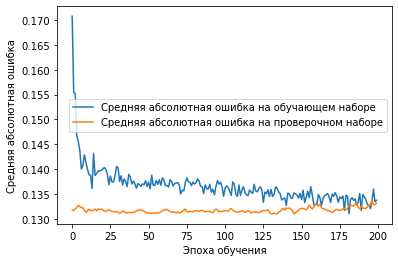

In [74]:
# графики 
plt.plot(history.history['mae'], 
         label='Средняя абсолютная ошибка на обучающем наборе')
plt.plot(history.history['val_mae'], 
         label='Средняя абсолютная ошибка на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Средняя абсолютная ошибка')
plt.legend()
plt.show()


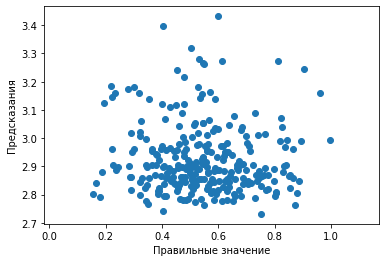

In [75]:
# Разброс предсказаний может показать перекос, если есть
plt.scatter(y_test_dl, pred) 
plt.xlabel('Правильные значение')
plt.ylabel('Предсказания')
plt.axis('equal')
plt.xlim(plt.xlim())
plt.ylim(plt.ylim())
plt.plot([-100, 100], [-100, 100])
plt.show()

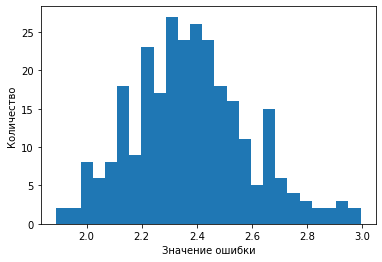

In [76]:
# Гистограмма ошибок
error = pred - y_test_dl #Разность предсказанного и правильного ответа
#Построение гистограммы
plt.hist(abs(error), bins = 25)
plt.xlabel("Значение ошибки")
plt.ylabel("Количество")
plt.show()